# Part B: Figures and analysis
# Introduction
This notebook contains all code that has been used to generate the anaylsis and figures of the  "How landscape data quality affects our perception of dominant processes in large-sample hydrology studies?" paper by do Nascimento et al. (in review). To be able to run this notebook, please ensure that you have downloaded the acompanying data of the paper. All links can be found in the data section of the paper.

Author: Thiago Nascimento (thiago.nascimento@eawag.ch)

# Import modules

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import tqdm
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from shapely.geometry import Point
from shapely.geometry import box
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.stats import spearmanr
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from matplotlib.colors import BoundaryNorm
import matplotlib as mpl
from utils.functions import find_unique_nested_catchments, find_max_unique_rows
from utils.plots import plot_watershed_groups_from_dict
from utils.plots import generate_legend_and_color_mapping
import math


# Configurations

In [2]:
# Only editable variables:
# Relative path to your local directory
PATH = ".."

# Set the directory:
os.chdir(PATH)

warnings.simplefilter(action='ignore', category=Warning)

In [3]:
path_data = r"/Users/nascimth/Documents/data/"

# Import data

### - Network information

In [4]:
network_estreams = pd.read_csv(path_data+'/EStreams/streamflow_gauges/estreams_gauging_stations.csv', encoding='utf-8')
network_estreams.set_index("basin_id", inplace = True)

# Convert 'date_column' and 'time_column' to datetime
network_estreams['start_date'] = pd.to_datetime(network_estreams['start_date'])
network_estreams['end_date'] = pd.to_datetime(network_estreams['end_date'])

# Convert to list both the nested_catchments and the duplicated_suspect columns
network_estreams['nested_catchments'] = network_estreams['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
network_estreams['duplicated_suspect'] = network_estreams['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

network_estreams

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,num_continuous_days,num_days_gaps,num_days_reliable,num_days_noflag,num_days_suspect,gauge_flag,duplicated_suspect,watershed_group,gauges_upstream,nested_catchments
basin_id,,,,,,,,,,,,,,,,,,,,,
AT000001,200014,Bangs,AT,AT_EHYD,Rhein,9.534835,47.273748,9.534835,47.273748,420,...,9497,0.0,0.0,9497.0,0.0,B,[CH000197],1,16,"[AT000001, CH000010, CH000046, CH000048, CH000..."
AT000002,200048,Schruns (Vonbunweg),AT,AT_EHYD,Litz,9.913677,47.080301,9.913677,47.080301,673,...,23103,0.0,0.0,23103.0,0.0,B,[CH000221],1,1,[AT000002]
AT000003,231662,Loruens-Aeule,AT,AT_EHYD,Ill,9.847765,47.132821,9.847765,47.132821,579,...,13513,0.0,0.0,13513.0,0.0,B,[CH000215],1,2,"[AT000002, AT000003, CH000221]"
AT000004,200592,Kloesterle (OEBB),AT,AT_EHYD,Alfenz,10.061843,47.128994,10.061843,47.128994,1014,...,8765,0.0,0.0,8765.0,0.0,B,[CH000227],1,1,[AT000004]
AT000005,200097,Buers (Bruecke L82),AT,AT_EHYD,Alvier,9.802668,47.150770,9.802668,47.150770,564,...,10957,0.0,0.0,10957.0,0.0,B,[CH000214],1,3,"[AT000005, CH000214]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UAGR0017,6682300,BASHTANOVKA,UA,UA_GRDC,KACHA,33.894739,44.691884,33.900000,44.683333,NaN,...,3652,0.0,0.0,3652.0,0.0,B,NaN,1988,1,[UAGR0017]
UAGR0018,6682500,YALTA,UA,UA_GRDC,DERE-KIOY,34.166667,44.500000,34.166667,44.500000,16,...,3652,0.0,0.0,3652.0,0.0,B,NaN,1989,1,[UAGR0018]
UAGR0019,6683010,PIONERSKOE,UA,UA_GRDC,SALHYR,34.199841,44.887685,34.200000,44.883333,307,...,3652,0.0,0.0,3652.0,0.0,B,NaN,1990,1,[UAGR0019]


### - Filtered attributes

In [5]:
#estreams_attributes = pd.read_csv('data/exploration/estreams_attributes_filtered_moselle_sm_su_tog.csv', encoding='utf-8')
estreams_attributes = pd.read_csv('data/filtered_dataset/estreams_attributes_filtered_quality_geology_v01.csv', encoding='utf-8')

estreams_attributes.set_index("basin_id", inplace = True)

# Convert to list both the nested_catchments and the duplicated_suspect columns
estreams_attributes['nested_catchments'] = estreams_attributes['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
estreams_attributes['duplicated_suspect'] = estreams_attributes['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

estreams_attributes.sort_index(inplace = True) 
estreams_attributes

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lulc_2006_agriculture,dam_num,res_num,lakes_num,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean
basin_id,,,,,,,,,,,,,,,,,,,,,
AT000001,200014,Bangs,AT,AT_EHYD,Rhein,9.534835,47.273748,9.534835,47.273748,420,...,0.127,23.0,10.0,10.0,6.62,542.33,33.844,23.025,29.307,22.0
AT000003,231662,Loruens-Aeule,AT,AT_EHYD,Ill,9.847765,47.132821,9.847765,47.132821,579,...,0.040,4.0,4.0,3.0,1.46,12.91,36.927,0.000,0.204,18.0
AT000005,200097,Buers (Bruecke L82),AT,AT_EHYD,Alvier,9.802668,47.150770,9.802668,47.150770,564,...,0.023,1.0,1.0,1.0,0.89,8.27,34.486,0.000,0.084,10.0
AT000007,231688,Beschling,AT,AT_EHYD,Ill,9.678850,47.200301,9.678850,47.200301,485,...,0.058,7.0,6.0,5.0,2.67,23.90,32.887,0.000,0.399,40.0
AT000008,200501,Amerluegen,AT,AT_EHYD,Samina,9.614203,47.205978,9.614203,47.205978,603,...,0.016,0.0,0.0,0.0,0.00,0.00,27.201,0.000,0.000,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UAGR0016,6681500,NOVOGOROZHENOYE,UA,UA_GRDC,INHUL,32.350000,47.516667,32.350000,47.516667,8,...,0.000,0.0,0.0,95.0,29.74,124.55,8.705,163.532,152.585,4.0
UAGR0017,6682300,BASHTANOVKA,UA,UA_GRDC,KACHA,33.894739,44.691884,33.900000,44.683333,NaN,...,0.000,0.0,0.0,1.0,1.43,16.43,3.805,0.000,0.000,3.0
UAGR0019,6683010,PIONERSKOE,UA,UA_GRDC,SALHYR,34.199841,44.887685,34.200000,44.883333,307,...,0.000,0.0,0.0,1.0,0.31,1.54,4.928,0.000,0.000,1.0


In [6]:
nested_catchments = pd.DataFrame(estreams_attributes['nested_catchments'])

# Now we add the outlet to the list (IF it was not before):
# Ensure that the basin_id is in the nested_catchments
for basin_id in nested_catchments.index:
    if basin_id not in nested_catchments.at[basin_id, 'nested_catchments']:
        nested_catchments.at[basin_id, 'nested_catchments'].append(basin_id)

nested_catchments

,nested_catchments
basin_id,
AT000001,"[AT000001, CH000010, CH000046, CH000048, CH000..."
AT000003,"[AT000002, AT000003, CH000221]"
AT000005,"[AT000005, CH000214]"
AT000007,"[AT000002, AT000003, AT000004, AT000005, AT000..."
AT000008,[AT000008]
...,...
UAGR0016,[UAGR0016]
UAGR0017,[UAGR0017]
UAGR0019,[UAGR0019]


### - Geological attributes (Regional: Not in EStreams)

In [7]:
geology_regional_31_classes_moselle = pd.read_csv("data/new_attributes/estreams_geology_moselle_regional_attributes.csv", encoding='utf-8')

geology_regional_31_classes_moselle.set_index("basin_id", inplace = True)

# Create a dictionary to map permeability classes to corresponding columns
permeability_columns = {
    "high": ["lit_fra_Alluvium", 'lit_fra_Coal', 'lit_fra_Conglomerate', 'lit_fra_Gravel and sand',
             'lit_fra_Sand', 'lit_fra_Sand and gravel', 'lit_fra_Sandstone and conglomerate', 'lit_fra_Sandstone'
        ],
    
    "medium": ['lit_fra_Limestone', 'lit_fra_Sandstone and marl', 'lit_fra_Sandstone and schist',
              'lit_fra_Sandstone, conglomerate and marl'],
    
    "low": ['lit_fra_Arkose', 'lit_fra_Dolomite rock', 'lit_fra_Limestone and marl', 'lit_fra_Marl', 
             'lit_fra_Marl and dolomite', 'lit_fra_Marl and limestone', 'lit_fra_Marl and sandstone',
               'lit_fra_Sandstone and siltstone', 'lit_fra_Sandstone, siltstone and schist', 
              'lit_fra_Schist and sandstone', 'lit_fra_Silt',  'lit_fra_Silt and schist', 'lit_fra_Siltstone, sandstone and schist'
              
             ],
    
    "verylow": ['lit_fra_Cristallin basement', 'lit_fra_Plutonic rock',  'lit_fra_Quarzite',
                    'lit_fra_Schist','lit_fra_Volcanic rock' 
                   ]
}

# Iterate over the permeability columns and calculate the area for each class
for permeability_class, columns in permeability_columns.items():
    geology_regional_31_classes_moselle[f'area_perm_{permeability_class}'] = geology_regional_31_classes_moselle[columns].sum(axis=1)

# Drop unnecessary columns
geology_regional_31_classes_moselle = geology_regional_31_classes_moselle[["area_perm_high", "area_perm_medium", "area_perm_low", "area_perm_verylow"]]

# Rename the columns
geology_regional_31_classes_moselle.columns = ["perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi"]

# Display the updated DataFrame
geology_regional_31_classes_moselle

geology_regional_31_classes_moselle["baseflow_index"] = estreams_attributes["baseflow_index"]
geology_regional_31_classes_moselle.corr(method="pearson")

# Concatenation
estreams_attributes[["perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi"]] = geology_regional_31_classes_moselle[["perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi"]]
estreams_attributes

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi
basin_id,,,,,,,,,,,,,,,,,,,,,
AT000001,200014,Bangs,AT,AT_EHYD,Rhein,9.534835,47.273748,9.534835,47.273748,420,...,6.62,542.33,33.844,23.025,29.307,22.0,NaN,NaN,NaN,NaN
AT000003,231662,Loruens-Aeule,AT,AT_EHYD,Ill,9.847765,47.132821,9.847765,47.132821,579,...,1.46,12.91,36.927,0.000,0.204,18.0,NaN,NaN,NaN,NaN
AT000005,200097,Buers (Bruecke L82),AT,AT_EHYD,Alvier,9.802668,47.150770,9.802668,47.150770,564,...,0.89,8.27,34.486,0.000,0.084,10.0,NaN,NaN,NaN,NaN
AT000007,231688,Beschling,AT,AT_EHYD,Ill,9.678850,47.200301,9.678850,47.200301,485,...,2.67,23.90,32.887,0.000,0.399,40.0,NaN,NaN,NaN,NaN
AT000008,200501,Amerluegen,AT,AT_EHYD,Samina,9.614203,47.205978,9.614203,47.205978,603,...,0.00,0.00,27.201,0.000,0.000,8.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UAGR0016,6681500,NOVOGOROZHENOYE,UA,UA_GRDC,INHUL,32.350000,47.516667,32.350000,47.516667,8,...,29.74,124.55,8.705,163.532,152.585,4.0,NaN,NaN,NaN,NaN
UAGR0017,6682300,BASHTANOVKA,UA,UA_GRDC,KACHA,33.894739,44.691884,33.900000,44.683333,NaN,...,1.43,16.43,3.805,0.000,0.000,3.0,NaN,NaN,NaN,NaN
UAGR0019,6683010,PIONERSKOE,UA,UA_GRDC,SALHYR,34.199841,44.887685,34.200000,44.883333,307,...,0.31,1.54,4.928,0.000,0.000,1.0,NaN,NaN,NaN,NaN


### - Catchment boundaries

In [8]:
catchment_boundaries = gpd.read_file(path_data+'//EStreams/shapefiles/estreams_catchments.shp')
catchment_boundaries

,basin_id,gauge_id,country,area_offic,area_estre,area_flag,area_rel,start_date,end_date,gauge_flag,upstream,group,geometry
0,AT000001,200014,AT,4647.9,4668.379,0,-0.440608,1996-01-01,2021-12-31,B,16,1,"POLYGON Z ((9.69406 46.54322 0, 9.6957 46.5364..."
1,AT000002,200048,AT,102.0,102.287,0,-0.281373,1958-10-01,2021-12-31,B,1,1,"POLYGON Z ((10.1365 47.02949 0, 10.13495 47.02..."
2,AT000003,231662,AT,535.2,536.299,0,-0.205344,1985-01-02,2021-12-31,B,2,1,"POLYGON Z ((10.11095 46.89437 0, 10.11226 46.8..."
3,AT000004,200592,AT,66.6,66.286,0,0.471471,1998-01-02,2021-12-31,B,1,1,"POLYGON Z ((10.14189 47.09706 0, 10.14042 47.0..."
4,AT000005,200097,AT,72.2,72.448,0,-0.343490,1990-01-01,2019-12-31,B,3,1,"POLYGON Z ((9.67851 47.06249 0, 9.67888 47.063..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17125,UAGR0017,6682300,UA,321.0,325.370,0,-1.361371,1978-01-01,1987-12-31,B,1,1988,"POLYGON Z ((33.96791 44.63291 0, 33.96791 44.6..."
17126,UAGR0018,6682500,UA,49.7,47.594,0,4.237425,1978-01-01,1987-12-31,B,1,1989,"POLYGON Z ((34.19958 44.58291 0, 34.20291 44.5..."
17127,UAGR0019,6683010,UA,261.0,244.731,1,6.233333,1978-01-01,1987-12-31,B,1,1990,"POLYGON Z ((34.19624 44.88375 0, 34.19624 44.8..."
17128,UAGR0020,6683200,UA,760.0,731.073,0,3.806184,1978-01-01,1987-12-31,B,1,1991,"POLYGON Z ((35.78708 47.28708 0, 35.78708 47.2..."


### - Geological maps (in .shp)

In [9]:
# Import the geological maps (in .shp), downloaded and stored from their respective official providers.
## Global geology map
GLiM = gpd.read_file(path_data+"/gis/lithology/GLiM.shp")

attribute_field = 'xx'
GLiM_dissolved = GLiM.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_dissolved["class"] = GLiM_dissolved.index

# Reproject the map
print("CRS of GLiM:", GLiM_dissolved.crs)
GLiM_reprojected = GLiM_dissolved.to_crs("EPSG:4326")

## Continental geology map
IHME = gpd.read_file(path_data+"/gis/lithology//ihme1500_litho12345_ec4060_v12_poly.shp")

# Check for and fix invalid geometries
if not IHME.geometry.is_valid.all():
    IHME.geometry = IHME.geometry.buffer(0)

attribute_field = 'LEVEL3'
IHME_dissolved = IHME.dissolve(by=attribute_field)

## Now we create a new feature with the lithology class:
IHME_dissolved["class"] = IHME_dissolved.index

# Reproject the map
print("CRS of GLiM:", IHME_dissolved.crs)
IHME_reprojected = IHME_dissolved.to_crs("EPSG:4326")

CRS of GLiM: PROJCS["World_Eckert_IV",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Eckert_IV"],PARAMETER["central_meridian",0],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["ESRI","54012"]]
CRS of GLiM: EPSG:3035


In [10]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

##################################################################################################################
# Global geology clipped to the Moselle catchment
GLiM_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/glim_moselle_wgs.shp")

attribute_field = 'xx'
GLiM_moselle_dissolved = GLiM_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_moselle_dissolved["class"] = GLiM_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_glim = {
    "very low": ['ev', 'ig', 'pa', 'pb', 'va', 'vb', "wb"],
    "low": ['mt', 'pi', 'py', 'vi'],
    "medium": ['sc', 'sm'],
    "high": ['su', 'ss']
}

# Create a new column for reclassified permeability
def reclassify_glim_class(class_name):
    for permeability, classes in permeability_columns_glim.items():
        if class_name in classes:
            return permeability
    return None

GLiM_moselle_dissolved['permeability'] = GLiM_moselle_dissolved['class'].apply(reclassify_glim_class)

##################################################################################################################
# Continental geology clipped to the Moselle catchment
geology_median_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/geology_median_moselle_wgs.shp")

attribute_field = 'LEVEL3'
geology_median_moselle_dissolved = geology_median_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_median_moselle_dissolved["class"] = geology_median_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Conglomerates", "Conglomerates and sands", "Gravels", 
             "Sands", "Sandstones", "Sandstones and sands"],
    "medium": ["Conglomerates and clays", "Gneisses", "Limestones", 
               "Limestones and sands", "Sandstones and clays", "Sandstones and marls",
               "Limestones and clays", "Limestones and marls", "Marlstones and sands"],
    "low": ["Claystones and clays", "Marbles",
              "Marls", "Marlstones", "Marlstones and clays", 
              "Marlstones and marls", "Phyllites", "Schists",
              "Silts"],
    "very low": ["Plutonic rocks", "Volcanic rocks", 
                    "Inland water", "Snow field / ice field",
                    "Clays",  'Quartzites', "Shales"]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_median_moselle_dissolved['permeability'] = geology_median_moselle_dissolved['class'].apply(reclassify_geology_class)

##################################################################################################################
# Regional geology clipped to the Moselle catchment
geology_high_moselle = gpd.read_file(path_data+'/gis/lithology/moselle_hr_ff.shp')

attribute_field = 'Labels01'
geology_high_moselle_dissolved = geology_high_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_high_moselle_dissolved["class"] = geology_high_moselle_dissolved.index

# Set the CRS to WGS84
geology_high_moselle_dissolved = geology_high_moselle_dissolved.to_crs(epsg=4326)


# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Alluvium", 'Coal', 'Conglomerate', 'Gravel and sand',
             'Sand', 'Sand and gravel', 'Sandstone and conglomerate', 'Sandstone'
        ],
    
    "medium": ['Limestone', 'Sandstone and marl', 'Sandstone and schist',
              'Sandstone, conglomerate and marl'],
    
    "low": ['Arkose', 'Dolomite rock', 'Limestone and marl', 'Marl', 
             'Marl and dolomite', 'Marl and limestone', 'Marl and sandstone',
             'Sandstone and siltstone', 'Sandstone, siltstone and schist', 
              'Schist and sandstone', 'Silt',  'Silt and schist', 'Siltstone, sandstone and schist'
              ,"Siltstone"
             ],
    
    "very low": ['Cristallin basement', 'Plutonic rock',  'Quarzite',
                    'Schist','Volcanic rock' 
                   ]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_high_moselle_dissolved['permeability'] = geology_high_moselle_dissolved['class'].apply(reclassify_geology_class)

Current CRS: EPSG:4326
Image is already in WGS84 CRS.


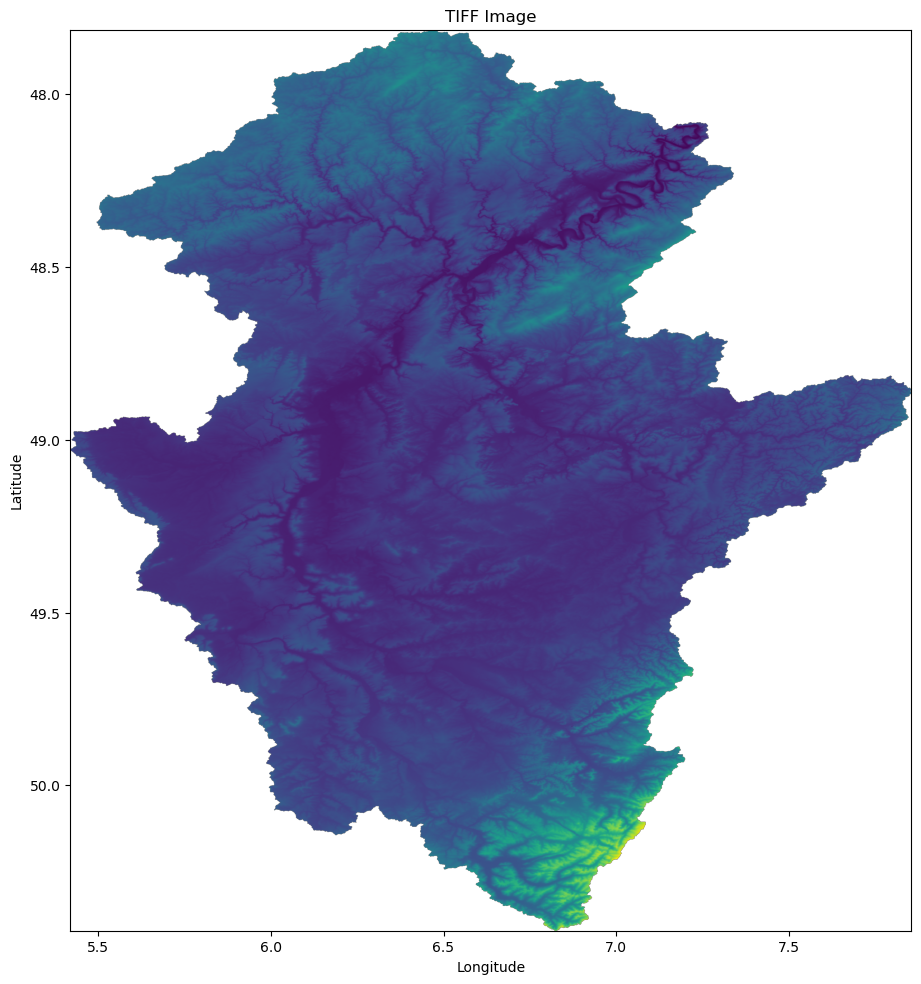

In [11]:
##################################################################################################################
# Terrain (elevation)
# Path to the TIFF file
tiff_path = path_data+"/gis/paper_moselle/raster/elevation/moselle_srtm.tif"

# Open the TIFF file
with rasterio.open(tiff_path) as src:
    # Check the current CRS
    current_crs = src.crs
    print(f'Current CRS: {current_crs}')

    # Define the target CRS (WGS84)
    dst_crs = 'EPSG:4326'  # WGS84

    # If the current CRS is not WGS84, reproject the image
    if current_crs != dst_crs:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        # Create an in-memory array to hold the reprojected data
        reprojected_image = rasterio.io.MemoryFile().open(**kwargs)

        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(reprojected_image, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

        # Read the reprojected image
        elevation_wgs = reprojected_image.read(1)

        print(f'Image reprojected to WGS84 and stored in-memory.')
    else:
        # Read the original image if it is already in WGS84
        elevation_wgs = src.read(1)
        transform = src.transform
        print('Image is already in WGS84 CRS.')

# Calculate the extent
left, bottom, right, top = transform * (0, 0), transform * (elevation_wgs.shape[1], 0), transform * (elevation_wgs.shape[1], elevation_wgs.shape[0]), transform * (0, elevation_wgs.shape[0])
extent = (left[0], right[0], bottom[1], top[1])

# Plot the image with the correct extent
fig, ax = plt.subplots(1, 1, figsize=(16.6, 11.7))
ax.imshow(elevation_wgs, cmap='viridis', extent=extent)
ax.set_title('TIFF Image')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

### - Some extra shapefiles for figures

In [12]:
# Subset of the 5 regional catchments further evaluated: ["PL000936", "FR000867", "DEBU1959", "ES000665", "FR001604"]
rivers_fivesubs = gpd.read_file(path_data+'/gis/paper_moselle/rivers/rivers_merit_five_subs_dissolved.shp')
rivers_fivesubs_es = gpd.read_file(path_data+'/gis/paper_moselle/rivers/rivers_merit_five_subs_withES_dissolved.shp')
rivers_garonne = gpd.read_file(path_data+'/gis/paper_moselle/rivers/rivers_merit_garonne_dissolved.shp')
rivers_cinca = gpd.read_file(path_data+'/gis/paper_moselle/rivers/rivers_merit_cinca_dissolved.shp')

# Delineation of the Moselle catchment
moselle_del = gpd.read_file(path_data+'/gis/paper_moselle//gis/moselle_delienation.shp')

# Shapefile of the river network (MERIT) over the Mosellle
river_moselle = gpd.read_file(path_data+'/gis/paper_moselle//gis/river_merit_moselle_clipped_dissolved.shp')

# Analysis and results


## Large-scale: 63 catchments
Here we evaluate the correlation for the 63 regional catchments worked with

In [13]:
# This list of 72 regional catchments was defined using a visual inspection with QGIS:
list_cats_list = ["ES000801", "ES000665","ES001243", "ES000196", "ES000116", "ES000194", "ES001080", "ES000316","ES000397","ES000339","ES000331", 
                  "GB000472", "GB000271", "GB000153","ITTO0361","ITVE0408","ITLC0146", "ITPI0183", "SE000102", "FI000668", "FI000585", "FI000557", 
                  "FI000226", "FI000137", "PL000936","PL000905", "PL000868", "PL000794","HR000048","HUGR0037", "AT000393", "PL000253", 
                  "PL000349", "PL000015","CZ000097","DEST1711", "DEBY0711","DEBY0724", "DEBY0697", "DEBU1953", "NL000008","CH000026", "FR002679", 
                  "FR004615", "NL000016", "BEVL0155", "FR000408", "FR000373", "FR000345", "FR001071", "FR003922", "FR003986", "FR002118", "FR001952",
                  "FR002029", "FR001604", "FR004221", "ES000738","ES001171", "ES001010", "PL001056", "PL000536", "HR000278", "CZ000236","DEST1707", 
                  "DEBE0155","FR002758","FR002462","FR001394", "FR000867", "FR004308", "DEBU1959"] 

In [14]:
## Create the Q5/Qmean column
#estreams_attributes["q_5q_mean"] = estreams_attributes["q_5"]/estreams_attributes["q_mean"]

# Initialize dictionaries and DataFrames to store grouped correlations and geological differences
corr_max_group_dfs_dict = {}
corr_max_geology_diff = pd.DataFrame()
corr_max_geology_diff_abs = pd.DataFrame()
corr_max_geology_diff_above_05 = pd.DataFrame()

# Initialize DataFrames to store correlations for different geological, climate, soil, and land-use variables
corr_low_geology_df = pd.DataFrame()
corr_med_geology_df = pd.DataFrame()
corr_low_geology_df_25 = pd.DataFrame()
corr_med_geology_df_25 = pd.DataFrame()
corr_med_climate_df = pd.DataFrame()
corr_med_soils_df = pd.DataFrame()
corr_med_topography_df = pd.DataFrame()
corr_med_landuse_df = pd.DataFrame()

# DataFrame to store the number of nested catchments per watershed
lens_df = pd.DataFrame()

# Loop over each list of catchments in the main list
for list_cats in tqdm.tqdm(list_cats_list):
    nested_cats_df = nested_catchments.loc[[list_cats], :] # Select rows for the current list of catchments

    # Filter catchments using a function to find the ones with maximum unique rows
    nested_cats_filtered = find_max_unique_rows(nested_cats_df)
    nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]

    # Initialize a dictionary to store data for each selected catchment with more than 20 nested catchments
    estreams_attributes_dfs = {}
    for catchment in nested_cats_filtered:
        nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']              # Retrieve the nested list of catchments for the current catchment
        nested_clip = [value for value in nested_clip if value in estreams_attributes.index]   # Filter values to include only those that exist in the index of estreams_attributes
        cat_clip = estreams_attributes.loc[nested_clip, :]                                     # Filter the estreams_attributes DataFrame based on the filtered nested_clip
        estreams_attributes_dfs[catchment] = cat_clip                                          # Store the resulting DataFrame in the dictionary

    # Create DataFrame to store the number of nested catchments per catchment
    catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
    for catchment, data in estreams_attributes_dfs.items():
        catchment_lens.loc[catchment, "len"] = len(data)                                       # Count of nested catchments


    # Filter catchments with at least 10 nested catchments
    nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]
    nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]  # Here we filter the catchemnts for the list (again, after we apply our function):


    # Reinitialize dictionary to store data for selected catchments above 20 nested catchments
    estreams_attributes_dfs = {}
    for catchment in nested_cats_filtered_abovevalue_df.index:
        nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']   # Retrieve the nested list of catchments for the current catchment
        nested_clip = [value for value in nested_clip if value in estreams_attributes.index]   # Filter values to include only those that exist in the index of estreams_attributes
        cat_clip = estreams_attributes.loc[nested_clip, :]                                     # Filter the estreams_attributes DataFrame based on the filtered nested_clip
        estreams_attributes_dfs[catchment] = cat_clip                                          # Store the resulting DataFrame in the dictionary


    # Further filter catchments to include data from 2009 onwards
    estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
    #estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date >= "2009"]

    nested_cats_filtered_abovevalue["len"] = len(estreams_attributes_dfs_cat)
    # Initialize a dictionary to store correlation DataFrames for each variable in a selected range
    correlation_dict = {}

    signatures = ['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 
                'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq']
    
    for variable in signatures:
        correlation_df = pd.DataFrame()                                                        # Initialize an empty DataFrame to store correlations

        # Iterate over each watershed group
        for catchment in estreams_attributes_dfs.keys():

            estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
            'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
            'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
            'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq',
            
            'p_mean', 'pet_mean',
            'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
            'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
            'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
            'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

            "perm_high_glob", "perm_medium_glob", "perm_low_glob", "perm_verylow_glob", 
            "perm_high_cont", "perm_medium_cont", "perm_low_cont", "perm_verylow_cont",
            "perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi",

            'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
            'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
            'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
            'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
            'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
            'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
            'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
            
            # Calculate correlations between the current variable and other variables
            correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
            correlation_df[catchment] = correlations                                               # Store the correlations to the DataFrame

        # Add the correlation DataFrame to the dictionary
        correlation_dict[variable] = correlation_df

    # Create a list to store all correlation DataFrames with a signature column
    correlation_list = []
    # Iterate over all keys in the dictionary and append their DataFrame to the list with an added 'signature' column
    for signature in correlation_dict.keys():
        corr_df = correlation_dict[signature].T
        corr_df['signature'] = signature                                                           # Add a column to identify the signature
        correlation_list.append(corr_df)

    # Concatenate all correlation DataFrames along the rows
    combined_correlation_df = pd.concat(correlation_list)

    # Preserve the order of the signatures by converting to categorical type
    combined_correlation_df['signature'] = pd.Categorical(
        combined_correlation_df['signature'],
        categories=list(correlation_dict.keys()),
        ordered=True)
    combined_correlation_df.set_index('signature', inplace=True)                                   # Set 'signature' as index

    # Dictionary to classify variables into categories (climatic, topography, geology, etc.)
    variable_dict = {
        'p_mean': 'climatic',
        'pet_mean': 'climatic',
        'aridity': 'climatic',
        'p_seasonality': 'climatic',
        'frac_snow': 'climatic',
        'hp_freq': 'climatic',
        'hp_dur': 'climatic',
        'hp_time': 'climatic',
        'lp_freq': 'climatic',
        'lp_dur': 'climatic',
        'lp_time': 'climatic',
        'ele_mt_max': 'topography',
        'ele_mt_mean': 'topography',
        'ele_mt_min': 'topography',
        'slp_dg_mean': 'topography',
        'flat_area_fra': 'topography',
        'steep_area_fra': 'topography',
        'elon_ratio': 'topography',
        'strm_dens': 'topography',
        'lit_dom': 'geology',
        'bedrk_dep': 'soil',

        'perm_verylow_glob': 'geology_low',
        'perm_low_glob': 'geology_low',
        'perm_medium_glob': 'geology_low',
        'perm_high_glob': 'geology_low',

        'root_dep_mean': 'soil',
        'root_dep_max': 'soil',
        'root_dep_min': 'soil',
        'soil_tawc_mean': 'soil',
        'soil_fra_sand_mean': 'soil',
        'soil_fra_silt_mean': 'soil',
        'soil_fra_clay_mean': 'soil',
        'soil_fra_grav_mean': 'soil',
        'soil_bd_mean': 'soil',
        'soil_oc_mean': 'soil',
        'lai_mean': 'lulc',
        'ndvi_mean': 'lulc',
        'lulc_2006_urban': 'lulc',
        'lulc_2006_NonIrriAgri': 'lulc',
        'lulc_2006_Agric': 'lulc',
        'lulc_2006_forest': 'lulc',
        'lulc_2006_grass': 'lulc',
        'lulc_2006_agriculture': 'lulc',
        'dam_num': 'hydrology',
        'res_num': 'hydrology',
        'lakes_num': 'hydrology',
        'sno_cov_mean': 'climatic',
        'irri_1990': 'hydrology',
        'irri_2005': 'hydrology',

        'perm_high_cont': 'geology_med',
        'perm_medium_cont': 'geology_med',
        'perm_low_cont': 'geology_med',
        'perm_verylow_cont': 'geology_med',

        'stations_num_p_mean': 'climatic',

        'perm_high_regi': "geology_high", 
        'perm_medium_regi': "geology_high", 
        'perm_low_regi': "geology_high",
        'perm_verylow_regi': "geology_high",
        "area_estreams": "topography"
    }


    # Define variable classes for grouping
    classes = ["climatic", "geology", "geology_low", "lulc", "soil", "topography", "vegetation", "hydrology", "geology_med", "geology_high"]

    # Initialize DataFrame to store maximum correlations by group
    corr_max_group_dfs = pd.DataFrame(columns = signatures)
    for signature in signatures:
        correlation_df = correlation_dict[signature] # Correlation data for each signature
        
        # Initialize the dataframe with columns for each class's maximum correlation and feature
        columns = []
        for cls in classes:
            columns.append(f"corr_max_{cls}")
            columns.append(f"corr_max_feature_{cls}")

        corr_max_group_df = pd.DataFrame(index=correlation_df.columns, columns=columns)

        # Populate the dataframe with the maximum correlations for each class
        for catchment in correlation_df.columns:
            max_corr = {cls: 0 for cls in classes}
            max_feature = {cls: None for cls in classes}

            for feature in correlation_df.index:
                cls = variable_dict[feature]
                corr_value = abs(correlation_df.loc[feature, catchment])

                if corr_value > abs(max_corr[cls]):
                    max_corr[cls] = correlation_df.loc[feature, catchment]
                    max_feature[cls] = feature

            for cls in classes:
                corr_max_group_df.loc[catchment, f"corr_max_{cls}"] = max_corr[cls]
                corr_max_group_df.loc[catchment, f"corr_max_feature_{cls}"] = max_feature[cls]

        for cls in classes:
            corr_max_group_df[f"corr_max_feature_{cls}"] = corr_max_group_df[f"corr_max_feature_{cls}"].map(variable_dict)

        # Format and organize columns
        corr_max_group_df = corr_max_group_df[['corr_max_climatic', 'corr_max_geology_low', "corr_max_geology_med", "corr_max_geology_high",
                                                        'corr_max_lulc', 'corr_max_soil', 'corr_max_topography', 
                                                        'corr_max_vegetation', 'corr_max_hydrology']]

        # Sort and add additional columns
        corr_max_group_df.iloc[:, 0:7] = corr_max_group_df.iloc[:, 0:7].astype(float)
        corr_max_group_df = corr_max_group_df.astype(float)
        corr_max_group_df = corr_max_group_df.T.iloc[0:-2]
        corr_max_group_dfs[signature] = corr_max_group_df
    
    corr_max_group_dfs_dict[list_cats] = corr_max_group_dfs

    # Compute the maximum and then the absolute difference:
    corr_max_group_dfs_abs = corr_max_group_dfs.abs()
    corr_max_geology_diff[list_cats] = ((corr_max_group_dfs_abs.T["corr_max_geology_med"] - corr_max_group_dfs_abs.T["corr_max_geology_low"])/corr_max_group_dfs_abs.T["corr_max_geology_low"])*100
    corr_max_geology_diff_abs[list_cats] = corr_max_group_dfs_abs.T["corr_max_geology_med"] - corr_max_group_dfs_abs.T["corr_max_geology_low"]

    # Store correlation data for each category
    corr_low_geology_df[list_cats] = corr_max_group_dfs_abs.T["corr_max_geology_low"]
    corr_med_geology_df[list_cats] = corr_max_group_dfs_abs.T["corr_max_geology_med"]
    corr_med_climate_df[list_cats] = corr_max_group_dfs_abs.T["corr_max_climatic"]
    corr_med_soils_df[list_cats] = corr_max_group_dfs_abs.T["corr_max_soil"]
    corr_med_topography_df[list_cats] = corr_max_group_dfs_abs.T["corr_max_topography"]
    corr_med_landuse_df[list_cats] = corr_max_group_dfs_abs.T["corr_max_lulc"]
    
    # Save length of each catchment with filtered rows
    lens_df[list_cats] = nested_cats_filtered_abovevalue.len.values

    # Filter catchments with at least 30 nested catchments
    if nested_cats_filtered_abovevalue.len.values.max() >=25:
        corr_low_geology_df_25[list_cats] = corr_max_group_dfs_abs.T["corr_max_geology_low"]
        corr_med_geology_df_25[list_cats] = corr_max_group_dfs_abs.T["corr_max_geology_med"]

    if corr_max_group_dfs_abs.T["corr_max_geology_med"].baseflow_index > 0.5 or corr_max_group_dfs_abs.T["corr_max_geology_low"].baseflow_index > 0.5:
    #    # Compute the percentage difference and the absolute difference for the filtered rows
        corr_max_geology_diff_above_05[list_cats] = corr_max_group_dfs_abs.T["corr_max_geology_med"] - corr_max_group_dfs_abs.T["corr_max_geology_low"]

100%|██████████| 72/72 [00:08<00:00,  8.82it/s]


In [15]:
# Initialize an empty DataFrame for storing baseflow index (BFI) data
dataframe_BFI = pd.DataFrame()

# Assign baseflow index values from various sources to the BFI DataFrame
dataframe_BFI["geology_global"] = corr_low_geology_df.T["baseflow_index"]            # Baseflow index for global geology
dataframe_BFI["geology_continental"] = corr_med_geology_df.T["baseflow_index"]       # Baseflow index for continental geology
dataframe_BFI["climate"] = corr_med_climate_df.T["baseflow_index"]                   # Baseflow index for climate
dataframe_BFI["soils"] = corr_med_soils_df.T["baseflow_index"]                       # Baseflow index for soils
dataframe_BFI["topography"] = corr_med_topography_df.T["baseflow_index"]             # Baseflow index for topography
dataframe_BFI["landuse"] = corr_med_landuse_df.T["baseflow_index"]                   # Baseflow index for land use

# Calculate the maximum baseflow index from selected categories and store it
dataframe_BFI["max"] = dataframe_BFI[["climate", "soils", "topography", "landuse"]].T.max()

# Add additional attributes: area, dams, lakes, and length
dataframe_BFI["area"] = estreams_attributes.loc[list_cats_list, :].area_estreams     # Area of each catchment
dataframe_BFI["dams"] = estreams_attributes.loc[list_cats_list, :].res_num           # Number of reservoirs (dams)
dataframe_BFI["lakes"] = estreams_attributes.loc[list_cats_list, :].lakes_num        # Number of lakes
dataframe_BFI["len"] = lens_df.T                                                     # Length of each catchment

# Filter the BFI DataFrame to include only rows with a length of 30 or more catchments
dataframe_BFI = dataframe_BFI[dataframe_BFI.len >= 25]

# Initialize an empty DataFrame for storing flow duration curve (FDC) data (q_95 values)
dataframe_other = pd.DataFrame()

# Assign q_95 values from various sources to the FDC DataFrame
dataframe_other["geology_global"] = corr_low_geology_df.T["q_5"]            # q_95 for global geology
dataframe_other["geology_continental"] = corr_med_geology_df.T["q_5"]      # q_95 for continental geology
dataframe_other["climate"] = corr_med_climate_df.T["q_5"]                  # q_95 for climate
dataframe_other["soils"] = corr_med_soils_df.T["q_5"]                      # q_95 for soils
dataframe_other["topography"] = corr_med_topography_df.T["q_5"]            # q_95 for topography
dataframe_other["landuse"] = corr_med_landuse_df.T["q_5"]                  # q_95 for land use

# Calculate the maximum q_95 from selected categories and store it
dataframe_other["max"] = dataframe_other[["climate", "soils", "topography", "landuse"]].T.max()

# Add additional attributes: area, dams, lakes, and length
dataframe_other["area"] = estreams_attributes.loc[list_cats_list, :].area_estreams     # Area of each catchment
dataframe_other["dams"] = estreams_attributes.loc[list_cats_list, :].res_num           # Number of reservoirs (dams)
dataframe_other["lakes"] = estreams_attributes.loc[list_cats_list, :].lakes_num        # Number of lakes
dataframe_other["len"] = lens_df.T                                                     # Length of each catchment

# Filter the FDC DataFrame to include only rows with a length of 30 or more catchments
dataframe_other = dataframe_other[dataframe_other.len >= 25]

In [16]:
# Here we check the final number of catchments left:
print(len(dataframe_BFI))

63


In [17]:
filtered_df = dataframe_BFI[
    (dataframe_BFI["geology_global"] >= 0.5) |
    (dataframe_BFI["geology_continental"] >= 0.5)
]
filtered_df.index.tolist()

['ES000801',
 'ES001243',
 'ES000194',
 'ES001080',
 'ES000316',
 'ES000331',
 'GB000472',
 'ITTO0361',
 'FI000226',
 'FI000137',
 'PL000936',
 'PL000868',
 'PL000794',
 'PL000253',
 'CZ000097',
 'DEST1711',
 'FR002679',
 'NL000016',
 'BEVL0155',
 'FR003922',
 'FR002029',
 'FR001604',
 'ES001171',
 'DEST1707',
 'FR002758',
 'FR002462',
 'FR001394',
 'FR000867',
 'DEBU1959']

In [18]:
filtered_df = dataframe_BFI[
    (dataframe_BFI["geology_global"] >= 0.5)
]
filtered_df.index.tolist()

['ES000801',
 'ES001243',
 'ES001080',
 'ES000316',
 'ES000331',
 'GB000472',
 'FI000226',
 'FI000137',
 'PL000868',
 'PL000253',
 'CZ000097',
 'DEST1711',
 'BEVL0155',
 'FR003922',
 'FR002029',
 'FR001604',
 'ES001171',
 'DEST1707',
 'FR002758',
 'FR002462',
 'FR001394',
 'FR000867',
 'DEBU1959']

In [19]:
check_values = dataframe_BFI.copy()
check_values["diff"] = dataframe_BFI["geology_continental"] - dataframe_BFI["geology_global"]
check_values["diff2"] = dataframe_BFI["geology_global"] - dataframe_BFI["geology_continental"]


In [20]:
check_values[check_values["diff"] > 0].mean()

geology_global             0.338094
geology_continental        0.519104
climate                    0.519529
soils                      0.520595
topography                 0.532243
landuse                    0.499030
max                        0.636438
area                   18219.888656
dams                      14.937500
lakes                    133.781250
len                       66.437500
diff                       0.181010
diff2                     -0.181010
dtype: float64

In [21]:
check_values[check_values["diff"] < 0].mean()

geology_global             0.476180
geology_continental        0.326356
climate                    0.491020
soils                      0.494598
topography                 0.490681
landuse                    0.472131
max                        0.578378
area                   20253.498645
dams                      16.741935
lakes                    127.967742
len                       75.580645
diff                      -0.149824
diff2                      0.149824
dtype: float64

In [22]:
len(check_values[check_values["diff"] >= 0.0])/63

0.5079365079365079

In [23]:
check_values.corr(method="spearman")

,geology_global,geology_continental,climate,soils,topography,landuse,max,area,dams,lakes,len,diff,diff2
geology_global,1.000000,0.323541,0.335301,0.486319,0.295027,0.217694,0.325077,-0.056644,0.153373,-0.035241,-0.148315,-0.491407,0.491407
geology_continental,0.323541,1.000000,0.392473,0.451901,0.423243,0.308852,0.510129,-0.100614,-0.004711,-0.121783,-0.159815,0.600134,-0.600134
climate,0.335301,0.392473,1.000000,0.551507,0.733007,0.520017,0.792531,-0.014161,-0.114867,0.066641,-0.256155,0.073205,-0.073205
soils,0.486319,0.451901,0.551507,1.000000,0.592118,0.510993,0.753600,0.052707,-0.073790,0.013515,-0.202139,0.043347,-0.043347
topography,0.295027,0.423243,0.733007,0.592118,1.000000,0.666139,0.794019,0.038402,-0.087515,0.159521,-0.122772,0.150634,-0.150634
landuse,0.217694,0.308852,0.520017,0.510993,0.666139,1.000000,0.711598,-0.057940,-0.168275,0.169123,-0.056368,0.149002,-0.149002
max,0.325077,0.510129,0.792531,0.753600,0.794019,0.711598,1.000000,-0.179579,-0.237378,-0.019757,-0.380079,0.242320,-0.242320
area,-0.056644,-0.100614,-0.014161,0.052707,0.038402,-0.057940,-0.179579,1.000000,0.222236,0.535505,0.647349,-0.109879,0.109879
dams,0.153373,-0.004711,-0.114867,-0.073790,-0.087515,-0.168275,-0.237378,0.222236,1.000000,-0.208479,0.278267,-0.151186,0.151186
lakes,-0.035241,-0.121783,0.066641,0.013515,0.159521,0.169123,-0.019757,0.535505,-0.208479,1.000000,0.467206,-0.085198,0.085198


In [24]:
check_values = check_values.iloc[:, 0:6]
check_values

,geology_global,geology_continental,climate,soils,topography,landuse
ES000801,0.671226,0.760661,0.779990,0.666781,0.712600,0.629383
ES000665,0.328085,0.385165,0.635604,0.613251,0.596042,0.271526
ES001243,0.537908,0.574462,0.546754,0.669907,0.393539,0.451501
ES000196,0.100178,0.452806,0.188378,0.517021,0.278245,0.273517
ES000194,0.108034,0.503818,0.722896,0.416710,0.686894,0.453534
...,...,...,...,...,...,...
FR002462,0.726157,0.702085,0.573365,0.691240,0.662744,0.781263
FR001394,0.631652,0.338779,0.350955,0.494535,0.332725,0.208701
FR000867,0.797377,0.363335,0.746582,0.537141,0.657761,0.433442
FR004308,0.292781,0.215158,0.231480,0.328402,0.198398,0.203027


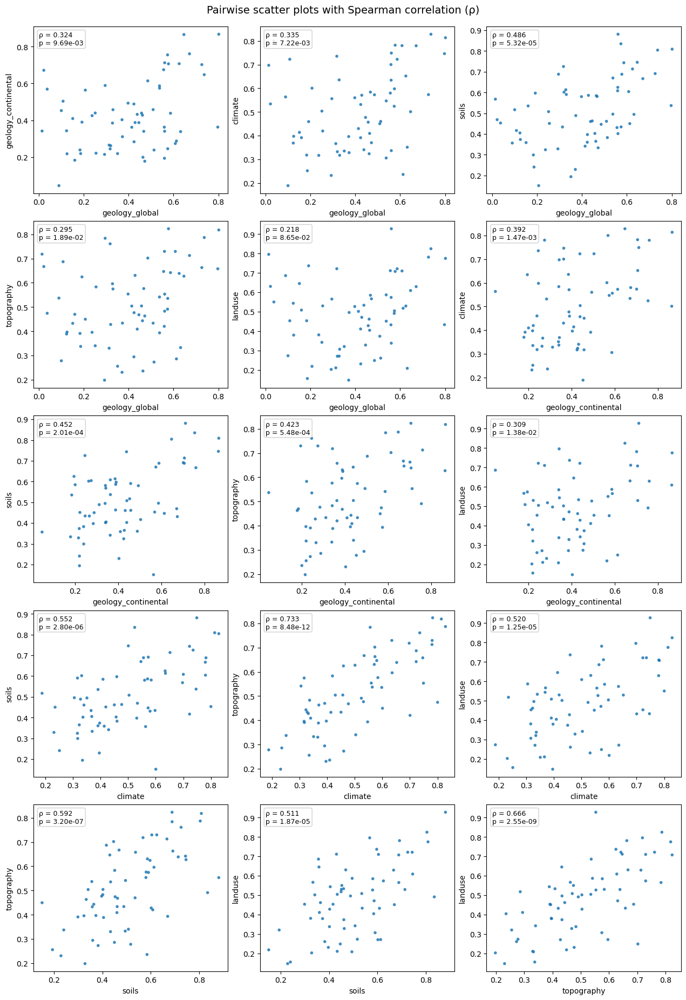

In [25]:
import math
import matplotlib.pyplot as plt
from itertools import combinations
from scipy.stats import spearmanr

# columns to use (rename/edit if your df uses different names)
cols = ["geology_global", "geology_continental", "climate",
        "soils", "topography", "landuse"]

pairs = list(combinations(cols, 2))
n = len(pairs)

df = check_values.copy()
# layout
ncols = 3
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4.2, nrows * 3.6), constrained_layout=True)

# if axes comes back 1D, normalize to 2D indexable array
if nrows == 1:
    axes = [axes]
axes = axes.reshape(nrows, ncols) if hasattr(axes, "reshape") else axes

for i, (xcol, ycol) in enumerate(pairs):
    r, c = divmod(i, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]

    x = df[xcol]
    y = df[ycol]

    # scatter
    ax.scatter(x, y, s=16, alpha=0.85, edgecolors="none")

    # axis labels
    ax.set_xlabel(xcol)
    ax.set_ylabel(ycol)

    # Spearman correlation (omit NaNs)
    rho, pval = spearmanr(x, y, nan_policy="omit")

    # annotate in the top-left corner of the subplot
    ax.text(
        0.03, 0.97,
        f"ρ = {rho:.3f}\np = {pval:.2e}",
        transform=ax.transAxes,
        va="top", ha="left",
        fontsize=9,
        bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="0.8", alpha=0.9)
    )

# hide any unused axes (e.g., if layout has extra slots)
for j in range(i + 1, nrows * ncols):
    r, c = divmod(j, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]
    ax.axis("off")

fig.suptitle("Pairwise scatter plots with Spearman correlation (ρ)", fontsize=14, y=1.02)
plt.show()

# optionally save
# fig.savefig("pairwise_scatter_spearman.png", dpi=300, bbox_inches="tight")


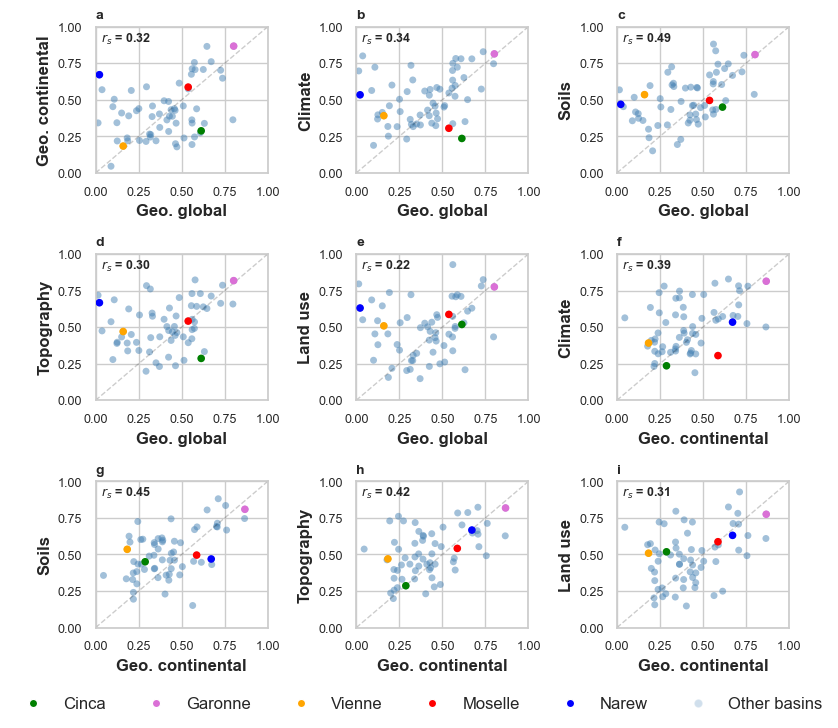

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib.lines import Line2D
# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# columns
geology_cols = ["geology_global", "geology_continental"]
other_cols = ["climate", "soils", "topography", "landuse"]

# build pairs: geology_global vs all others + geology_continental vs all others
pairs = [("geology_global", col) for col in ["geology_continental"] + other_cols] \
      + [("geology_continental", col) for col in other_cols]

n = len(pairs)

df = check_values.copy()

# layout
ncols = 3
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(8, 7), constrained_layout=True)

if nrows == 1:
    axes = [axes]
axes = axes.reshape(nrows, ncols) if hasattr(axes, "reshape") else axes

custom_x_labels = [
    'Geo. global', 'Geo. global', 'Geo. global', 'Geo. global', 'Geo. global', 
    'Geo. continental', 'Geo. continental', 'Geo. continental', 'Geo. continental']

custom_y_labels = [
    'Geo. continental', 'Climate', 'Soils', 'Topography', 'Land use',
    'Climate', 'Soils', 'Topography', 'Land use'
]
j = 0
for i, (xcol, ycol) in enumerate(pairs):
    r, c = divmod(i, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]

    x = df[xcol]
    y = df[ycol]
    
    ax.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1, alpha=0.2)

    # scatter
    ax.scatter(x, y, s=25, alpha=0.5, edgecolors="none", color="steelblue")

    # Highlighted basins with color + marker
    highlight_colors = {
        "DEBU1959": "red", "PL000936": "blue", "ES000331": "green",
        "FR003986": "orange", "FR001604": "orchid"
    }

    for basin, color in highlight_colors.items():

        ax.scatter(x[basin], y[basin], color=color, alpha=1.00, s=30,
                        marker="o", edgecolor='none', zorder=20)
        

    # axis labels
    ax.set_xticks([0, 0.25, 0.5, 0.75, 1])
    ax.set_xticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=9)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1])
    ax.set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=9)
    ax.set_title(f"{chr(65 + i).lower()}", fontsize=10, loc="left", fontweight="bold")


    ax.set_xlabel(custom_x_labels[j], fontweight="bold")
    ax.set_ylabel(custom_y_labels[j], fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)


    # Spearman correlation
    rho, pval = spearmanr(x, y, nan_policy="omit")

    ax.text(
        0.03, 0.97,
        f"$r_s$ = {rho:.2f}",
        transform=ax.transAxes,
        va="top", ha="left",
        fontsize=9,
        fontweight="bold"
    )
    j = j +1 
# hide any unused axes
for j in range(i + 1, nrows * ncols):
    r, c = divmod(j, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]
    ax.axis("off")


# Legend
legend_elements = [
    # Basin colors
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=6, label='Cinca'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orchid', markersize=6, label='Garonne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=6, label='Vienne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='Moselle'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='Narew'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='steelblue', markersize=6, label='Other basins', alpha=0.25),
]

fig.legend(handles=legend_elements,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.05),
           ncol=6,
           frameon=False,
           fontsize='medium')


# Final layout and save
plt.tight_layout()
#plt.savefig(r"results//figs//fig3_new.pdf", dpi=300, bbox_inches='tight')
plt.show()

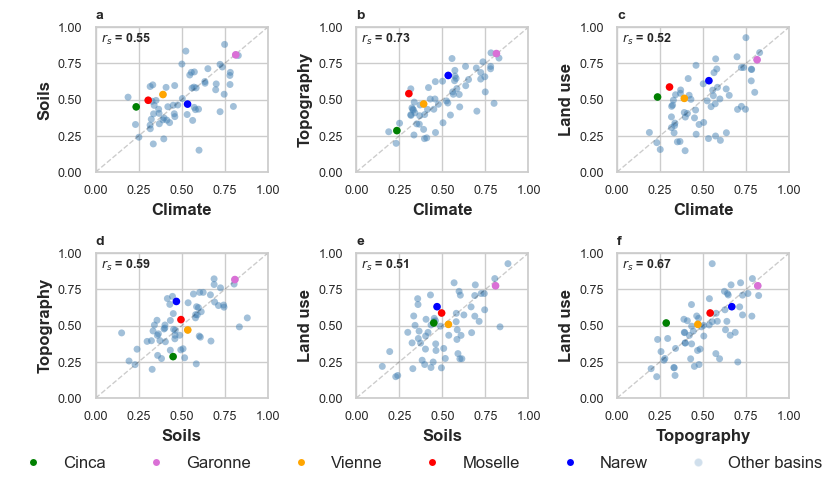

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib.lines import Line2D
# Set seaborn style
sns.set(style="whitegrid", context="notebook")


pairs = [('climate', 'soils'),
 ('climate', 'topography'),
 ('climate', 'landuse'),
 ('soils', 'topography'),
 ('soils', 'landuse'),
 ('topography', 'landuse')]

n = len(pairs)

df = check_values.copy()

# layout
ncols = 3
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(8, 4.7), constrained_layout=True)

if nrows == 1:
    axes = [axes]
axes = axes.reshape(nrows, ncols) if hasattr(axes, "reshape") else axes

custom_x_labels = [
    'Climate', 'Climate', 'Climate', 'Soils', 'Soils', 
    'Topography']

custom_y_labels = [
    'Soils', 'Topography', 'Land use', 'Topography', 'Land use',
    'Land use'
]
j = 0
for i, (xcol, ycol) in enumerate(pairs):
    r, c = divmod(i, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]

    x = df[xcol]
    y = df[ycol]
    
    ax.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1, alpha=0.2)

    # scatter
    ax.scatter(x, y, s=25, alpha=0.5, edgecolors="none", color="steelblue")

    # Highlighted basins with color + marker
    highlight_colors = {
        "DEBU1959": "red", "PL000936": "blue", "ES000331": "green",
        "FR003986": "orange", "FR001604": "orchid"
    }

    for basin, color in highlight_colors.items():

        ax.scatter(x[basin], y[basin], color=color, alpha=1.00, s=30,
                        marker="o", edgecolor='none', zorder=20)
        

    # axis labels
    ax.set_xticks([0, 0.25, 0.5, 0.75, 1])
    ax.set_xticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=9)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1])
    ax.set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=9)
    ax.set_title(f"{chr(65 + i).lower()}", fontsize=10, loc="left", fontweight="bold")


    ax.set_xlabel(custom_x_labels[j], fontweight="bold")
    ax.set_ylabel(custom_y_labels[j], fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)


    # Spearman correlation
    rho, pval = spearmanr(x, y, nan_policy="omit")

    ax.text(
        0.03, 0.97,
        f"$r_s$ = {rho:.2f}",
        transform=ax.transAxes,
        va="top", ha="left",
        fontsize=9,
        fontweight="bold"
    )
    j = j +1 
# hide any unused axes
for j in range(i + 1, nrows * ncols):
    r, c = divmod(j, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]
    ax.axis("off")


# Legend
legend_elements = [
    # Basin colors
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=6, label='Cinca'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orchid', markersize=6, label='Garonne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=6, label='Vienne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='Moselle'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='Narew'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='steelblue', markersize=6, label='Other basins', alpha=0.25),
]

fig.legend(handles=legend_elements,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.05),
           ncol=6,
           frameon=False,
           fontsize='medium')


# Final layout and save
plt.tight_layout()
#plt.savefig(r"results//figs//appendixf03.pdf", dpi=300, bbox_inches='tight')
plt.show()

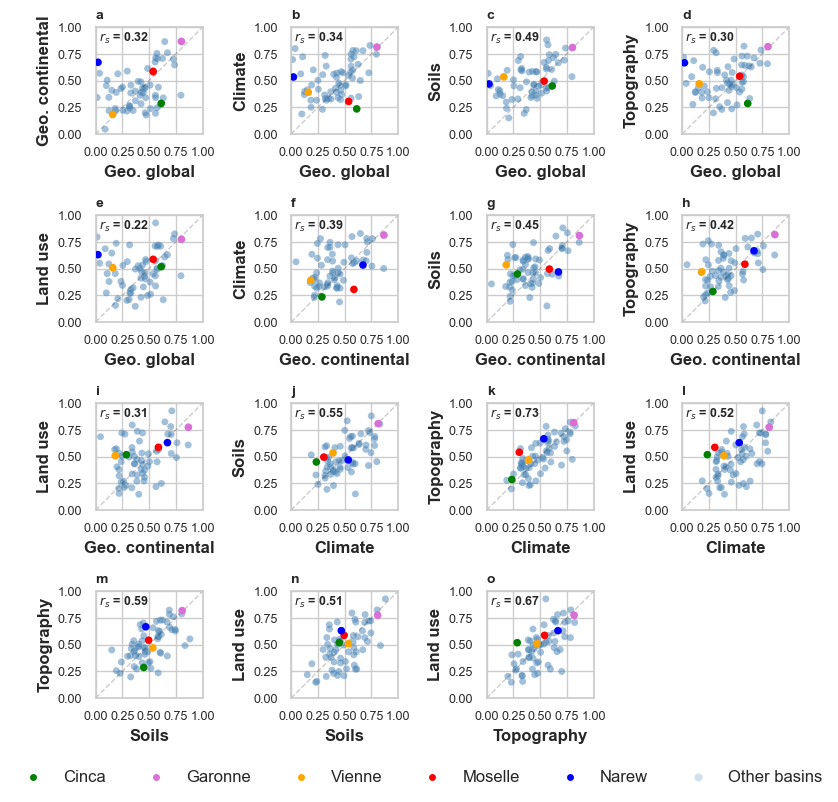

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib.lines import Line2D
# Set seaborn style
sns.set(style="whitegrid", context="notebook")


pairs = [('geology_global', 'geology_continental'),
 ('geology_global', 'climate'),
 ('geology_global', 'soils'),
 ('geology_global', 'topography'),
 ('geology_global', 'landuse'),
 ('geology_continental', 'climate'),
 ('geology_continental', 'soils'),
 ('geology_continental', 'topography'),
 ('geology_continental', 'landuse'),    
('climate', 'soils'),
 ('climate', 'topography'),
 ('climate', 'landuse'),
 ('soils', 'topography'),
 ('soils', 'landuse'),
 ('topography', 'landuse')]

n = len(pairs)

df = check_values.copy()

# layout
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(8, 7.7), constrained_layout=True)

if nrows == 1:
    axes = [axes]
axes = axes.reshape(nrows, ncols) if hasattr(axes, "reshape") else axes

custom_x_labels = [
    'Geo. global', 'Geo. global', 'Geo. global', 'Geo. global', 'Geo. global', 
    'Geo. continental', 'Geo. continental', 'Geo. continental', 'Geo. continental',

    'Climate', 'Climate', 'Climate', 'Soils', 'Soils', 
    'Topography']

custom_y_labels = [
    'Geo. continental', 'Climate', 'Soils', 'Topography', 'Land use',
    'Climate', 'Soils', 'Topography', 'Land use',
    'Soils', 'Topography', 'Land use', 'Topography', 'Land use',
    'Land use'
]

j = 0
for i, (xcol, ycol) in enumerate(pairs):
    r, c = divmod(i, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]

    x = df[xcol]
    y = df[ycol]
    
    ax.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1, alpha=0.2)

    # scatter
    ax.scatter(x, y, s=25, alpha=0.5, edgecolors="none", color="steelblue")

    # Highlighted basins with color + marker
    highlight_colors = {
        "DEBU1959": "red", "PL000936": "blue", "ES000331": "green",
        "FR003986": "orange", "FR001604": "orchid"
    }

    for basin, color in highlight_colors.items():

        ax.scatter(x[basin], y[basin], color=color, alpha=1.00, s=30,
                        marker="o", edgecolor='none', zorder=20)
        

    # axis labels
    ax.set_xticks([0, 0.25, 0.5, 0.75, 1])
    ax.set_xticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=9)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1])
    ax.set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=9)
    ax.set_title(f"{chr(65 + i).lower()}", fontsize=10, loc="left", fontweight="bold")


    ax.set_xlabel(custom_x_labels[j], fontweight="bold")
    ax.set_ylabel(custom_y_labels[j], fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)


    # Spearman correlation
    rho, pval = spearmanr(x, y, nan_policy="omit")

    ax.text(
        0.03, 0.97,
        f"$r_s$ = {rho:.2f}",
        transform=ax.transAxes,
        va="top", ha="left",
        fontsize=9,
        fontweight="bold"
    )
    j = j +1 
# hide any unused axes
for j in range(i + 1, nrows * ncols):
    r, c = divmod(j, ncols)
    ax = axes[r][c] if nrows > 1 else axes[c]
    ax.axis("off")


# Legend
legend_elements = [
    # Basin colors
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=6, label='Cinca'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orchid', markersize=6, label='Garonne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=6, label='Vienne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='Moselle'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='Narew'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='steelblue', markersize=6, label='Other basins', alpha=0.25),
]

fig.legend(handles=legend_elements,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.05),
           ncol=6,
           frameon=False,
           fontsize='medium')


# Final layout and save
plt.tight_layout()
plt.savefig(r"results//figs//figures/appendixf03.png", dpi=300, bbox_inches='tight')
plt.show()

In [29]:
check_values.corr(method="spearman")

,geology_global,geology_continental,climate,soils,topography,landuse
geology_global,1.000000,0.323541,0.335301,0.486319,0.295027,0.217694
geology_continental,0.323541,1.000000,0.392473,0.451901,0.423243,0.308852
climate,0.335301,0.392473,1.000000,0.551507,0.733007,0.520017
soils,0.486319,0.451901,0.551507,1.000000,0.592118,0.510993
topography,0.295027,0.423243,0.733007,0.592118,1.000000,0.666139
landuse,0.217694,0.308852,0.520017,0.510993,0.666139,1.000000


## Attributes with the higehst correlation per class

In [30]:
# This list of 72 regional catchments was defined using a visual inspection with QGIS:
list_cats_list = ["ES000801", "ES000665","ES001243", "ES000196", "ES000116", "ES000194", "ES001080", "ES000316","ES000397","ES000339","ES000331", 
                  "GB000472", "GB000271", "GB000153","ITTO0361","ITVE0408","ITLC0146", "ITPI0183", "SE000102", "FI000668", "FI000585", "FI000557", 
                  "FI000226", "FI000137", "PL000936","PL000905", "PL000868", "PL000794","HR000048","HUGR0037", "AT000393", "PL000253", 
                  "PL000349", "PL000015","CZ000097","DEST1711", "DEBY0711","DEBY0724", "DEBY0697", "DEBU1953", "NL000008","CH000026", "FR002679", 
                  "FR004615", "NL000016", "BEVL0155", "FR000408", "FR000373", "FR000345", "FR001071", "FR003922", "FR003986", "FR002118", "FR001952",
                  "FR002029", "FR001604", "FR004221", "ES000738","ES001171", "ES001010", "PL001056", "PL000536", "HR000278", "CZ000236","DEST1707", 
                  "DEBE0155","FR002758","FR002462","FR001394", "FR000867", "FR004308", "DEBU1959"] 


# Initialize dictionary to accumulate baseflow correlations for each catchment
bfi_correlation_dict = {}

# Signatures you’re analyzing
signatures = ['baseflow_index']

for list_cats in tqdm.tqdm(list_cats_list):
    nested_cats_df = nested_catchments.loc[[list_cats], :]
    nested_cats_filtered = find_max_unique_rows(nested_cats_df)
    nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]

    estreams_attributes_dfs = {}
    for catchment in nested_cats_filtered:
        nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
        nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
        cat_clip = estreams_attributes.loc[nested_clip, :]
        estreams_attributes_dfs[catchment] = cat_clip

    catchment_lens = pd.DataFrame(index=estreams_attributes_dfs.keys())
    for catchment, data in estreams_attributes_dfs.items():
        catchment_lens.loc[catchment, "len"] = len(data)

    nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]
    nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

    estreams_attributes_dfs = {}
    for catchment in nested_cats_filtered_abovevalue_df.index:
        nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
        nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
        cat_clip = estreams_attributes.loc[nested_clip, :]
        estreams_attributes_dfs[catchment] = cat_clip

    for catchment, df in estreams_attributes_dfs.items():
        # Only keep relevant columns
        try:
            df_filtered = df[[
                'baseflow_index',  # signature
                'p_mean', 'pet_mean', 'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
                'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean', 'ele_mt_min', 'slp_dg_mean',
                'flat_area_fra', 'steep_area_fra', 'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',
                "perm_high_glob", "perm_medium_glob", "perm_low_glob", "perm_verylow_glob", 
                "perm_high_cont", "perm_medium_cont", "perm_low_cont", "perm_verylow_cont",
                "perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi",
                'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean',
                'soil_fra_silt_mean', 'soil_fra_clay_mean', 'soil_fra_grav_mean', 'soil_bd_mean',
                'soil_oc_mean', 'lai_mean', 'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
                'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass', 'lulc_2006_agriculture',
                'dam_num', 'res_num', 'lakes_num', 'sno_cov_mean', 'irri_1990', 'irri_2005',
                "area_estreams"
            ]]

            # Calculate correlation for this catchment for baseflow_index
            corr_series = df_filtered.corr(method="spearman")["baseflow_index"].drop("baseflow_index")
            bfi_correlation_dict[catchment] = corr_series

        except KeyError:
            continue  # Skip if any key is missing for that catchment

# Combine all per-catchment correlation series into a single DataFrame
bfi_correlations = pd.DataFrame(bfi_correlation_dict)


# Define the classes (these must match what's in your variable_dict)
classes = ["climatic", "geology", "geology_low", "lulc", "soil", "topography", "vegetation", "hydrology", "geology_med", "geology_high"]

# Initialize result DataFrame
top_corr_features_bfi = pd.DataFrame(index=list_cats_list, columns=classes)

# Get correlation DataFrame for baseflow_index
#bfi_correlations = correlation_dict["baseflow_index"]

# Loop through each catchment
for catchment in list_cats_list:
    if catchment not in bfi_correlations.columns:
        continue  # Skip catchments not present in the correlations

    for feature in bfi_correlations.index:
        if feature not in variable_dict:
            continue  # Skip unclassified variables
        cls = variable_dict[feature]
        corr_value = bfi_correlations.loc[feature, catchment]

        # Check if current feature has higher abs correlation than current best
        current_best = top_corr_features_bfi.loc[catchment, cls]
        if pd.isna(current_best):  # First time setting it
            top_corr_features_bfi.loc[catchment, cls] = feature
        else:
            current_best_corr = abs(bfi_correlations.loc[current_best, catchment])
            if abs(corr_value) > current_best_corr:
                top_corr_features_bfi.loc[catchment, cls] = feature



100%|██████████| 72/72 [00:00<00:00, 348.32it/s]


In [31]:
# Signatures to process
signature_list = ["q_mean", "slope_sawicz", "hfd_mean", "q_5", "q_95"]

# Variable classes
classes = ["climatic", "geology", "geology_low", "lulc", "soil",
           "topography", "vegetation", "hydrology", "geology_med", "geology_high"]

# Store outputs
signature_correlations = {}
top_corr_features_by_signature = {}

# Loop through each signature
for signature in signature_list:
    print(f"Processing signature: {signature}")
    correlation_dict = {}

    for list_cats in tqdm.tqdm(list_cats_list):
        nested_cats_df = nested_catchments.loc[[list_cats], :]
        nested_cats_filtered = find_max_unique_rows(nested_cats_df)
        nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]

        estreams_attributes_dfs = {}
        for catchment in nested_cats_filtered:
            nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
            nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
            cat_clip = estreams_attributes.loc[nested_clip, :]
            estreams_attributes_dfs[catchment] = cat_clip

        catchment_lens = pd.DataFrame(index=estreams_attributes_dfs.keys())
        for catchment, data in estreams_attributes_dfs.items():
            catchment_lens.loc[catchment, "len"] = len(data)

        nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]
        nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

        estreams_attributes_dfs = {}
        for catchment in nested_cats_filtered_abovevalue_df.index:
            nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
            nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
            cat_clip = estreams_attributes.loc[nested_clip, :]
            estreams_attributes_dfs[catchment] = cat_clip

        for catchment, df in estreams_attributes_dfs.items():
            try:
                df_filtered = df[[
                    signature,
                    'p_mean', 'pet_mean', 'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
                    'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean', 'ele_mt_min', 'slp_dg_mean',
                    'flat_area_fra', 'steep_area_fra', 'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',
                    "perm_high_glob", "perm_medium_glob", "perm_low_glob", "perm_verylow_glob", 
                    "perm_high_cont", "perm_medium_cont", "perm_low_cont", "perm_verylow_cont",
                    "perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi",
                    'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean',
                    'soil_fra_silt_mean', 'soil_fra_clay_mean', 'soil_fra_grav_mean', 'soil_bd_mean',
                    'soil_oc_mean', 'lai_mean', 'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
                    'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass', 'lulc_2006_agriculture',
                    'dam_num', 'res_num', 'lakes_num', 'sno_cov_mean', 'irri_1990', 'irri_2005',
                    "area_estreams"
                ]]

                corr_series = df_filtered.corr(method="spearman")[signature].drop(signature)
                correlation_dict[catchment] = corr_series

            except KeyError:
                continue

    # Combine correlations
    signature_corr_df = pd.DataFrame(correlation_dict)
    signature_correlations[signature] = signature_corr_df

    # Select top correlated features by class
    top_corr_df = pd.DataFrame(index=list_cats_list, columns=classes)
    for catchment in list_cats_list:
        if catchment not in signature_corr_df.columns:
            continue

        for feature in signature_corr_df.index:
            if feature not in variable_dict:
                continue
            cls = variable_dict[feature]
            corr_value = signature_corr_df.loc[feature, catchment]

            current_best = top_corr_df.loc[catchment, cls]
            if pd.isna(current_best):
                top_corr_df.loc[catchment, cls] = feature
            else:
                current_best_corr = abs(signature_corr_df.loc[current_best, catchment])
                if abs(corr_value) > current_best_corr:
                    top_corr_df.loc[catchment, cls] = feature

    top_corr_features_by_signature[signature] = top_corr_df

# Save final results
top_corr_features_qmean = top_corr_features_by_signature["q_mean"]
top_corr_features_slope = top_corr_features_by_signature["slope_sawicz"]
top_corr_features_hfd = top_corr_features_by_signature["hfd_mean"]
top_corr_features_q5 = top_corr_features_by_signature["q_5"]
top_corr_features_q95 = top_corr_features_by_signature["q_95"]


Processing signature: q_mean


100%|██████████| 72/72 [00:00<00:00, 380.96it/s]


Processing signature: slope_sawicz


100%|██████████| 72/72 [00:00<00:00, 378.79it/s]


Processing signature: hfd_mean


100%|██████████| 72/72 [00:00<00:00, 383.13it/s]


Processing signature: q_5


100%|██████████| 72/72 [00:00<00:00, 384.31it/s]


Processing signature: q_95


100%|██████████| 72/72 [00:00<00:00, 391.22it/s]


In [32]:
# Robust version that handles columns with only NaNs
most_frequent_by_class = {}
most_frequent_counts = {}

for column in top_corr_features_bfi.columns:
    counts = top_corr_features_bfi[column].value_counts(dropna=True)
    if not counts.empty:
        most_frequent_by_class[column] = counts.idxmax()
        most_frequent_counts[column] = counts.max()
    else:
        most_frequent_by_class[column] = None
        most_frequent_counts[column] = 0

summary_df = pd.DataFrame({
    "Most Frequent Variable": pd.Series(most_frequent_by_class),
    "Frequency": pd.Series(most_frequent_counts)
})

summary_df

,Most Frequent Variable,Frequency
climatic,sno_cov_mean,9
geology,lit_dom,72
geology_low,perm_high_glob,29
lulc,ndvi_mean,12
soil,soil_fra_silt_mean,11
topography,steep_area_fra,15
vegetation,None,0
hydrology,lakes_num,20
geology_med,perm_low_cont,21
geology_high,perm_high_regi,72


In [33]:
# Example list of most frequent attributes you want to compare
attributes_to_plot = [
    "sno_cov_mean",
    "perm_high_regi",
    "perm_low_cont",
    "perm_high_glob",
    "steep_area_fra",
    "soil_fra_silt_mean",
    "ndvi_mean"
]

In [34]:
list_cats_list = ['ES000801', 'ES000665', 'ES001243', 'ES000196', 'ES000194', 'ES001080',
       'ES000316', 'ES000339', 'GB000472', 'GB000271', 'GB000153', 'ITTO0361',
       'ITVE0408', 'ITPI0183', 'FI000557', 'FI000226', 'FI000137', 'PL000936',
       'PL000794', 'HR000048', 'HUGR0037', 'AT000393', 'PL000253', 'PL000349',
       'PL000015', 'CZ000097', 'DEST1711', 'DEBY0711', 'DEBY0724', 'DEBY0697',
       'DEBU1953', 'NL000008', 'CH000026', 'FR002679', 'FR004615', 'NL000016',
       'BEVL0155', 'FR000408', 'FR000373', 'FR000345', 'FR001071', 'FR003922',
       'FR003986', 'FR002118', 'FR001952', 'FR002029', 'FR001604', 'FR004221',
       'ES001171', 'ES001010', 'PL000536', 'HR000278', 'CZ000236', 'DEST1707',
       'DEBE0155', 'FR002758', 'FR002462', 'FR001394', 'FR000867', 'FR004308',
       'DEBU1959']

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip


combined_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)


list_cats_list = ["DEBU1959"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

DEBU1959_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)

list_cats_list = ["PL000936"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

PL000936_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)

list_cats_list = ["ES000331"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

ES000331_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)

list_cats_list = ["FR003986"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

FR003986_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)

list_cats_list = ["FR001604"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

FR001604_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)

## Correlations between attributes and baseflow index

## Figure D2

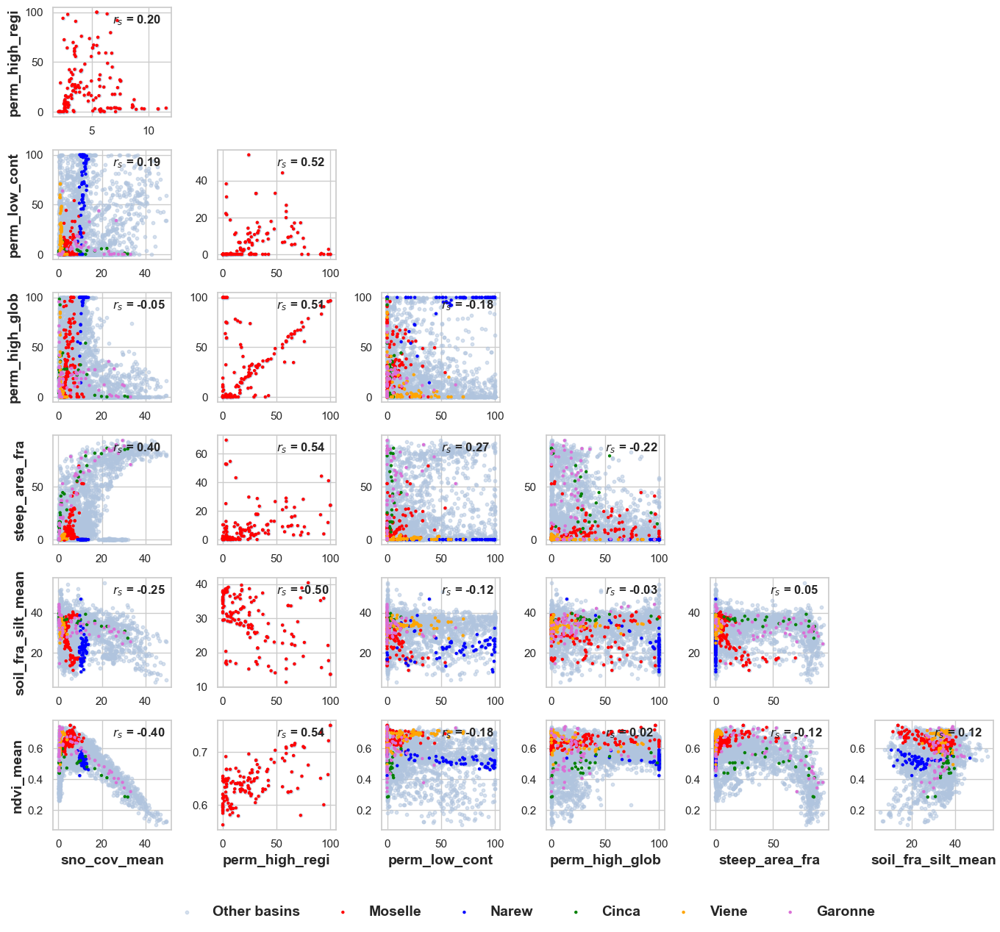

In [35]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import seaborn as sns
from matplotlib.font_manager import FontProperties

# Data selection without global dropna
df_plot = combined_df[attributes_to_plot]

# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# Create figure and axes
n = len(attributes_to_plot)
fig, axes = plt.subplots(n, n, figsize=(16, 14))  # 3" per cell

# Highlighted catchments: (DataFrame name as string, color, original label)
highlight_sets = [
    ("DEBU1959_df", "red", "DEBU1959"),
    ("PL000936_df", "blue", "PL000936"),
    ("ES000331_df", "green", "ES000331"),
    ("FR003986_df", "orange", "FR003986"),
    ("FR001604_df", "orchid", "FR001604"),
]

# Custom legend labels
custom_labels = [
    "Moselle",   # corresponds to DEBU1959_df
    "Narew",     # corresponds to PL000936_df
    "Cinca",     # corresponds to ES000331_df
    "Viene",     # corresponds to FR003986_df
    "Garonne"    # corresponds to FR001604_df
]

# Store handles for custom legend
legend_handles = []

# Loop to populate only the lower triangle
for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        if i > j:
            x = df_plot[attributes_to_plot[j]]
            y = df_plot[attributes_to_plot[i]]
            mask = x.notna() & y.notna()

            # Plot main group and store handle for legend once
            if i == 1 and j == 0:
                other_scatter = ax.scatter(x[mask], y[mask], alpha=0.5, s=10, color="lightsteelblue", label="Other basins")
                legend_handles.append(other_scatter)
            else:
                ax.scatter(x[mask], y[mask], alpha=0.5, s=10, color="lightsteelblue")

            # Overlay highlighted points
            for (df_name, color, _), custom_label in zip(highlight_sets, custom_labels):
                x_pl = eval(df_name)[attributes_to_plot[j]]
                y_pl = eval(df_name)[attributes_to_plot[i]]
                mask_pl = x_pl.notna() & y_pl.notna()
                scatter = ax.scatter(x_pl[mask_pl], y_pl[mask_pl], color=color, s=10, edgecolor='none', label=custom_label)

                # Store one handle per label only once
                if i == 1 and j == 0:
                    legend_handles.append(scatter)

            # Annotate correlation
            rs, _ = spearmanr(x[mask], y[mask])
            ax.annotate(f"$r_s$ = {rs:.2f}", xy=(0.5, 0.85), xycoords='axes fraction',
                        fontsize=12, fontweight="bold")
        else:
            ax.set_visible(False)

# Set labels
for i in range(n):
    axes[-1, i].set_xlabel(attributes_to_plot[i], fontsize=14, fontweight="bold")
    axes[i, 0].set_ylabel(attributes_to_plot[i], fontsize=14, fontweight="bold")

from matplotlib.font_manager import FontProperties

bold_font = FontProperties(weight='bold', size=14)
# Add custom legend below plots
fig.legend(
    handles=legend_handles,
    loc='lower center',
    ncol=len(legend_handles),
    bbox_to_anchor=(0.45, -0.05),
    prop=bold_font,
    frameon=False
)
# Final layout and save
plt.tight_layout()
plt.savefig(r"results//figs//figures/appendixf02.png", dpi=300, bbox_inches='tight')
plt.show()

## Figure D1

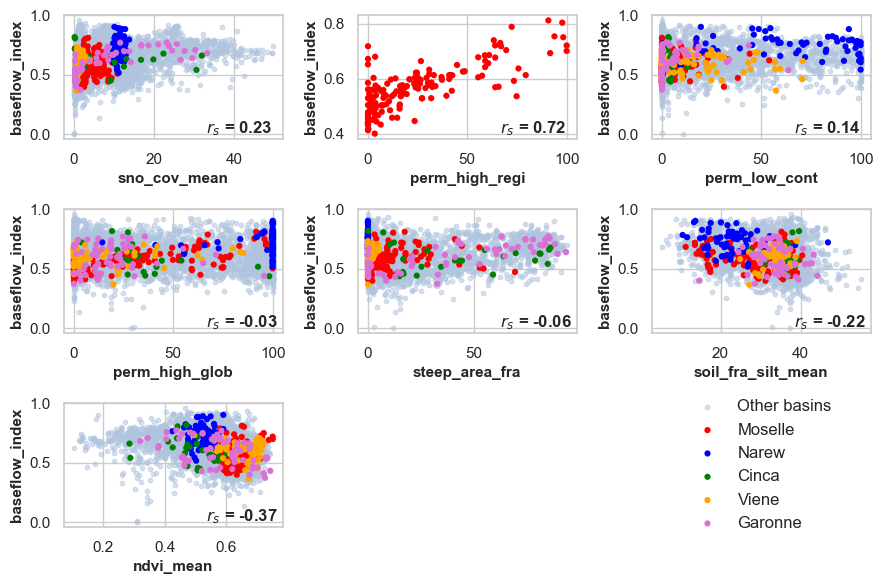

In [36]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import seaborn as sns

# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# Define baseflow index and attributes
target_variable = 'baseflow_index'
df_plot = combined_df[attributes_to_plot + [target_variable]]

# Grid settings
n_rows, n_cols = 3, 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(9, 6))

# Highlighted gauges: (dataframe name, color)
highlight_sets = [
    ("DEBU1959_df", "red"),
    ("PL000936_df", "blue"),
    ("ES000331_df", "green"),
    ("FR003986_df", "orange"),
    ("FR001604_df", "orchid"),
]

# Custom legend labels (defined by you)
custom_labels = [
    "Moselle",
    "Narew",
    "Cinca",
    "Viene",
    "Garonne"
]

# Main points label
main_label = "Other basins"

# Storage for legend handles
legend_handles = []
n_plots = len(attributes_to_plot)

# Plotting loop
for idx, attr in enumerate(attributes_to_plot):
    row, col = divmod(idx, n_cols)
    ax = axes[row, col]

    x = df_plot[attr]
    y = df_plot[target_variable]
    mask = x.notna() & y.notna()

    # Plot main points (lightsteelblue)
    main_scatter = ax.scatter(x[mask], y[mask], alpha=0.5, s=10, color="lightsteelblue", label=main_label)
    if idx == 0:
        legend_handles.append(main_scatter)

    # Overlay highlighted points
    for i, (df_name, color) in enumerate(highlight_sets):
        x_pl = eval(df_name)[attr]
        y_pl = eval(df_name)[target_variable]
        mask_pl = x_pl.notna() & y_pl.notna()
        scatter = ax.scatter(x_pl[mask_pl], y_pl[mask_pl], color=color, s=20, edgecolor='none', label=custom_labels[i])
        if idx == 0:
            legend_handles.append(scatter)

    # Spearman correlation
    rs, _ = spearmanr(x[mask], y[mask])
    ax.annotate(f"$r_s$ = {rs:.2f}", xy=(0.65, 0.05), xycoords='axes fraction',
                fontsize=12, fontweight="bold")

    ax.set_xlabel(attr, fontsize=11, fontweight="bold")
    ax.set_ylabel(target_variable, fontsize=11, fontweight="bold")

# Hide unused subplots and place legend
total_subplots = n_rows * n_cols
for i in range(n_plots, total_subplots):
    row, col = divmod(i, n_cols)
    ax = axes[row, col]
    ax.axis('off')
    if i == total_subplots - 1:
        ax.legend(handles=legend_handles, loc='center', fontsize=12, frameon=False)

# Final layout and save
plt.tight_layout()
plt.savefig(r"results//figs//figures/appendixf01.png", dpi=300, bbox_inches='tight')
plt.show()


## Export some information about these catchments for Supporting Information

In [37]:
estreams_attributes_catchments = estreams_attributes.loc[dataframe_BFI.index, ["gauge_name", "river", "lon_snap", "lat_snap", "area_estreams", "gauges_upstream"]]

estreams_attributes_catchments.gauges_upstream = dataframe_other.len

estreams_attributes_catchments.gauge_name = network_estreams.gauge_name
estreams_attributes_catchments.river = network_estreams.river

estreams_attributes_catchments

,gauge_name,river,lon_snap,lat_snap,area_estreams,gauges_upstream
ES000801,ORELLANA,NaN,-5.650096,39.018443,26470.566,34
ES000665,PALMA DEL RIO,NaN,-5.288928,37.717447,32359.392,43
ES001243,TALAVERA,NaN,-4.816129,39.954353,33576.944,94
ES000196,VALLADOLID-PISUERGA,NaN,-4.732359,41.661169,15578.353,37
ES000194,BRETO,NaN,-5.765457,41.872234,14406.755,33
...,...,...,...,...,...,...
FR002462,V3000015,Le Rhône à Lyon,4.830957,45.748113,20551.737,88
FR001394,M4101910,La Maine à Angers,-0.558903,47.471558,22175.954,91
FR000867,J9300611,La Vilaine à Rieux,-2.126360,47.580112,10146.529,45
FR004308,Le Lot Ã Villeneuve-sur-Lot,Le Lot à Villeneuve-sur-Lot,0.701216,44.409311,10748.554,55


In [38]:
print(estreams_attributes_catchments.gauges_upstream.max())

181


In [39]:
estreams_attributes_catchments.to_csv("results/table_catchments.csv", encoding='utf-8')

## Figure 4: Lineplot with different groups

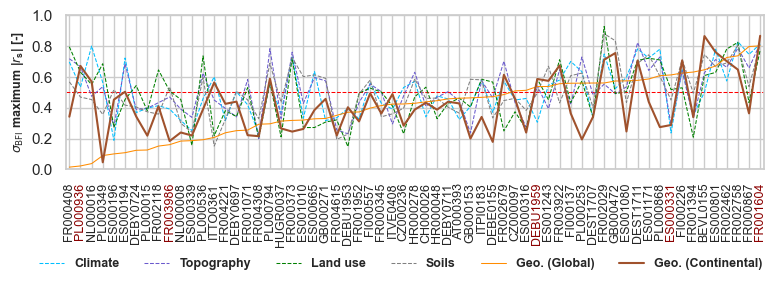

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from matplotlib.font_manager import FontProperties

# Load world shapefile (if needed)
#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# Define Arial font properties
arial = FontProperties(family='sans-serif', size=9)
arial_bold = FontProperties(family='sans-serif', size=9, weight='bold')

# Create figure
fig, axes = plt.subplots(figsize=(9, 2), sharex=True, sharey=True)

# Sort data
dataframe_BFI_sorted = dataframe_BFI.sort_values(by='geology_global', ascending=True)

# Plot lines
axes.axhline(y=0.5, color='red', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['climate'], label='Climate', color='deepskyblue', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['topography'], label='Topography', color='slateblue', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['landuse'], label='Land use', color='green', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['soils'], label='Soils', color='gray', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['geology_global'], label='Geo. (Global)', color='darkorange', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['geology_continental'], label='Geo. (Continental)', color='sienna')

# Set axis labels with Arial
axes.set_ylabel(r'$\sigma_{\mathrm{BFI}}$ maximum |$r_{\mathregular{s}}$| [-]', fontproperties=arial_bold)

# Set limits
axes.set_ylim(0, 1)
axes.set_xlim(-0.3, 62.3)

# Rotate and customize x-tick labels
axes.tick_params(axis='x', rotation=90)
xticks = axes.get_xticklabels()

# Highlight specific ticks
highlight_indices = [42, -9, 1, -1, 9]
for idx in highlight_indices:
    if -len(xticks) <= idx < len(xticks):
        xticks[idx].set_color('darkred')
        xticks[idx].set_fontproperties(arial_bold)

# Apply new font to all x-tick labels
for label in xticks:
    label.set_fontproperties(arial)

axes.set_xticklabels(xticks)

# Custom legend with Arial bold
axes.legend(
    frameon=False,
    title="",
    loc='upper center',
    bbox_to_anchor=(0.48, -0.5),
    ncol=6,
    prop=arial_bold
)

# Enable grid
axes.grid(True)

# Save and show
#plt.savefig(r'results/figs/fig_lineplot_orderedBFI.png', dpi=300, bbox_inches='tight')
plt.show()


In [41]:
# Add a new column with the column name having the highest value for each row
dataframe_BFI_sorted_new = dataframe_BFI_sorted.copy()
dataframe_BFI_sorted['Max_Column'] = dataframe_BFI_sorted_new.iloc[:, 0:6].idxmax(axis=1)

# Count the occurrences of each column name in the 'Max_Column'
column_counts = dataframe_BFI_sorted['Max_Column'].value_counts()
column_counts

Max_Column
landuse                15
soils                  13
climate                12
topography             10
geology_global          7
geology_continental     6
Name: count, dtype: int64

In [42]:
dataframe_BFI_sorted.sort_values(by='Max_Column', ascending=True, inplace=True)
dataframe_BFI_sorted

,geology_global,geology_continental,climate,soils,topography,landuse,max,area,dams,lakes,len,Max_Column
HR000048,0.445729,0.387435,0.476934,0.462940,0.468039,0.328543,0.476934,34230.537,28.0,124.0,152,climate
FI000137,0.558956,0.362991,0.700422,0.608353,0.420404,0.432759,0.700422,25430.714,1.0,643.0,29,climate
NL000016,0.037199,0.569050,0.800243,0.452933,0.474260,0.550410,0.800243,9500.000,0.0,64.0,39,climate
FR002758,0.737090,0.647574,0.828779,0.804379,0.786663,0.824670,0.828779,14025.824,14.0,29.0,34,climate
CZ000236,0.424278,0.283650,0.531570,0.397284,0.476745,0.231465,0.531570,28062.080,36.0,413.0,122,climate
...,...,...,...,...,...,...,...,...,...,...,...,...
FR000373,0.317662,0.245051,0.735698,0.725235,0.760852,0.721631,0.760852,12811.010,5.0,53.0,54,topography
FR002679,0.485456,0.613954,0.572658,0.446524,0.701898,0.248954,0.701898,9974.543,21.0,43.0,33,topography
DEBY0711,0.457607,0.439111,0.456810,0.402671,0.504411,0.428225,0.504411,26054.667,24.0,88.0,141,topography
ES000339,0.186362,0.219508,0.251418,0.240664,0.337409,0.156065,0.337409,12929.504,31.0,31.0,37,topography


In [43]:

# Define your custom order
order = ["landuse", "soils", "climate", "topography", "geology_global", "geology_continental"]

# Convert column to categorical with that order
dataframe_BFI_sorted["Max_Column"] = pd.Categorical(
    dataframe_BFI_sorted["Max_Column"], 
    categories=order, 
    ordered=True
)

# Sort based on this custom order
dataframe_BFI_sorted = dataframe_BFI_sorted.sort_values("Max_Column")
dataframe_BFI_sorted

,geology_global,geology_continental,climate,soils,topography,landuse,max,area,dams,lakes,len,Max_Column
FR002029,0.560688,0.712143,0.749143,0.880967,0.553246,0.927522,0.927522,7811.634,21.0,56.0,53,landuse
DEBU1959,0.537650,0.586709,0.305336,0.495665,0.541406,0.587034,0.587034,27100.000,11.0,151.0,152,landuse
ITPI0183,0.467452,0.340201,0.583917,0.580947,0.576146,0.585003,0.585003,25565.751,30.0,39.0,62,landuse
AT000393,0.461769,0.427879,0.323262,0.364733,0.443354,0.462078,0.462078,25615.598,24.0,151.0,119,landuse
FR002462,0.726157,0.702085,0.573365,0.691240,0.662744,0.781263,0.781263,20551.737,29.0,81.0,88,landuse
...,...,...,...,...,...,...,...,...,...,...,...,...
FR001604,0.801799,0.866982,0.813930,0.808973,0.817859,0.774986,0.817859,13752.051,38.0,89.0,64,geology_continental
BEVL0155,0.646437,0.865194,0.501086,0.745623,0.627305,0.609244,0.745623,10231.176,0.0,49.0,36,geology_continental
ITVE0408,0.423641,0.488477,0.391024,0.360312,0.294561,0.411280,0.411280,12020.860,20.0,29.0,36,geology_continental
PL000936,0.022025,0.671413,0.534012,0.469046,0.666912,0.630660,0.666912,28500.000,1.0,340.0,70,geology_continental


In [44]:
dataframe_BFI_sorted = dataframe_BFI_sorted.sort_values(
    by=["Max_Column", "max"],   # second key
    ascending=[True, False]           # first = categorical order, second = highest max first
)
dataframe_BFI_sorted

,geology_global,geology_continental,climate,soils,topography,landuse,max,area,dams,lakes,len,Max_Column
FR002029,0.560688,0.712143,0.749143,0.880967,0.553246,0.927522,0.927522,7811.634,21.0,56.0,53,landuse
FR000408,0.014283,0.341995,0.697352,0.568082,0.718070,0.795632,0.795632,14128.465,1.0,74.0,59,landuse
FR002462,0.726157,0.702085,0.573365,0.691240,0.662744,0.781263,0.781263,20551.737,29.0,81.0,88,landuse
PL000536,0.192179,0.390138,0.459208,0.597045,0.624306,0.736675,0.736675,31800.000,12.0,249.0,175,landuse
FR003922,0.556121,0.674417,0.579875,0.430887,0.646542,0.711588,0.711588,13699.260,9.0,67.0,51,landuse
...,...,...,...,...,...,...,...,...,...,...,...,...
BEVL0155,0.646437,0.865194,0.501086,0.745623,0.627305,0.609244,0.745623,10231.176,0.0,49.0,36,geology_continental
PL000936,0.022025,0.671413,0.534012,0.469046,0.666912,0.630660,0.666912,28500.000,1.0,340.0,70,geology_continental
ITVE0408,0.423641,0.488477,0.391024,0.360312,0.294561,0.411280,0.411280,12020.860,20.0,29.0,36,geology_continental
DEBU1953,0.370639,0.403195,0.395952,0.229131,0.230816,0.147699,0.395952,24800.000,10.0,88.0,142,geology_continental


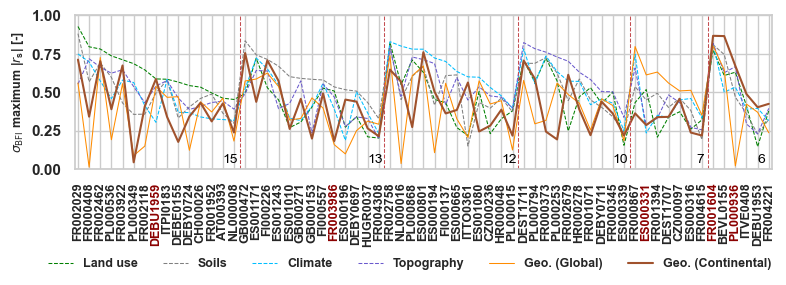

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from matplotlib.font_manager import FontProperties

# Load world shapefile (if needed)
#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# Define Arial font properties
arial = FontProperties(family='sans-serif', size=9)
arial_bold = FontProperties(family='sans-serif', size=9, weight='bold')

# Create figure
fig, axes = plt.subplots(figsize=(9, 2), sharex=True, sharey=True)

## Sort data
#dataframe_BFI_sorted = dataframe_BFI.sort_values(by='geology_global', ascending=True)

# Plot lines
#axes.axhline(y=0.5, color='red', linestyle='--', linewidth=0.75)

axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['landuse'], label='Land use', color='green', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['soils'], label='Soils', color='gray', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['climate'], label='Climate', color='deepskyblue', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['topography'], label='Topography', color='slateblue', linestyle='--', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['geology_global'], label='Geo. (Global)', color='darkorange', linewidth=0.75)
axes.plot(dataframe_BFI_sorted.index, dataframe_BFI_sorted['geology_continental'], label='Geo. (Continental)', color='sienna')

# Set axis labels with Arial
axes.set_ylabel(r'$\sigma_{\mathrm{BFI}}$ maximum |$r_{\mathregular{s}}$| [-]', fontproperties=arial_bold)

# Set limits
axes.set_ylim(0, 1)
axes.set_xlim(-0.3, 62.3)

# Rotate and customize x-tick labels
axes.tick_params(axis='x', rotation=90)
xticks = axes.get_xticklabels()

# Highlight specific ticks
highlight_indices = [7, -4, -6, -12, 23]
for idx in highlight_indices:
    if -len(xticks) <= idx < len(xticks):
        xticks[idx].set_color('darkred')
        xticks[idx].set_fontproperties(arial_bold)

# Apply new font to all x-tick labels
for label in xticks:
    label.set_fontproperties(arial_bold)

axes.set_xticklabels(xticks)

axes.set_yticks([0, 0.25, 0.5, 0.75, 1])
axes.set_yticklabels(["0.00", "0.25", "0.50", "0.75", "1.00"], fontweight="bold")


# Custom legend with Arial bold
axes.legend(
    frameon=False,
    title="",
    loc='upper center',
    bbox_to_anchor=(0.48, -0.5),
    ncol=6,
    prop=arial_bold
)

# Multiple vertical lines
for xpos in [14.5, 14.5+13, 14.5+13+12, 14.5+13+12+10, 14.5+13+12+10+7]:
    axes.axvline(x=xpos, color='r', linestyle='--', linewidth=0.75)

# Enable grid
axes.grid(True)

axes.text(
    13, 0.1, "15",
    fontsize=10, color="black", ha="left", va="top", fontweight="normal"
)

axes.text(
    26, 0.1, "13",
    fontsize=10, color="black", ha="left", va="top", fontweight="normal"
)

axes.text(
    38, 0.1, "12",
    fontsize=10, color="black", ha="left", va="top", fontweight="normal"
)

axes.text(
    48, 0.1, "10",
    fontsize=10, color="black", ha="left", va="top", fontweight="normal"
)

axes.text(
    55.5, 0.1, "7",
    fontsize=10, color="black", ha="left", va="top", fontweight="normal"
)

axes.text(
    61, 0.1, "6",
    fontsize=10, color="black", ha="left", va="top", fontweight="normal"
)

# Save and show
plt.savefig(r"results//figs//figures/f03.png", dpi=300, bbox_inches='tight')
plt.show()

In [46]:
15+13+12+10+7+6

63

In [47]:
# Add a new column with the column name having the highest value for each row
dataframe_BFI_sorted_new = dataframe_BFI_sorted.copy()
dataframe_BFI_sorted['Max_Column'] = dataframe_BFI_sorted_new.iloc[:, 0:6].idxmax(axis=1)

# Count the occurrences of each column name in the 'Max_Column'
column_counts = dataframe_BFI_sorted['Max_Column'].value_counts()
column_counts

Max_Column
landuse                15
soils                  13
climate                12
topography             10
geology_global          7
geology_continental     6
Name: count, dtype: int64

## Export this information for Supporting information

In [48]:
# Define output path
output_path = r"results/dataframe_BFI_sorted.xlsx"

# Write to Excel with multiple sheets
with pd.ExcelWriter(output_path, engine='xlsxwriter') as writer:
    dataframe_BFI_sorted.to_excel(writer, sheet_name='BFI', index=True)

output_path


'results/dataframe_BFI_sorted.xlsx'

### Count some results

In [49]:
dataframe_BFI_sorted["max"][dataframe_BFI_sorted["max"] <= 0.5]

FR001952    0.496295
AT000393    0.462078
NL000008    0.453683
HUGR0037    0.433823
FR004308    0.328402
HR000048    0.476934
PL000015    0.397150
ES000339    0.337409
FR001394    0.494535
DEST1707    0.482924
CZ000097    0.461196
ES000316    0.460096
FR004615    0.334918
ITVE0408    0.411280
DEBU1953    0.395952
FR004221    0.395830
Name: max, dtype: float64

In [50]:
len(dataframe_BFI_sorted["max"][dataframe_BFI_sorted["max"] >= 0.5])

47

In [51]:
47/63

0.746031746031746

In [52]:
# Add a new column with the column name having the highest value for each row
dataframe_BFI_sorted_new = dataframe_BFI_sorted.copy()
dataframe_BFI_sorted['Max_Column'] = dataframe_BFI_sorted_new.iloc[:, 0:6].idxmax(axis=1)

# Count the occurrences of each column name in the 'Max_Column'
column_counts = dataframe_BFI_sorted['Max_Column'].value_counts()
column_counts

Max_Column
landuse                15
soils                  13
climate                12
topography             10
geology_global          7
geology_continental     6
Name: count, dtype: int64

In [53]:
dataframe_BFI_sorted.describe()

,geology_global,geology_continental,climate,soils,topography,landuse,max,area,dams,lakes,len
count,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
mean,0.406041,0.424260,0.505501,0.507803,0.511792,0.485794,0.607869,19220.553889,15.825397,130.920635,70.936508
std,0.200039,0.186811,0.169215,0.162054,0.161543,0.184178,0.145614,8733.911728,13.316906,185.365315,44.216430
min,0.014283,0.045671,0.188378,0.151029,0.198398,0.147699,0.328402,7020.963000,0.000000,9.000000,25.000000
25%,0.253001,0.269846,0.367306,0.399558,0.396334,0.340372,0.500117,11384.707000,5.000000,40.500000,36.500000
50%,0.428818,0.390138,0.501086,0.488761,0.491222,0.496295,0.590515,16500.000000,14.000000,64.000000,51.000000
75%,0.560113,0.566394,0.617532,0.606350,0.640228,0.598139,0.733078,26334.289500,22.500000,125.500000,94.500000
max,0.801799,0.866982,0.828779,0.880967,0.822893,0.927522,0.927522,34932.663000,58.000000,1082.000000,181.000000


In [54]:
dataframe_BFI_sorted.geology_global.mean()

0.4060411879034906

In [55]:
dataframe_BFI_sorted.loc["DEBU1959"]

geology_global          0.53765
geology_continental    0.586709
climate                0.305336
soils                  0.495665
topography             0.541406
landuse                0.587034
max                    0.587034
area                    27100.0
dams                       11.0
lakes                     151.0
len                         152
Max_Column              landuse
Name: DEBU1959, dtype: object

## Figure 3: Scatter plots

In [56]:
# Catchments used as example
["PL000936", "ES000665", "DEBU1959", "FR001604", "ES000331"]

['PL000936', 'ES000665', 'DEBU1959', 'FR001604', 'ES000331']

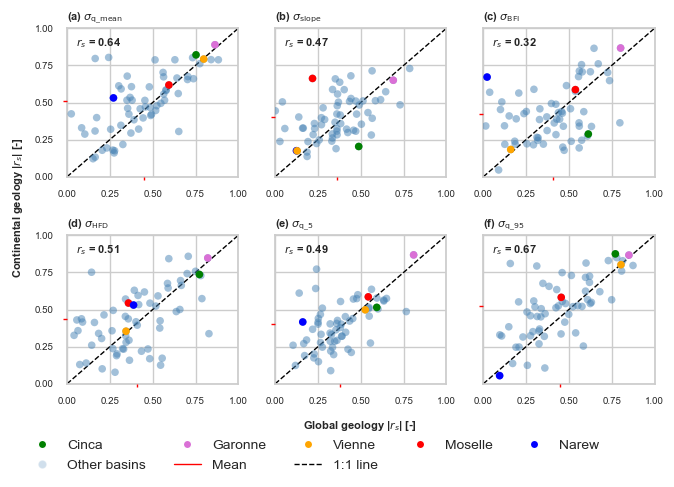

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt


# Prepare your filtered data
corr_low_geology_df_25_6sig = corr_low_geology_df_25.loc[["q_mean", "slope_sawicz", "baseflow_index", 
                            "hfd_mean", "q_5", "q_95"]]

corr_med_geology_df_25_6sig = corr_med_geology_df_25.loc[["q_mean", "slope_sawicz", "baseflow_index", 
                            "hfd_mean", "q_5", "q_95"]]

# Set up the figure and subplots layout
fig, axes = plt.subplots(2, 3, figsize=(7, 4.8), sharex=False, sharey=True)
axes = axes.flatten()
n_cols = 3

# Custom x labels
custom_x_labels = [
    '$\sigma_{\mathrm{q\_mean}}$', '$\sigma_{\mathrm{slope}}$', '$\sigma_{\mathrm{BFI}}$', 
    '$\sigma_{\mathrm{HFD}}$', '$\sigma_{\mathrm{q\_5}}$', '$\sigma_{\mathrm{q\_95}}$']

# Iterate over each variable
for i, column in enumerate(corr_low_geology_df_25_6sig.T.columns):
    x = corr_low_geology_df_25_6sig.T[column]
    y = corr_med_geology_df_25_6sig.T[column]
    
    # Plot 1:1 line
    axes[i].plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1)

    # Scatter all points
    axes[i].scatter(x, y, color='steelblue', alpha=0.5, s=30, edgecolor='none', zorder=10)
    
    # Highlight specific basins
    axes[i].scatter(x["DEBU1959"], y["DEBU1959"], color='red', alpha=1.00, s=30, edgecolor='none', zorder=10)
    axes[i].scatter(x["PL000936"], y["PL000936"], color='blue', alpha=1.00, s=30, edgecolor='none', zorder=10)
    axes[i].scatter(x["ES000331"], y["ES000331"], color='green', alpha=1.00, s=30, edgecolor='none', zorder=10)
    axes[i].scatter(x["FR003986"], y["FR003986"], color='orange', alpha=1.00, s=30, edgecolor='none', zorder=10)
    axes[i].scatter(x["FR001604"], y["FR001604"], color='orchid', alpha=1.00, s=30, edgecolor='none', zorder=10)

    # Calculate Spearman correlation
    rs, _ = spearmanr(x, y)

    # Add rs value inside the plot
    axes[i].text(0.05, 0.90, f"$r_s$ = {rs:.2f}", transform=axes[i].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

    # Calculate means
    mean_x = np.mean(x)
    mean_y = np.mean(y)

    # Plot small ticks at the means (NOT full lines)
    # Plot x-mean tick just below x-axis
    axes[i].plot([mean_x, mean_x], [-0.025, 0], color='red', linestyle='--', linewidth=1, zorder=20, clip_on=False)

    # Plot y-mean tick just left of y-axis
    axes[i].plot([-0.025, 0], [mean_y, mean_y], color='red', linestyle='--', linewidth=1, zorder=20, clip_on=False)


    # Titles and limits
    axes[i].set_title(f"({chr(65 + i).lower()}) {custom_x_labels[i]}", fontsize=8, loc="left", fontweight="bold")
    axes[i].set_xlim(0, 1)
    axes[i].set_ylim(0, 1)
    axes[i].set_xticks([0, 0.25, 0.5, 0.75, 1], ['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=7)
    axes[i].set_yticks([0, 0.25, 0.5, 0.75, 1], ['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=7)

# Delete any unused subplots
for j in range(len(custom_x_labels), len(axes)):
    fig.delaxes(axes[j])

# Create custom legend elements
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=6, label='Cinca'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='steelblue', markersize=6, label='Other basins', alpha=0.25),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orchid', markersize=6, label='Garonne'),
    Line2D([0], [0], color='red', linestyle='-', lw=1, label='Mean'),

    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=6, label='Vienne'),
    Line2D([0], [0], color='black', linestyle='--', lw=1, label='1:1 line'),

    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='Moselle'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='Narew'),

]

# Add the legend
fig.legend(
    handles=legend_elements,
    loc='lower right',
    bbox_to_anchor=(0.9, -0.075),
    ncol=5,
    frameon=False,
    title="",
    title_fontsize='small',
    fontsize='small'
)

# Add manual title for the legend
#fig.text(0.53, -0.01, "Legend", fontsize='medium', fontweight='bold', ha='center')

# Set common x and y labels
fig.text(0.54, 0.04, "Global geology |$r_s$| [-]", ha='center', fontsize=8, fontweight="bold")
fig.text(0.04, 0.5, "Continental geology |$r_s$| [-]", va='center', rotation='vertical', fontsize=8, fontweight="bold")

# Adjust layout
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])

# Save figure
#fig.savefig(r'results\figs\fig_scatterplots_b.png', dpi=300, bbox_inches='tight')

plt.show()


## Figure 3 (with symbols)

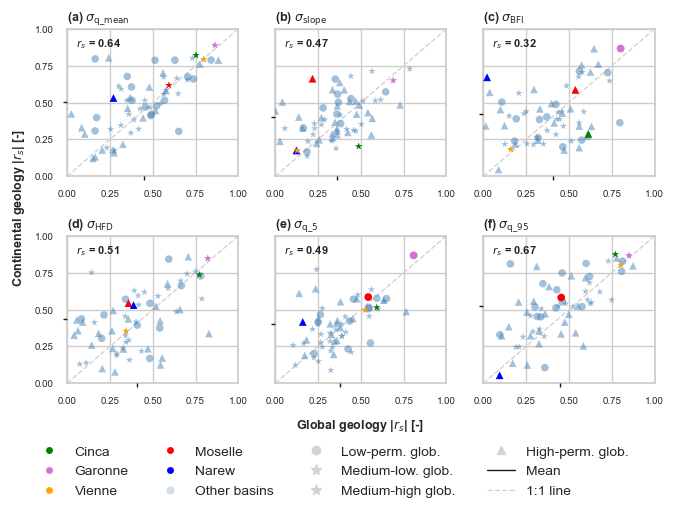

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib.lines import Line2D
# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# Filter relevant metrics
corr_low_geology_df_25_6sig = corr_low_geology_df_25.loc[[ 
    "q_mean", "slope_sawicz", "baseflow_index", "hfd_mean", "q_5", "q_95"
]]
corr_med_geology_df_25_6sig = corr_med_geology_df_25.loc[[ 
    "q_mean", "slope_sawicz", "baseflow_index", "hfd_mean", "q_5", "q_95"
]]

# Map each signature to its top_corr_features dataframe
top_corr_features_dict = {
    "q_mean": top_corr_features_qmean,
    "slope_sawicz": top_corr_features_slope,
    "baseflow_index": top_corr_features_bfi,
    "hfd_mean": top_corr_features_hfd,
    "q_5": top_corr_features_q5,
    "q_95": top_corr_features_q95
}

# Setup figure
fig, axes = plt.subplots(2, 3, figsize=(7, 4.8), sharex=False, sharey=True)
axes = axes.flatten()

custom_x_labels = [
    '$\sigma_{\mathrm{q\_mean}}$', '$\sigma_{\mathrm{slope}}$', '$\sigma_{\mathrm{BFI}}$',
    '$\sigma_{\mathrm{HFD}}$', '$\sigma_{\mathrm{q\_5}}$', '$\sigma_{\mathrm{q\_95}}$'
]

# Loop over subplots
for i, column in enumerate(corr_low_geology_df_25_6sig.T.columns):
    x = corr_low_geology_df_25_6sig.T[column]
    y = corr_med_geology_df_25_6sig.T[column]

    axes[i].plot([0, 1], [0, 1], color='lightgray', linestyle='--', linewidth=1)

    # Get the appropriate top_corr_features dataframe
    top_corr_df = top_corr_features_dict[column]

    for basin in x.index:
        if basin not in top_corr_df.index:
            continue

        geology_med = top_corr_df.loc[basin, "geology_low"]
        marker = 'o'

        if pd.isna(geology_med) or "perm_verylow_glob" in geology_med:
            marker = 'o'
        elif "perm_low_glob" in geology_med or "perm_medium_glob" in geology_med:
            marker = '*'
        elif "perm_high_glob" in geology_med:
            marker = '^'

        axes[i].scatter(x[basin], y[basin], color='steelblue', alpha=0.5, s=30,
                        marker=marker, edgecolor='none', zorder=10)

    # Highlighted basins with color + marker
    highlight_colors = {
        "DEBU1959": "red", "PL000936": "blue", "ES000331": "green",
        "FR003986": "orange", "FR001604": "orchid"
    }
    for basin, color in highlight_colors.items():
        if basin not in top_corr_df.index:
            continue

        geology_med = top_corr_df.loc[basin, "geology_low"]
        marker = 'o'

        if pd.isna(geology_med) or "perm_verylow_glob" in geology_med:
            marker = 'o'
        elif "perm_low_glob" in geology_med or "perm_medium_glob" in geology_med:
            marker = '*'
        elif "perm_high_glob" in geology_med:
            marker = '^'

        axes[i].scatter(x[basin], y[basin], color=color, alpha=1.00, s=30,
                        marker=marker, edgecolor='none', zorder=20)

    # Spearman correlation
    rs, _ = spearmanr(x, y)
    axes[i].text(0.05, 0.90, f"$r_s$ = {rs:.2f}", transform=axes[i].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

    # Mean ticks
    mean_x = np.mean(x)
    mean_y = np.mean(y)
    axes[i].plot([mean_x, mean_x], [-0.025, 0], color='k', linestyle='--', linewidth=1, zorder=20, clip_on=False)
    axes[i].plot([-0.025, 0], [mean_y, mean_y], color='k', linestyle='--', linewidth=1, zorder=20, clip_on=False)

    # Formatting
    axes[i].set_title(f"({chr(65 + i).lower()}) {custom_x_labels[i]}", fontsize=9, loc="left", fontweight="bold")
    axes[i].set_xlim(0, 1)
    axes[i].set_ylim(0, 1)
    axes[i].set_xticks([0, 0.25, 0.5, 0.75, 1])
    axes[i].set_xticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=7)
    axes[i].set_yticks([0, 0.25, 0.5, 0.75, 1])
    axes[i].set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=7)

# Remove unused axes
for j in range(len(custom_x_labels), len(axes)):
    fig.delaxes(axes[j])

# Legend
legend_elements = [
    # Basin colors
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=6, label='Cinca'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orchid', markersize=6, label='Garonne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=6, label='Vienne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='Moselle'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='Narew'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='steelblue', markersize=6, label='Other basins', alpha=0.25),

    # Markers
    Line2D([0], [0], marker='o', color='lightgray', label='Low-perm. glob.', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='*', color='lightgray', label='Medium-low. glob.', markersize=8, linestyle='None'),
    Line2D([0], [0], marker='*', color='lightgray', label='Medium-high glob. ', markersize=8, linestyle='None'),
    Line2D([0], [0], marker='^', color='lightgray', label='High-perm. glob.', markersize=6, linestyle='None'),

    # Lines
    Line2D([0], [0], color='k', linestyle='-', lw=1, label='Mean'),
    Line2D([0], [0], color='lightgray', linestyle='--', lw=1, label='1:1 line'),
]

fig.legend(handles=legend_elements,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.13),
           ncol=4,
           frameon=False,
           fontsize='small')

# Axis labels
fig.text(0.54, 0.04, "Global geology |$r_s$| [-]", ha='center', fontsize=9, fontweight="bold")
fig.text(0.04, 0.5, "Continental geology |$r_s$| [-]", va='center', rotation='vertical', fontsize=9, fontweight="bold")

# Layout and show
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
#plt.savefig(r"results//figs//figures/appendixf01.png", dpi=300, bbox_inches='tight')
plt.show()

In [59]:
top_corr_features_bfi_63 = top_corr_features_bfi.loc[corr_low_geology_df_25_6sig.columns, :]
top_corr_features_qmean_63 = top_corr_features_qmean.loc[corr_low_geology_df_25_6sig.columns, :]
top_corr_features_slope_63 = top_corr_features_slope.loc[corr_low_geology_df_25_6sig.columns, :]
top_corr_features_q95_63 = top_corr_features_q95.loc[corr_low_geology_df_25_6sig.columns, :]
top_corr_features_q5_63 = top_corr_features_q5.loc[corr_low_geology_df_25_6sig.columns, :]
top_corr_features_hfd_63 = top_corr_features_hfd.loc[corr_low_geology_df_25_6sig.columns, :]

In [60]:
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_low == "perm_verylow_glob"]))
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_low == "perm_low_glob"]))
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_low == "perm_medium_glob"]))
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_low == "perm_high_glob"]))

13
15
10
25


In [61]:
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_med == "perm_verylow_cont"]))
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_med == "perm_low_cont"]))
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_med == "perm_medium_cont"]))
print(len(top_corr_features_bfi_63[top_corr_features_bfi_63.geology_med == "perm_high_cont"]))

15
19
12
17


## Some counts for the main text

In [62]:
# List of tuples: (dataframe, signature name)
signature_dataframes = [
    (top_corr_features_bfi_63, 'BFI'),
    (top_corr_features_qmean_63, 'Qmean'),
    (top_corr_features_slope_63, 'SlopeFDC'),
    (top_corr_features_q95_63, 'Q95'),
    (top_corr_features_q5_63, 'Q5'),
    (top_corr_features_hfd_63, 'HFD'),
]

# Initialize empty DataFrames for counting
geolow_counts = pd.DataFrame()
geomed_counts = pd.DataFrame()

# Count occurrences for each signature and merge into summary tables
for df, name in signature_dataframes:
    low_counts = df['geology_low'].value_counts().rename(name)
    med_counts = df['geology_med'].value_counts().rename(name)
    
    geolow_counts = geolow_counts.join(low_counts, how='outer')
    geomed_counts = geomed_counts.join(med_counts, how='outer')

# Fill NaNs with 0 and convert to int
geolow_counts = geolow_counts.fillna(0).astype(int)
geomed_counts = geomed_counts.fillna(0).astype(int)

# Optional: sort rows alphabetically
geolow_counts = geolow_counts.sort_index()
geomed_counts = geomed_counts.sort_index()


In [63]:
geolow_counts

,BFI,Qmean,SlopeFDC,Q95,Q5,HFD
geology_low,,,,,,
perm_high_glob,25,20,29,24,19,24
perm_low_glob,15,10,13,8,16,18
perm_medium_glob,10,16,11,14,15,10
perm_verylow_glob,13,17,10,17,13,11


In [64]:
geomed_counts

,BFI,Qmean,SlopeFDC,Q95,Q5,HFD
geology_med,,,,,,
perm_high_cont,17,19,20,21,12,17
perm_low_cont,19,9,11,8,15,13
perm_medium_cont,12,14,16,12,15,13
perm_verylow_cont,15,21,16,22,21,20


In [65]:
differences_df = corr_med_geology_df_25_6sig - corr_low_geology_df_25_6sig
df = differences_df.T

In [66]:
# Count positive values (> 0) in each column
positive_counts = (df > 0).sum()
print(positive_counts)

q_mean            34
slope_sawicz      33
baseflow_index    32
hfd_mean          37
q_5               32
q_95              41
dtype: int64


In [67]:
positive_counts[0]

34

# Figure 4 (with counts inside)

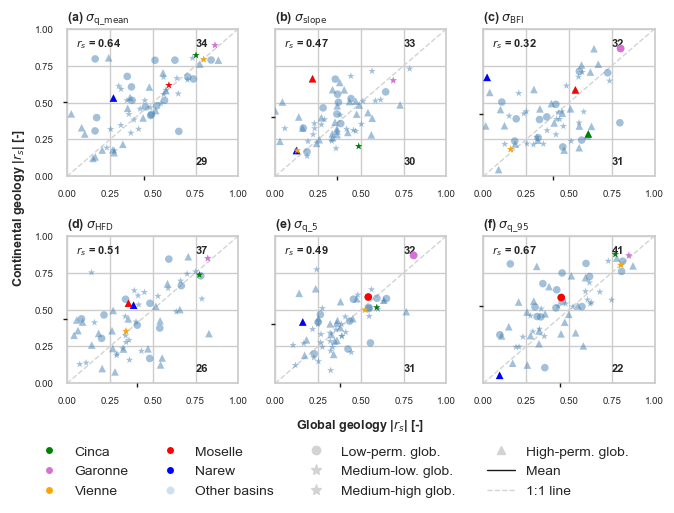

In [68]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
from matplotlib.lines import Line2D
# Set seaborn style
sns.set(style="whitegrid", context="notebook")

# Filter relevant metrics
corr_low_geology_df_25_6sig = corr_low_geology_df_25.loc[[ 
    "q_mean", "slope_sawicz", "baseflow_index", "hfd_mean", "q_5", "q_95"
]]
corr_med_geology_df_25_6sig = corr_med_geology_df_25.loc[[ 
    "q_mean", "slope_sawicz", "baseflow_index", "hfd_mean", "q_5", "q_95"
]]

# Map each signature to its top_corr_features dataframe
top_corr_features_dict = {
    "q_mean": top_corr_features_qmean,
    "slope_sawicz": top_corr_features_slope,
    "baseflow_index": top_corr_features_bfi,
    "hfd_mean": top_corr_features_hfd,
    "q_5": top_corr_features_q5,
    "q_95": top_corr_features_q95
}

# Setup figure
fig, axes = plt.subplots(2, 3, figsize=(7, 4.8), sharex=False, sharey=True)
axes = axes.flatten()

custom_x_labels = [
    '$\sigma_{\mathrm{q\_mean}}$', '$\sigma_{\mathrm{slope}}$', '$\sigma_{\mathrm{BFI}}$',
    '$\sigma_{\mathrm{HFD}}$', '$\sigma_{\mathrm{q\_5}}$', '$\sigma_{\mathrm{q\_95}}$'
]

# Loop over subplots
for i, column in enumerate(corr_low_geology_df_25_6sig.T.columns):
    x = corr_low_geology_df_25_6sig.T[column]
    y = corr_med_geology_df_25_6sig.T[column]

    axes[i].plot([0, 1], [0, 1], color='lightgray', linestyle='--', linewidth=1)

    # Get the appropriate top_corr_features dataframe
    top_corr_df = top_corr_features_dict[column]

    for basin in x.index:
        if basin not in top_corr_df.index:
            continue

        geology_med = top_corr_df.loc[basin, "geology_low"]
        marker = 'o'

        if pd.isna(geology_med) or "perm_verylow_glob" in geology_med:
            marker = 'o'
        elif "perm_low_glob" in geology_med or "perm_medium_glob" in geology_med:
            marker = '*'
        elif "perm_high_glob" in geology_med:
            marker = '^'

        axes[i].scatter(x[basin], y[basin], color='steelblue', alpha=0.5, s=30,
                        marker=marker, edgecolor='none', zorder=10)

    # Highlighted basins with color + marker
    highlight_colors = {
        "DEBU1959": "red", "PL000936": "blue", "ES000331": "green",
        "FR003986": "orange", "FR001604": "orchid"
    }
    for basin, color in highlight_colors.items():
        if basin not in top_corr_df.index:
            continue

        geology_med = top_corr_df.loc[basin, "geology_low"]
        marker = 'o'

        if pd.isna(geology_med) or "perm_verylow_glob" in geology_med:
            marker = 'o'
        elif "perm_low_glob" in geology_med or "perm_medium_glob" in geology_med:
            marker = '*'
        elif "perm_high_glob" in geology_med:
            marker = '^'

        axes[i].scatter(x[basin], y[basin], color=color, alpha=1.00, s=30,
                        marker=marker, edgecolor='none', zorder=20)

    # Spearman correlation
    rs, _ = spearmanr(x, y)
    axes[i].text(0.05, 0.90, f"$r_s$ = {rs:.2f}", transform=axes[i].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

    # Mean ticks
    mean_x = np.mean(x)
    mean_y = np.mean(y)
    axes[i].plot([mean_x, mean_x], [-0.025, 0], color='k', linestyle='--', linewidth=1, zorder=20, clip_on=False)
    axes[i].plot([-0.025, 0], [mean_y, mean_y], color='k', linestyle='--', linewidth=1, zorder=20, clip_on=False)

    # Formatting
    axes[i].set_title(f"({chr(65 + i).lower()}) {custom_x_labels[i]}", fontsize=9, loc="left", fontweight="bold")
    axes[i].set_xlim(0, 1)
    axes[i].set_ylim(0, 1)
    axes[i].set_xticks([0, 0.25, 0.5, 0.75, 1])
    axes[i].set_xticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=7)
    axes[i].set_yticks([0, 0.25, 0.5, 0.75, 1])
    axes[i].set_yticklabels(['0.00', '0.25', '0.50', '0.75', '1.00'], fontsize=7)

# Remove unused axes
for j in range(len(custom_x_labels), len(axes)):
    fig.delaxes(axes[j])

# Legend
legend_elements = [
    # Basin colors
    Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=6, label='Cinca'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orchid', markersize=6, label='Garonne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=6, label='Vienne'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='Moselle'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='Narew'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='steelblue', markersize=6, label='Other basins', alpha=0.25),

    # Markers
    Line2D([0], [0], marker='o', color='lightgray', label='Low-perm. glob.', markersize=6, linestyle='None'),
    Line2D([0], [0], marker='*', color='lightgray', label='Medium-low. glob.', markersize=8, linestyle='None'),
    Line2D([0], [0], marker='*', color='lightgray', label='Medium-high glob. ', markersize=8, linestyle='None'),
    Line2D([0], [0], marker='^', color='lightgray', label='High-perm. glob.', markersize=6, linestyle='None'),

    # Lines
    Line2D([0], [0], color='k', linestyle='-', lw=1, label='Mean'),
    Line2D([0], [0], color='lightgray', linestyle='--', lw=1, label='1:1 line'),
]

fig.legend(handles=legend_elements,
           loc='lower center',
           bbox_to_anchor=(0.5, -0.13),
           ncol=4,
           frameon=False,
           fontsize='small')

axes[0].text(0.75, 0.90, f"{positive_counts[0]}", transform=axes[0].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")
axes[0].text(0.75, 0.1, f"{63 - positive_counts[0]}", transform=axes[0].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

axes[1].text(0.75, 0.90, f"{positive_counts[1]}", transform=axes[1].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")
axes[1].text(0.75, 0.1, f"{63 - positive_counts[1]}", transform=axes[1].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

axes[2].text(0.75, 0.90, f"{positive_counts[2]}", transform=axes[2].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")
axes[2].text(0.75, 0.1, f"{63 - positive_counts[2]}", transform=axes[2].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

axes[3].text(0.75, 0.90, f"{positive_counts[3]}", transform=axes[3].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")
axes[3].text(0.75, 0.1, f"{63 - positive_counts[3]}", transform=axes[3].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

axes[4].text(0.75, 0.90, f"{positive_counts[4]}", transform=axes[4].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")
axes[4].text(0.75, 0.1, f"{63 - positive_counts[4]}", transform=axes[4].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")

axes[5].text(0.75, 0.90, f"{positive_counts[5]}", transform=axes[5].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")
axes[5].text(0.75, 0.1, f"{63 - positive_counts[5]}", transform=axes[5].transAxes,
                 fontsize=8, ha='left', va='center', fontweight="bold")



# Axis labels
fig.text(0.54, 0.04, "Global geology |$r_s$| [-]", ha='center', fontsize=9, fontweight="bold")
fig.text(0.04, 0.5, "Continental geology |$r_s$| [-]", va='center', rotation='vertical', fontsize=9, fontweight="bold")

# Layout and show
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.savefig(r"results//figs//figures/f04.png", dpi=300, bbox_inches='tight')
plt.show()

## Export some other tables for Supplementary Material

In [69]:
top_corr_features_bfi_63=top_corr_features_bfi_63[['climatic', 'lulc', 'soil', 'topography',
                                                   'geology_low', 'geology_med', 'geology_high']]


top_corr_features_qmean_63=top_corr_features_qmean_63[['climatic', 'lulc', 'soil', 'topography',
                                                   'geology_low', 'geology_med', 'geology_high']]

top_corr_features_slope_63=top_corr_features_slope_63[['climatic', 'lulc', 'soil', 'topography',
                                                   'geology_low', 'geology_med', 'geology_high']]

top_corr_features_q95_63=top_corr_features_q95_63[['climatic', 'lulc', 'soil', 'topography',
                                                   'geology_low', 'geology_med', 'geology_high']]

top_corr_features_q5_63=top_corr_features_q5_63[['climatic', 'lulc', 'soil', 'topography',
                                                   'geology_low', 'geology_med', 'geology_high']]

top_corr_features_hfd_63=top_corr_features_hfd_63[['climatic', 'lulc', 'soil', 'topography',
                                                   'geology_low', 'geology_med', 'geology_high']]

In [70]:

# Define output path
output_path = r"results/top_correlated_features_63gauges.xlsx"

# Write to Excel with multiple sheets
with pd.ExcelWriter(output_path, engine='xlsxwriter') as writer:
    top_corr_features_bfi_63.to_excel(writer, sheet_name='BFI', index=True)
    top_corr_features_qmean_63.to_excel(writer, sheet_name='Qmean', index=True)
    top_corr_features_slope_63.to_excel(writer, sheet_name='SlopeFDC', index=True)
    top_corr_features_q95_63.to_excel(writer, sheet_name='Q95', index=True)
    top_corr_features_q5_63.to_excel(writer, sheet_name='Q5', index=True)
    top_corr_features_hfd_63.to_excel(writer, sheet_name='HFD', index=True)

output_path


'results/top_correlated_features_63gauges.xlsx'

## Other counts

### Make some evaluation counting the values

In [71]:
corr_med_geology_df_25_diff = corr_med_geology_df_25 - corr_low_geology_df_25

corr_med_geology_df_25_diff

,ES000801,ES000665,ES001243,ES000196,ES000194,ES001080,ES000316,ES000339,ES000331,GB000472,...,HR000278,CZ000236,DEST1707,DEBE0155,FR002758,FR002462,FR001394,FR000867,FR004308,DEBU1959
q_mean,0.326436,-0.078467,0.230621,0.560726,0.632155,0.310614,0.166003,-0.013805,0.067934,0.158281,...,0.007470,-0.071317,-0.088834,-0.054101,-0.096913,-0.114364,-0.077651,-0.347378,-0.018854,0.023421
q_runoff_ratio,0.323756,-0.123912,0.200894,0.524419,0.654412,0.446288,0.212664,-0.045788,0.034740,0.182144,...,0.048314,-0.035887,-0.080302,-0.053627,-0.123177,-0.142019,-0.090726,-0.344130,0.000377,0.046945
q_elas_Sankarasubramanian,-0.007140,-0.164707,0.112865,0.220829,0.240430,0.213913,0.111578,-0.280284,-0.093059,0.272664,...,0.059979,0.073157,-0.002653,0.011700,-0.171035,-0.043122,0.010812,-0.133054,-0.109498,0.014549
slope_sawicz,0.094414,-0.053245,0.129850,0.128077,0.184407,-0.172744,-0.096606,0.061825,-0.283838,0.073409,...,0.017672,-0.166101,-0.280297,-0.095991,-0.056235,-0.053668,0.147468,0.192973,-0.018288,0.444174
baseflow_index,0.089435,0.057080,0.036554,0.352628,0.395785,-0.328538,-0.274466,0.033146,-0.325365,0.181531,...,-0.040895,-0.140628,-0.219758,-0.293886,-0.089516,-0.024072,-0.292873,-0.434042,-0.077623,0.049060
hfd_mean,0.079499,0.115565,-0.238216,0.608136,0.027973,-0.313949,0.180418,0.032330,-0.036667,0.248389,...,-0.215471,-0.202478,-0.090870,-0.030928,-0.151499,-0.052515,-0.158471,0.103077,-0.421053,0.185059
hfd_std,-0.000917,-0.041161,-0.022952,0.491185,0.094539,-0.092166,0.425074,0.099641,0.029842,0.081187,...,-0.157515,0.081616,0.062710,-0.280400,-0.119051,-0.020407,0.103710,-0.311537,0.258734,0.054276
q_5,-0.233512,0.004911,0.233735,0.530417,0.405152,-0.282100,0.117308,-0.070758,-0.078615,0.172359,...,0.113949,0.020761,-0.069594,-0.016523,-0.093764,-0.040018,0.002823,-0.075357,0.008379,0.041695
q_95,0.328139,0.030117,0.205457,0.480797,0.652213,0.263155,0.167348,0.070436,0.103663,0.213121,...,-0.082828,-0.031177,-0.060460,-0.055738,0.040372,-0.196696,0.014762,-0.330456,-0.037148,0.126955
hq_freq,-0.052461,0.105667,0.110051,0.578785,0.419067,0.422905,-0.300891,0.039228,-0.220011,0.064898,...,0.012026,-0.114255,-0.144442,-0.166483,-0.106048,-0.027595,-0.240300,-0.212940,-0.049277,-0.076062


In [72]:
# Count positive values in each row
positive_counts = corr_med_geology_df_25_diff.apply(lambda row: (row >= -0.0).sum(), axis=1)

# Add the counts as a new column, if desired
corr_med_geology_df_25_diff['positive_count'] = positive_counts/63

In [73]:
positive_counts

q_mean                       34
q_runoff_ratio               35
q_elas_Sankarasubramanian    44
slope_sawicz                 33
baseflow_index               32
hfd_mean                     37
hfd_std                      41
q_5                          32
q_95                         41
hq_freq                      38
hq_dur                       40
lq_freq                      35
lq_dur                       30
zero_q_freq                  38
dtype: int64

In [74]:
corr_med_geology_df_25_diff["positive_count"]

q_mean                       0.539683
q_runoff_ratio               0.555556
q_elas_Sankarasubramanian    0.698413
slope_sawicz                 0.523810
baseflow_index               0.507937
hfd_mean                     0.587302
hfd_std                      0.650794
q_5                          0.507937
q_95                         0.650794
hq_freq                      0.603175
hq_dur                       0.634921
lq_freq                      0.555556
lq_dur                       0.476190
zero_q_freq                  0.603175
Name: positive_count, dtype: float64

In [75]:
# Count values above 0.05 in each row
positive_counts = corr_med_geology_df_25_diff.apply(lambda row: (row > 0.05).sum(), axis=1)

# Count values that are either above 0.05 or below -0.05 in each row
total_count = corr_med_geology_df_25_diff.apply(lambda row: ((row > 0.05) | (row < -0.05)).sum(), axis=1)

# Calculate the final count by dividing positive counts by the adjusted total count
corr_med_geology_df_25_diff['adjusted_positive_ratio'] = positive_counts / total_count

corr_med_geology_df_25_diff['adjusted_positive_ratio']

q_mean                       0.627907
q_runoff_ratio               0.613636
q_elas_Sankarasubramanian    0.755556
slope_sawicz                 0.591837
baseflow_index               0.549020
hfd_mean                     0.588235
hfd_std                      0.711111
q_5                          0.522727
q_95                         0.729167
hq_freq                      0.568182
hq_dur                       0.666667
lq_freq                      0.565217
lq_dur                       0.523810
zero_q_freq                  0.600000
Name: adjusted_positive_ratio, dtype: float64

In [76]:
# Count values above 0.05 in each row
positive_counts = corr_med_geology_df_25_diff.apply(lambda row: (row > 0.1).sum(), axis=1)

# Count values that are either above 0.05 or below -0.05 in each row
total_count = corr_med_geology_df_25_diff.apply(lambda row: ((row > 0.1) | (row < -0.1)).sum(), axis=1)

# Calculate the final count by dividing positive counts by the adjusted total count
corr_med_geology_df_25_diff['adjusted_positive_ratio'] = positive_counts / total_count

corr_med_geology_df_25_diff['adjusted_positive_ratio']

q_mean                       0.851852
q_runoff_ratio               0.774194
q_elas_Sankarasubramanian    0.757576
slope_sawicz                 0.687500
baseflow_index               0.583333
hfd_mean                     0.631579
hfd_std                      0.708333
q_5                          0.692308
q_95                         0.812500
hq_freq                      0.606061
hq_dur                       0.857143
lq_freq                      0.696970
lq_dur                       0.666667
zero_q_freq                  0.866667
Name: adjusted_positive_ratio, dtype: float64

In [77]:
total_count

q_mean                       27
q_runoff_ratio               31
q_elas_Sankarasubramanian    33
slope_sawicz                 32
baseflow_index               36
hfd_mean                     38
hfd_std                      24
q_5                          26
q_95                         32
hq_freq                      33
hq_dur                       28
lq_freq                      33
lq_dur                       27
zero_q_freq                  15
dtype: int64

## Individual tests: Moselle

100%|██████████| 1/1 [00:00<00:00, 547.06it/s]


            len
DEBU1959  152.0


100%|██████████| 14/14 [00:00<00:00, 116.32it/s]


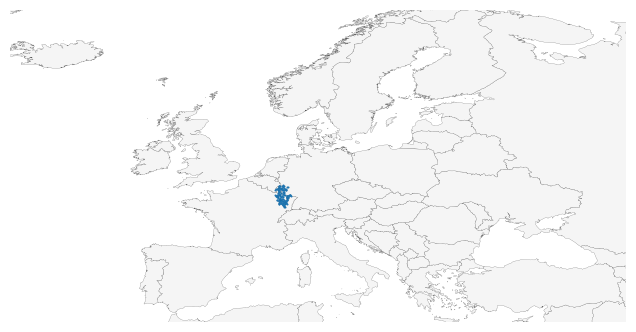

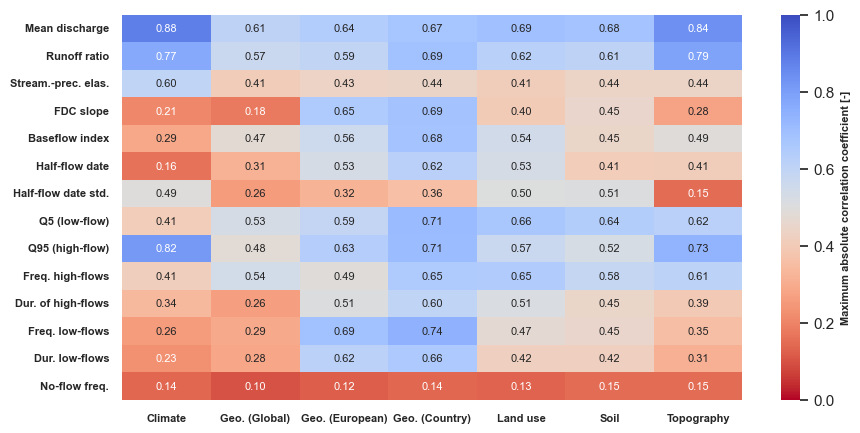

In [78]:
# Here we filter the list of nested_catchments according to this first filter:
list_cats = ["DEBU1959"]

nested_cats_df = nested_catchments.loc[list_cats, :]

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 
# Filter only the catchemnts using the function stated before:
nested_cats_filtered = find_max_unique_rows(nested_cats_df)

# Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]


# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip



# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)


# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]
print(nested_cats_filtered_abovevalue)


# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Create subplots
fig, axes = plt.subplots()
# Flatten the axes array

plot_watershed_groups_from_dict(estreams_attributes_used = estreams_attributes_dfs, figsize=(8, 6), ax=axes, 
                      title_plot='', limits_europe = True)


estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date >= "2009"]


# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in estreams_attributes_dfs.keys():

        estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date > "2009"]
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

        "perm_high_glob", "perm_medium_glob", "perm_low_glob", "perm_verylow_glob", 
        "perm_high_cont", "perm_medium_cont", "perm_low_cont", "perm_verylow_cont",
        "perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi",
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict[variable] = correlation_df

# Assuming correlation_dict is a dictionary containing all correlation DataFrames
# Initialize an empty list to store individual correlation DataFrames
correlation_list = []

# Iterate over all keys in the dictionary and append their DataFrame to the list with an added 'signature' column
for signature in correlation_dict.keys():
    corr_df = correlation_dict[signature].T
    corr_df['signature'] = signature  # Add a column to identify the signature
    correlation_list.append(corr_df)

# Concatenate all correlation DataFrames along the rows
combined_correlation_df = pd.concat(correlation_list)

# Preserve the order of the signatures by converting to categorical type
combined_correlation_df['signature'] = pd.Categorical(
    combined_correlation_df['signature'],
    categories=list(correlation_dict.keys()),
    ordered=True
)

# Set the signature column as the index
combined_correlation_df.set_index('signature', inplace=True)

# Customize row names (for demonstration purposes, modify as needed)
#custom_row_names = ['Row ' + str(i) for i in range(1, len(combined_correlation_df.index) + 1)]
#combined_correlation_df.index = custom_row_names

# Plot the combined heatmap
#plt.figure(figsize=(20, 16))
#sns.heatmap(combined_correlation_df, annot=False, cmap='coolwarm', fmt=".1f", vmin=-1, vmax=1, 
#            cbar_kws={'label': 'Correlation Coefficient'}, 
#            yticklabels=combined_correlation_df.index)
#
##plt.title('Combined Heatmap for All Signatures', fontsize=20)
##plt.xlabel('Variables', fontsize=15)
#plt.ylabel('', fontsize=15)

## Customize font sizes
#plt.xticks(fontsize=14)
#plt.yticks(fontsize=14)
#
#plt.show()


# Group the variable features to groups
# Here we can use a dictionary to reclassifiy the variables we have to groups such as: climate, soil, geolofy
variable_dict = {
        'p_mean': 'climatic',
        'pet_mean': 'climatic',
        'aridity': 'climatic',
        'p_seasonality': 'climatic',
        'frac_snow': 'climatic',
        'hp_freq': 'climatic',
        'hp_dur': 'climatic',
        'hp_time': 'climatic',
        'lp_freq': 'climatic',
        'lp_dur': 'climatic',
        'lp_time': 'climatic',
        'ele_mt_max': 'topography',
        'ele_mt_mean': 'topography',
        'ele_mt_min': 'topography',
        'slp_dg_mean': 'topography',
        'flat_area_fra': 'topography',
        'steep_area_fra': 'topography',
        'elon_ratio': 'topography',
        'strm_dens': 'topography',
        'lit_dom': 'geology',
        'bedrk_dep': 'soil',

        'perm_verylow_glob': 'geology_low',
        'perm_low_glob': 'geology_low',
        'perm_medium_glob': 'geology_low',
        'perm_high_glob': 'geology_low',

        'root_dep_mean': 'soil',
        'root_dep_max': 'soil',
        'root_dep_min': 'soil',
        'soil_tawc_mean': 'soil',
        'soil_fra_sand_mean': 'soil',
        'soil_fra_silt_mean': 'soil',
        'soil_fra_clay_mean': 'soil',
        'soil_fra_grav_mean': 'soil',
        'soil_bd_mean': 'soil',
        'soil_oc_mean': 'soil',
        'lai_mean': 'lulc',
        'ndvi_mean': 'lulc',
        'lulc_2006_urban': 'lulc',
        'lulc_2006_NonIrriAgri': 'lulc',
        'lulc_2006_Agric': 'lulc',
        'lulc_2006_forest': 'lulc',
        'lulc_2006_grass': 'lulc',
        'lulc_2006_agriculture': 'lulc',
        'dam_num': 'hydrology',
        'res_num': 'hydrology',
        'lakes_num': 'hydrology',
        'sno_cov_mean': 'climatic',
        'irri_1990': 'hydrology',
        'irri_2005': 'hydrology',

        'perm_high_cont': 'geology_med',
        'perm_medium_cont': 'geology_med',
        'perm_low_cont': 'geology_med',
        'perm_verylow_cont': 'geology_med',

        'stations_num_p_mean': 'climatic',

        'perm_high_regi': "geology_high", 
        'perm_medium_regi': "geology_high", 
        'perm_low_regi': "geology_high",
        'perm_verylow_regi': "geology_high",
        "area_estreams": "topography"
    }


# Select the variable
signatures = ['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 
              'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq']


# Define the classes (example list, adjust based on your classes)
classes = ["climatic", "geology", "geology_low", "lulc", "soil", "topography", "vegetation", "hydrology", "geology_med", "geology_high"]

corr_max_group_dfs = pd.DataFrame(columns = signatures)

for signature in signatures:
    correlation_df = correlation_dict[signature]
    
    # Initialize the dataframe with columns for each class's maximum correlation and feature
    columns = []
    for cls in classes:
        columns.append(f"corr_max_{cls}")
        columns.append(f"corr_max_feature_{cls}")

    corr_max_group_df = pd.DataFrame(index=correlation_df.columns, columns=columns)

    # Populate the dataframe with the maximum correlations for each class
    for catchment in correlation_df.columns:
        max_corr = {cls: 0 for cls in classes}
        max_feature = {cls: None for cls in classes}

        for feature in correlation_df.index:
            cls = variable_dict[feature]
            corr_value = abs(correlation_df.loc[feature, catchment])

            if corr_value > abs(max_corr[cls]):
                max_corr[cls] = correlation_df.loc[feature, catchment]
                max_feature[cls] = feature

        for cls in classes:
            corr_max_group_df.loc[catchment, f"corr_max_{cls}"] = max_corr[cls]
            corr_max_group_df.loc[catchment, f"corr_max_feature_{cls}"] = max_feature[cls]

    # Reclassify geological classes using the mapping dictionary for each class's feature
    for cls in classes:
        corr_max_group_df[f"corr_max_feature_{cls}"] = corr_max_group_df[f"corr_max_feature_{cls}"].map(variable_dict)

    corr_max_group_df = corr_max_group_df[['corr_max_climatic', 'corr_max_geology_low', "corr_max_geology_med", "corr_max_geology_high",
                                                      'corr_max_lulc', 'corr_max_soil', 'corr_max_topography', 
                                                      'corr_max_vegetation', 'corr_max_hydrology']]

    # Sort and add additional columns
    corr_max_group_df.iloc[:, 0:7] = corr_max_group_df.iloc[:, 0:7].astype(float)
    corr_max_group_df = corr_max_group_df.astype(float)
    corr_max_group_df = corr_max_group_df.T.iloc[0:-2]
    corr_max_group_dfs[signature] = corr_max_group_df


import matplotlib.pyplot as plt
import seaborn as sns

# Assuming corr_max_group_dfs is your DataFrame and it already contains the required data
# Create custom x labels
custom_x_labels = ["Climate", "Geo. (Global)", "Geo. (European)", "Geo. (Country)", "Land use", 
                   "Soil", "Topography"]  # Replace with your labels
# Create custom y labels (adjust based on your data)
custom_y_labels = ['Mean discharge', 'Runoff ratio','Stream.-prec. elas.','FDC slope','Baseflow index','Half-flow date','Half-flow date std.', 
                   'Q5 (low-flow)', 'Q95 (high-flow)','Freq. high-flows', 'Dur. of high-flows', 'Freq. low-flows', 'Dur. low-flows', 'No-flow freq.']

corr_max_group_dfs_abs = corr_max_group_dfs.abs()
# Plot the heatmap
plt.figure(figsize=(10, 5))
ax = sns.heatmap(corr_max_group_dfs_abs.T, annot=True, cmap='coolwarm_r', fmt=".2f", vmin=0, vmax=1, alpha=1)

# Set custom x labels
ax.set_xticklabels(custom_x_labels, rotation=0, ha='center', fontsize=8, fontweight='bold')  # Adjust rotation and alignment as needed
# Set custom y labels
ax.set_yticklabels(custom_y_labels, rotation=0, ha='right', fontsize=8, fontweight='bold')  # Adjust rotation and alignment as needed

# Customize the legend label
colorbar = ax.collections[0].colorbar
colorbar.set_label('Maximum absolute correlation coefficient [-]', fontsize=8, fontweight='bold')

#plt.title(f'Heatmap for {signature}')
#plt.savefig(r'results\figs\fig_paper_heatmap.png', dpi=300, bbox_inches='tight')

plt.show()



In [79]:
correlation_dict["baseflow_index"].loc[["perm_high_glob", "perm_medium_glob", "perm_low_glob", "perm_verylow_glob", 
            "perm_high_cont", "perm_medium_cont", "perm_low_cont", "perm_verylow_cont",
            "perm_high_regi", "perm_medium_regi", "perm_low_regi", "perm_verylow_regi"]]

,DEBU1959
perm_high_glob,0.473061
perm_medium_glob,-0.448081
perm_low_glob,0.200780
perm_verylow_glob,0.287463
perm_high_cont,0.557096
perm_medium_cont,-0.223361
perm_low_cont,0.339365
perm_verylow_cont,-0.095056
perm_high_regi,0.680013
perm_medium_regi,-0.246993


In [80]:
df = estreams_attributes_dfs[catchment]

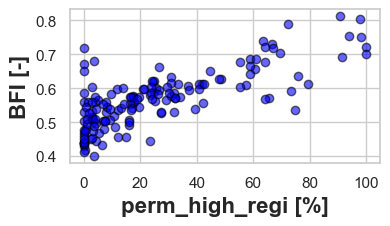

In [81]:
plt.figure(figsize=(4, 2))

plt.scatter(df['perm_high_regi'], df['baseflow_index'], color='blue', alpha=0.6, edgecolor='black')
# Create the scatter plot
plt.xlabel('perm_high_regi [%]', fontsize=16)
plt.ylabel('BFI [-]', fontsize=16)
plt.grid(True)
plt.show()

# Study area figures

#### Here we create a simple function to plot the catchments

In [82]:
# Function to plot a single catchment
def plot_catchment(ax, catchment_id, catchment_boundaries, GLiM_reprojected, color_mapping_glim, network_estreams_gdf, i, alpha_maps):
    # Select the catchment geometry
    selected_geometry = catchment_boundaries.loc[[catchment_id], "geometry"]
    
    # Create a GeoDataFrame from the selected geometries and set the CRS directly
    selected_gdf = gpd.GeoDataFrame({'geometry': selected_geometry}, crs='EPSG:4326')
    
    # Add a column for colors based on the class
    GLiM_reprojected['color'] = GLiM_reprojected['class'].map(color_mapping_glim)

    # Set plot limits to the bounding box of the selected study areas
    bounds = selected_gdf.total_bounds
    x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

    # Create a mask that covers the entire plotting area
    plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
    mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

    # Combine the selected geometries into one
    combined_geometry = selected_gdf.unary_union

    # Create the mask by subtracting the combined geometry from the plot extent
    mask['geometry'] = mask.difference(combined_geometry)

    # Plot the geology shapefile with different colors for each class
    GLiM_reprojected.plot(column='class', ax=ax, legend=False, 
                          categorical=True, color=GLiM_reprojected['color'], edgecolor='none', linewidth=0, alpha=alpha_maps)

    # Overlay the study area boundaries
    selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5, label='')

    # Plot the points from network_estreams_filtered
    network_estreams_gdf.plot(ax=ax, color='black', markersize=5, edgecolor='none', linewidth=0.5, 
                              label='Measurement Points')

    # Plot the mask to cover everything outside the study area
    mask.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_axis_off()  # Turn off both x-axis and y-axis
    ax.set_aspect('equal')
    
    # Set plot title and labels
    #ax.set_title(f'({chr(97 + i)}) {catchment_id}', fontsize="8", y=1.05, loc="left")
    ax.set_xlabel('')
    ax.set_ylabel('')

In [83]:
# Load the world shapefile dataset provided by GeoPandas
#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf = gpd.read_file(r"/Users/nascimth/Documents/data/gis/world.shp")
# Set font properties using rcParams
mpl.rcParams['font.size'] = 6          # Change the font size
mpl.rcParams['font.weight'] = 'bold'  # Change font weight (e.g., 'bold', 'normal')
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight (e.g., 'bold', 'normal')

## Appendix B: Raw geology maps for the 4 regional catchments

#### First we define a geodataframe to be further used


In [84]:
# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams['lon'], network_estreams['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams.index

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams['lon'], network_estreams['lat'])]
network_estreams_all_gdf = gpd.GeoDataFrame(network_estreams, geometry=geometry, crs='EPSG:4326')
network_estreams_all_gdf["basin_id"] = network_estreams.index

#### Part A: Global map

In [85]:
catchment_boundaries.set_index("basin_id", inplace=True)
catchment_boundaries["basin_id"] = catchment_boundaries.index
catchment_boundaries

,gauge_id,country,area_offic,area_estre,area_flag,area_rel,start_date,end_date,gauge_flag,upstream,group,geometry,basin_id
basin_id,,,,,,,,,,,,,
AT000001,200014,AT,4647.9,4668.379,0,-0.440608,1996-01-01,2021-12-31,B,16,1,"POLYGON Z ((9.69406 46.54322 0, 9.6957 46.5364...",AT000001
AT000002,200048,AT,102.0,102.287,0,-0.281373,1958-10-01,2021-12-31,B,1,1,"POLYGON Z ((10.1365 47.02949 0, 10.13495 47.02...",AT000002
AT000003,231662,AT,535.2,536.299,0,-0.205344,1985-01-02,2021-12-31,B,2,1,"POLYGON Z ((10.11095 46.89437 0, 10.11226 46.8...",AT000003
AT000004,200592,AT,66.6,66.286,0,0.471471,1998-01-02,2021-12-31,B,1,1,"POLYGON Z ((10.14189 47.09706 0, 10.14042 47.0...",AT000004
AT000005,200097,AT,72.2,72.448,0,-0.343490,1990-01-01,2019-12-31,B,3,1,"POLYGON Z ((9.67851 47.06249 0, 9.67888 47.063...",AT000005
...,...,...,...,...,...,...,...,...,...,...,...,...,...
UAGR0017,6682300,UA,321.0,325.370,0,-1.361371,1978-01-01,1987-12-31,B,1,1988,"POLYGON Z ((33.96791 44.63291 0, 33.96791 44.6...",UAGR0017
UAGR0018,6682500,UA,49.7,47.594,0,4.237425,1978-01-01,1987-12-31,B,1,1989,"POLYGON Z ((34.19958 44.58291 0, 34.20291 44.5...",UAGR0018
UAGR0019,6683010,UA,261.0,244.731,1,6.233333,1978-01-01,1987-12-31,B,1,1990,"POLYGON Z ((34.19624 44.88375 0, 34.19624 44.8...",UAGR0019


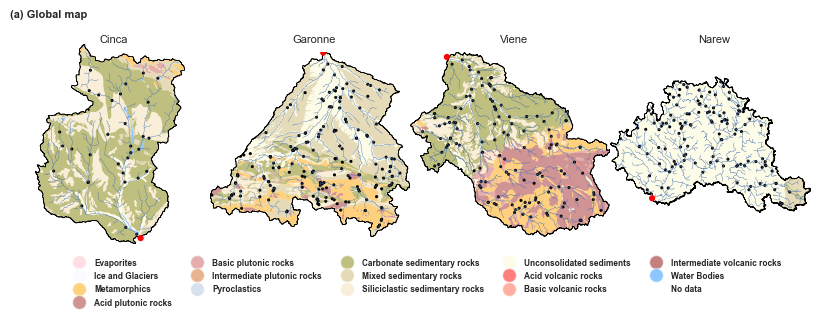

In [108]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import geopandas as gpd

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'ev': "pink",  # Evaporites
    'ig': "ghostwhite",  # Ice and Glaciers
    'mt': "orange",  # Metamorphics
    'pa': "brown",  # Acid plutonic rocks
    'pb': "indianred",  # Basic plutonic rocks
    'pi': "chocolate",  # Intermediate plutonic rocks
    'py': "lightsteelblue",  # Pyroclastics
    'sc': "olive",  # Carbonate sedimentary rocks
    'sm': "y",  # Mixed sedimentary rocks
    'ss': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'su': "#FAFAD2",  # Unconsolidated sediments
    'va': "red",  # Acid volcanic rocks
    'vb': "tomato",  # Basic volcanic rocks
    'vi': "darkred",  # Intermediate volcanic rocks
    'wb': "#1E90FF",  # Water Bodies
    'nd': "white"   # Precambrian rocks
}

# Define color mappings for legend
color_mapping_glim_legend = {
    'Evaporites': "pink",
    'Ice and Glaciers': "ghostwhite",
    'Metamorphics': "orange",
    'Acid plutonic rocks': "brown",
    'Basic plutonic rocks': "indianred",
    'Intermediate plutonic rocks': "chocolate",
    'Pyroclastics': "lightsteelblue",
    'Carbonate sedimentary rocks': "olive",
    'Mixed sedimentary rocks': "y",
    'Siliciclastic sedimentary rocks': "#F5DEB3",
    'Unconsolidated sediments': "#FAFAD2",
    'Acid volcanic rocks': "red",
    'Basic volcanic rocks': "tomato",
    'Intermediate volcanic rocks': "darkred",
    'Water Bodies': "#1E90FF",
    'No data': "white"
}

# Define catchment IDs and layout
#catchment_ids = ["FR001604", "PL000936", "FR000867", "FR000373", "DEBU1959"]
catchment_ids = ["PL000936", "ES000665", "DEBU1959", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "FR000867", "FR003986", "FR001604"]
catchment_ids = ["ES000331", "FR001604", "FR003986","PL000936", ]
catchment_names = ["Cinca", "Garonne","Viene", "Narew"]

# Define the figure size for each subplot (width, height) in inches
subplot_width = 2
subplot_height = 2  # half of the previous height for 2 rows

# Number of columns and rows for subplots
n_cols = 4
n_rows = (len(catchment_ids) + n_cols - 1) // n_cols  # to ensure all catchments are plotted


# Create figure and subplots
#fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2), constrained_layout=True)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows))


axes = axes.flatten()

j = 0
# Plot each catchment in subplots
for ax, catchment_id in zip(axes, catchment_ids):
    plot_catchment(ax, catchment_id, catchment_boundaries, GLiM_reprojected, color_mapping_glim, network_estreams_gdf, j, alpha_maps=0.5)
    
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25, label='River network')
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25, label='River network')
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25, label='River network')

    network_estreams_all_gdf.loc[[catchment_id]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)

    j = j + 1

# Hide any empty subplots
for i in range(len(catchment_ids), len(axes)):
    fig.delaxes(axes[i])

# Create legend elements
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, alpha=0.5)
                   for label, color in color_mapping_glim_legend.items()]

# Add legend outside plot area at the bottom center
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.52, -0.35), ncol=5, frameon=False, fontsize='medium', title='')

# Add catchment labels to the figure, aligning them above each subplot
for i, catchment_id in enumerate(catchment_names):
    # Position relative to each subplot area
    fig.text(0.13 + i % n_cols * 1 / n_cols, 1.025 - i // n_cols * 1 / n_rows, f'{catchment_id}',
             ha='center', va='center', fontsize=8, fontweight='normal')
    
fig.text(0.0, 1.15 , "(a) Global map",
             ha='left', va='center', fontsize=8, fontweight='bold')

# Adjust layout and display
plt.tight_layout(pad=0)

plt.savefig(r"results//figs//appendixf02a.png", dpi=500, bbox_inches='tight')

plt.show()

#### Part B: Continental map

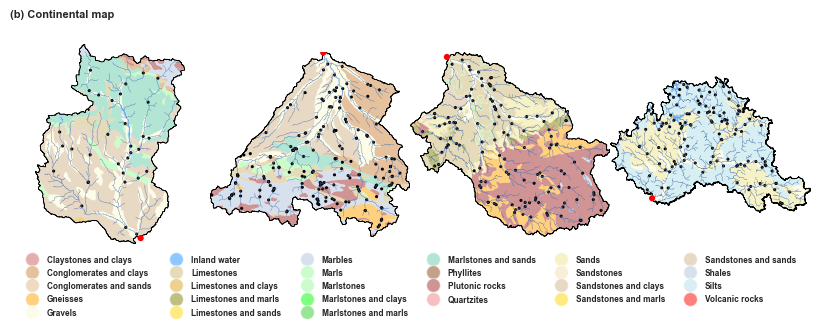

In [109]:
# Extended color mapping for geology_median_dissolved
color_mapping_geology = {
    'Claystones and clays': 'indianred',             # Same as existing
    'Clays': '#CD5C5C',                              # Similar to Claystones and clays
    'Conglomerates': '#D2B48C',                      # Tan, close to Gravels
    'Conglomerates and clays': '#CD853F',            # Peru, slightly darker to indicate mixture
    'Conglomerates and sands': '#DEB887',            # Burlywood, close to Sands
    'Gneisses': 'orange',                            # Same as existing
    'Gravels': '#FAFAD2',                            # Same as existing
    'Inland water': '#1E90FF',                       # Same as existing
    'Limestones': 'y',                               # Same as existing
    'Limestones and clays': '#DAA520',               # Goldenrod, close to Limestones
    'Limestones and marls': 'olive',                 # Same as existing
    'Limestones and sands': '#FFD700',               # Gold, close to Limestones
    'Marbles': '#B0C4DE',                            # LightSteelBlue, similar to Quartzites but distinct
    'Marls': '#98FB98',                              # Pale Green, distinct but related to marlstones
    'Marlstones': 'palegreen',                       # Same as existing
    'Marlstones and clays': 'lime',                  # Same as existing
    'Marlstones and marls': '#32CD32',               # Same as existing
    'Marlstones and sands': '#66CDAA',               # Medium Aquamarine, slightly related to Marl
    'Phyllites': '#8B4513',                          # SaddleBrown, similar to Plutonic rocks
    'Plutonic rocks': 'brown',                       # Same as existing
    'Quartzites': 'lightcoral',                      # Same as existing
    'Sands': 'khaki',                                # Same as existing
    'Sandstones': '#F5DEB3',                         # Same as existing
    'Sandstones and clays': '#D2B48C',               # Tan, slightly darker as mixture
    'Sandstones and marls': 'gold',                  # Same as existing
    'Sandstones and sands': 'tan',                   # Same as existing
    'Schists': '#778899',                            # LightSlateGray, similar to Shales
    'Shales': 'lightsteelblue',                      # Same as existing
    'Silts': '#B0E0E6',                              # PowderBlue, similar to clays but softer
    'Snow field / ice field': '#F8F8FF',             # GhostWhite, indicating a cold area
    'Volcanic rocks': 'red'                          # Same as existing
}

color_mapping_geology_legend = {
    'Claystones and clays': 'indianred',
    #'Clays': '#CD5C5C',
    #'Conglomerates': '#D2B48C',
    'Conglomerates and clays': '#CD853F',
    'Conglomerates and sands': '#DEB887',
    'Gneisses': 'orange',
    'Gravels': '#FAFAD2',
    'Inland water': '#1E90FF',
    'Limestones': 'y',
    'Limestones and clays': '#DAA520',
    'Limestones and marls': 'olive',
    'Limestones and sands': '#FFD700',
    'Marbles': '#B0C4DE',
    'Marls': '#98FB98',
    'Marlstones': 'palegreen',
    'Marlstones and clays': 'lime',
    'Marlstones and marls': '#32CD32',
    'Marlstones and sands': '#66CDAA',
    'Phyllites': '#8B4513',
    'Plutonic rocks': 'brown',
    'Quartzites': 'lightcoral',
    'Sands': 'khaki',
    'Sandstones': '#F5DEB3',
    'Sandstones and clays': '#D2B48C',
    'Sandstones and marls': 'gold',
    'Sandstones and sands': 'tan',
    #'Schists': '#778899',
    'Shales': 'lightsteelblue',
    'Silts': '#B0E0E6',
    #'Snow field / ice field': '#F8F8FF',
    'Volcanic rocks': 'red'
}

# Define catchment IDs and layout
#catchment_ids = ["FR001604", "PL000936", "FR000867", "FR000373", "DEBU1959"]
catchment_ids = ["PL000936", "ES000665", "DEBU1959", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "ES000665", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "FR000867", "FR003986", "FR001604"]
catchment_ids = ["ES000331", "FR001604", "FR003986","PL000936", ]

# Define the figure size for each subplot (width, height) in inches
subplot_width = 2
subplot_height = 2  # half of the previous height for 2 rows

# Number of columns and rows for subplots
n_cols = 5
n_rows = (len(catchment_ids) + n_cols - 1) // n_cols  # to ensure all catchments are plotted


# Create figure and subplots
#fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2), constrained_layout=True)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows))


axes = axes.flatten()

j = 0
# Plot each catchment in subplots
for ax, catchment_id in zip(axes, catchment_ids):
    plot_catchment(ax, catchment_id, catchment_boundaries, IHME_reprojected, color_mapping_geology, network_estreams_gdf, j, alpha_maps=0.5)
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25, label='River network')
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25, label='River network')
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25, label='River network')
    network_estreams_all_gdf.loc[[catchment_id]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
    
    j = j + 1

# Hide any empty subplots
for i in range(len(catchment_ids), len(axes)):
    fig.delaxes(axes[i])

# Create legend elements
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, alpha=0.5)
                   for label, color in color_mapping_geology_legend.items()]

# Add legend outside plot area at the bottom center
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.4, -0.4), ncol=6, frameon=False, fontsize='medium', title='')

fig.text(0.0, 1.15 , "(b) Continental map",
             ha='left', va='center', fontsize=8, fontweight='bold')

# Adjust layout and display
plt.tight_layout(pad=0)

plt.savefig(r"results//figs//appendixf02b.png", dpi=500, bbox_inches='tight')

plt.show()

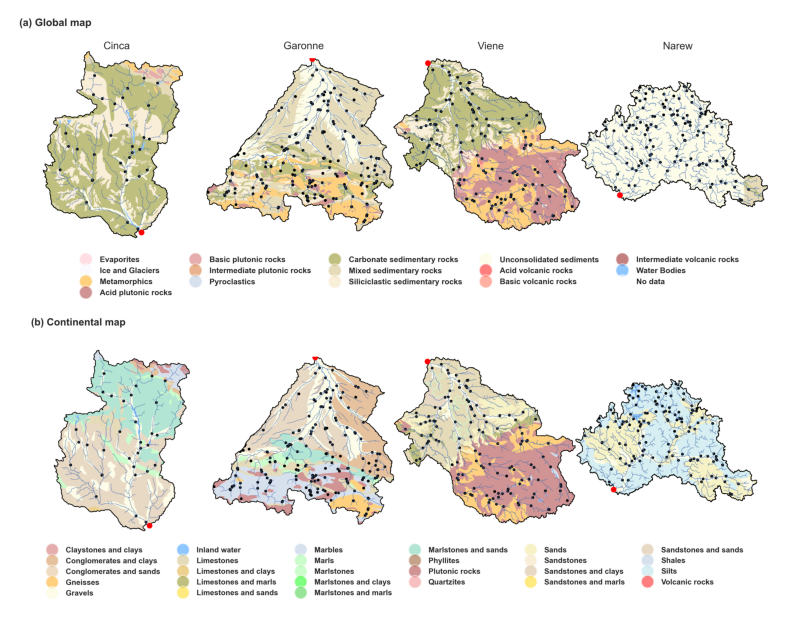

In [86]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read back as arrays
img_a = plt.imread("results/figs/appendixf02a.png")
img_b = plt.imread("results/figs/appendixf02b.png")

# Create combined figure
combined_fig = plt.figure(figsize=(9, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0.0)

ax1 = combined_fig.add_subplot(gs[0])
ax1.imshow(img_a)
ax1.axis('off')

ax2 = combined_fig.add_subplot(gs[1])
ax2.imshow(img_b)
ax2.axis('off')

# Adjust layout and save combined figure
combined_fig.tight_layout(pad=0)
combined_fig.savefig("results/figs/figures/appendixfa02.pdf", dpi=500, bbox_inches='tight')

plt.show()

Check the rock-types used (usefull for the legend creation)

In [93]:
import geopandas as gpd
from shapely.geometry import box

def clip_geology_by_basins(basin_ids, catchment_boundaries, GLiM_reprojected, color_mapping_glim):
    # Select the geometries for the specified basin IDs
    selected_geometries = catchment_boundaries[catchment_boundaries.index.isin(basin_ids)]

    # Dissolve the selected geometries into one to create a single combined shape for clipping
    combined_geometry = selected_geometries.unary_union

    # Clip the geology map by the combined basin geometry
    clipped_geology = GLiM_reprojected.clip(combined_geometry)

    # Get unique geology classes within the clipped area
    unique_geology_classes = clipped_geology['class'].unique()

    # Map colors to each unique class
    clipped_geology['color'] = clipped_geology['class'].map(color_mapping_glim)

    return clipped_geology, unique_geology_classes

# Example usage:
# List of basin IDs to clip by
#basin_ids = ["FR001604","PL000936", "FR000867", "FR000373"]  # Add more catchment IDs as needed
basin_ids = ["PL000936", "FR000867", "DEBU1959", "FR003986", "FR001604"]

# Get clipped geology and unique geology classes
clipped_geology, unique_geology_classes = clip_geology_by_basins(basin_ids, catchment_boundaries, GLiM_reprojected, color_mapping_glim)

# Display the unique geology classes in the clipped area
print("Unique geology classes in the clipped area:", unique_geology_classes)


# Get clipped geology and unique geology classes
clipped_geology, unique_geology_classes = clip_geology_by_basins(basin_ids, catchment_boundaries, IHME_reprojected, color_mapping_geology)

# Display the unique geology classes in the clipped area
print("Unique geology classes in the clipped area:", unique_geology_classes)

Unique geology classes in the clipped area: ['wb' 'vb' 'ss' 'pa' 'vi' 'mt' 'pb' 'sm' 'sc' 'su' 'va' 'pi']
Unique geology classes in the clipped area: ['Marlstones and marls' 'Marlstones and clays' 'Gravels'
 'Sandstones and sands' 'Sandstones and marls' 'Conglomerates and clays'
 'Volcanic rocks' 'Conglomerates and sands' 'Marlstones and sands' 'Marls'
 'Inland water' 'Limestones and marls' 'Sands' 'Plutonic rocks' 'Shales'
 'Marlstones' 'Limestones' 'Sandstones and clays' 'Gneisses' 'Quartzites'
 'Sandstones' 'Silts' 'Claystones and clays']


## Figure 5: Permeabilitites instead of classes

#### Global and continental map

In [87]:
# Set font properties using rcParams
mpl.rcParams['font.family'] = "sans-serif" #'helvetica'  # Change the font family
mpl.rcParams['font.size'] = 8          # Change the font size
mpl.rcParams['font.weight'] = 'bold'  # Change font weight (e.g., 'bold', 'normal')
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight (e.g., 'bold', 'normal')

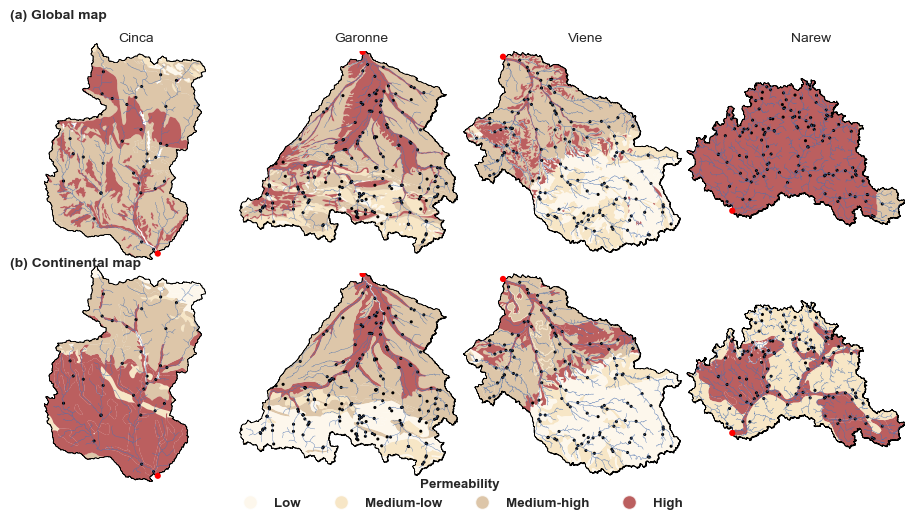

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import geopandas as gpd

# COLOR MAPPINGS
color_mapping_glim = {
    'ev': "oldlace", 'ig': "oldlace", 'mt': "wheat", 'pa': "oldlace", 'pb': "oldlace",
    'pi': "wheat", 'py': "wheat", 'sc': "tan", 'sm': "tan", 'ss': "brown",
    'su': "brown", 'va': "oldlace", 'vb': "oldlace", 'vi': "wheat",
    'wb': "white", 'nd': "white"
}

color_mapping_geology = {
    'Claystones and clays': 'wheat', 'Clays': 'oldlace', 'Conglomerates': 'brown',
    'Conglomerates and clays': 'tan', 'Conglomerates and sands': 'brown',
    'Gneisses': 'wheat', 'Gravels': 'brown', 'Inland water': 'oldlace',
    'Limestones': 'tan', 'Limestones and clays': 'tan', 'Limestones and marls': 'tan',
    'Limestones and sands': 'tan', 'Marbles': 'wheat', 'Marls': 'wheat',
    'Marlstones': 'wheat', 'Marlstones and clays': 'wheat', 'Marlstones and marls': 'wheat',
    'Marlstones and sands': 'tan', 'Phyllites': 'wheat', 'Plutonic rocks': 'oldlace',
    'Quartzites': 'oldlace', 'Sands': 'brown', 'Sandstones': 'brown',
    'Sandstones and clays': 'tan', 'Sandstones and marls': 'tan',
    'Sandstones and sands': 'brown', 'Schists': 'wheat', 'Shales': 'oldlace',
    'Silts': 'wheat', 'Snow field / ice field': 'oldlace', 'Volcanic rocks': 'oldlace'
}

color_mapping_geology_legend = {
    'Low': 'oldlace', 'Medium-low': 'wheat', 'Medium-high': 'tan', 'High': 'brown'
}

#  SHARED SETTINGS
catchment_ids = ["ES000331", "FR001604", "FR003986", "PL000936"]
catchment_names = ["Cinca", "Garonne", "Viene", "Narew"]

subplot_width = 2
subplot_height = 2
n_cols = 4
n_rows = 2

# FIGURE AND AXES
fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(9, 4.5))
axes = axes.flatten()

# PLOT GLOBAL MAPS (TOP ROW)
for j, catchment_id in enumerate(catchment_ids):
    ax = axes[j]
    plot_catchment(ax, catchment_id, catchment_boundaries, GLiM_reprojected,
                   color_mapping_glim, network_estreams_all_gdf, j, alpha_maps=0.75)
    
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25)
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25)
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25)

    network_estreams_all_gdf.loc[[catchment_id]].plot(
        ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, zorder=10
    )

# PLOT CONTINENTAL MAPS (BOTTOM ROW)
for j, catchment_id in enumerate(catchment_ids):
    ax = axes[j + n_cols]
    plot_catchment(ax, catchment_id, catchment_boundaries, IHME_reprojected,
                   color_mapping_geology, network_estreams_all_gdf, j, alpha_maps=0.75)
    
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25)
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25)
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25)

    network_estreams_all_gdf.loc[[catchment_id]].plot(
        ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, zorder=10
    )

# LABEL EACH COLUMN WITH CATCHMENT NAME
for i, catchment_id in enumerate(catchment_names):
    # Position relative to each subplot area
    fig.text(0.14 + i % n_cols * 1 / n_cols, 1 - i // n_cols * 1 / n_rows, f'{catchment_id}',
             ha='center', va='center', fontsize=10, fontweight='normal')
    
# ADD TITLES (a) and (b)
fig.text(0.0, 1.05, "(a) Global map", ha='left', va='center',
         fontsize=10, fontweight='bold')
fig.text(0.0, 0.50, "(b) Continental map", ha='left', va='center',
         fontsize=10, fontweight='bold')

# ADD LEGEND (bottom center)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor=color,
           markersize=10, label=label, alpha=0.75)
    for label, color in color_mapping_geology_legend.items()
]
fig.legend(handles=legend_elements, loc='lower center',
           bbox_to_anchor=(0.5, -0.075), ncol=7, frameon=False,
           fontsize='large', title='Permeability', title_fontsize='large' )

plt.tight_layout(pad=0.5)
#fig.savefig("results/figs/figures/f05.png", dpi=300, bbox_inches='tight')

plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read back as arrays
img_a = plt.imread("results/figs/appendixf02a.png")
img_b = plt.imread("results/figs/appendixf02b.png")

# Create combined figure
combined_fig = plt.figure(figsize=(9, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0.0)

ax1 = combined_fig.add_subplot(gs[0])
ax1.imshow(img_a)
ax1.axis('off')

ax2 = combined_fig.add_subplot(gs[1])
ax2.imshow(img_b)
ax2.axis('off')

# Adjust layout and save combined figure
combined_fig.tight_layout(pad=0)
combined_fig.savefig("results/figs/figures/appendixfa02.pdf", dpi=500, bbox_inches='tight')

plt.show()

#### Part A: Global map

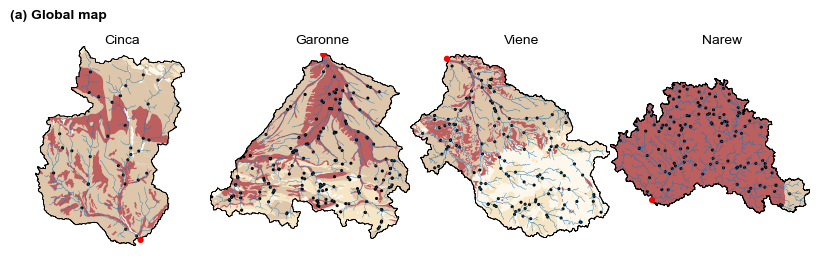

In [140]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import geopandas as gpd

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'ev': "oldlace",  # Evaporites
    'ig': "oldlace",  # Ice and Glaciers
    'mt': "wheat",  # Metamorphics
    'pa': "oldlace",  # Acid plutonic rocks
    'pb': "oldlace",  # Basic plutonic rocks
    'pi': "wheat",  # Intermediate plutonic rocks
    'py': "wheat",  # Pyroclastics
    'sc': "tan",  # Carbonate sedimentary rocks
    'sm': "tan",  # Mixed sedimentary rocks
    'ss': "brown",  # Siliciclastic sedimentary rocks
    'su': "brown",  # Unconsolidated sediments
    'va': "oldlace",  # Acid volcanic rocks
    'vb': "oldlace",  # Basic volcanic rocks
    'vi': "wheat",  # Intermediate volcanic rocks
    'wb': "white",  # Water Bodies
    'nd': "white"   # Precambrian rocks
}

# Define color mappings for legend
color_mapping_glim_legend = {
    'Evaporites': "pink",
    'Ice and Glaciers': "ghostwhite",
    'Metamorphics': "orange",
    'Acid plutonic rocks': "brown",
    'Basic plutonic rocks': "indianred",
    'Intermediate plutonic rocks': "chocolate",
    'Pyroclastics': "lightsteelblue",
    'Carbonate sedimentary rocks': "olive",
    'Mixed sedimentary rocks': "y",
    'Siliciclastic sedimentary rocks': "#F5DEB3",
    'Unconsolidated sediments': "#FAFAD2",
    'Acid volcanic rocks': "red",
    'Basic volcanic rocks': "tomato",
    'Intermediate volcanic rocks': "darkred",
    'Water Bodies': "#1E90FF",
    'No data': "white"
}

# Define catchment IDs and layout
#catchment_ids = ["FR001604", "PL000936", "FR000867", "FR000373", "DEBU1959"]
catchment_ids = ["PL000936", "ES000665", "DEBU1959", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "FR000867", "FR003986", "FR001604"]
catchment_ids = ["ES000331", "FR001604", "FR003986", "PL000936"]
catchment_names = ["Cinca", "Garonne","Viene", "Narew"]

# Define the figure size for each subplot (width, height) in inches
subplot_width = 2
subplot_height = 2  # half of the previous height for 2 rows

# Number of columns and rows for subplots
n_cols = 4
n_rows = (len(catchment_ids) + n_cols - 1) // n_cols  # to ensure all catchments are plotted


# Create figure and subplots
#fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2), constrained_layout=True)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows))

axes = axes.flatten()

j = 0
# Plot each catchment in subplots
for ax, catchment_id in zip(axes, catchment_ids):
    plot_catchment(ax, catchment_id, catchment_boundaries, GLiM_reprojected, color_mapping_glim, network_estreams_all_gdf, j, alpha_maps=0.75)
    
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25, label='River network')
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25, label='River network')
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25, label='River network')
    
    network_estreams_all_gdf.loc[[catchment_id]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
    j = j + 1

# Hide any empty subplots
for i in range(len(catchment_ids), len(axes)):
    fig.delaxes(axes[i])

# Add catchment labels to the figure, aligning them above each subplot
for i, catchment_id in enumerate(catchment_names):
    # Position relative to each subplot area
    fig.text(0.14 + i % n_cols * 1 / n_cols, 1.025 - i // n_cols * 1 / n_rows, f'{catchment_id}',
             ha='center', va='center', fontsize=10, fontweight='normal')
    
fig.text(0.0, 1.15 , "(a) Global map",
             ha='left', va='center', fontsize=10, fontweight='bold')

# Adjust layout and display
plt.tight_layout(pad=0)

fig.savefig(r'results/figs/f04a.png', dpi=300, bbox_inches='tight')

plt.show()

#### Part B: Continental map

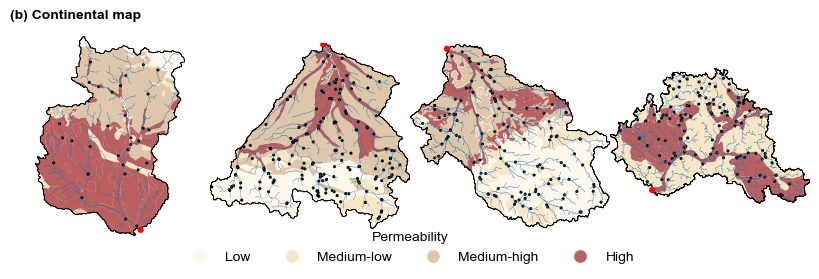

In [141]:
#catchment_boundaries["basin_id"] = catchment_boundaries.index

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import geopandas as gpd

# Extended color mapping for geology_median_dissolved
color_mapping_geology = {
    'Claystones and clays': 'wheat',             # Same as existing
    'Clays': 'oldlace',                              # Similar to Claystones and clays
    'Conglomerates': 'brown',                      # Tan, close to Gravels
    'Conglomerates and clays': 'tan',            # Peru, slightly darker to indicate mixture
    'Conglomerates and sands': 'brown',            # Burlywood, close to Sands
    'Gneisses': 'wheat',                            # Same as existing
    'Gravels': 'brown',                            # Same as existing
    'Inland water': 'oldlace',                       # Same as existing
    'Limestones': 'tan',                               # Same as existing
    'Limestones and clays': 'tan',               # Goldenrod, close to Limestones
    'Limestones and marls': 'tan',                 # Same as existing
    'Limestones and sands': 'tan',               # Gold, close to Limestones
    'Marbles': 'wheat',                            # LightSteelBlue, similar to Quartzites but distinct
    'Marls': 'wheat',                              # Pale Green, distinct but related to marlstones
    'Marlstones': 'wheat',                       # Same as existing
    'Marlstones and clays': 'wheat',                  # Same as existing
    'Marlstones and marls': 'wheat',               # Same as existing
    'Marlstones and sands': 'tan',               # Medium Aquamarine, slightly related to Marl
    'Phyllites': 'wheat',                          # SaddleBrown, similar to Plutonic rocks
    'Plutonic rocks': 'oldlace',                       # Same as existing
    'Quartzites': 'oldlace',                      # Same as existing
    'Sands': 'brown',                                # Same as existing
    'Sandstones': 'brown',                         # Same as existing
    'Sandstones and clays': 'tan',               # Tan, slightly darker as mixture
    'Sandstones and marls': 'tan',                  # Same as existing
    'Sandstones and sands': 'brown',                   # Same as existing
    'Schists': 'wheat',                            # LightSlateGray, similar to Shales
    'Shales': 'oldlace',                      # Same as existing
    'Silts': 'wheat',                              # PowderBlue, similar to clays but softer
    'Snow field / ice field': 'oldlace',             # GhostWhite, indicating a cold area
    'Volcanic rocks': 'oldlace'                          # Same as existing
}

# Define catchment IDs and layout
#catchment_ids = ["FR001604", "PL000936", "FR000867", "FR000373", "DEBU1959"]
catchment_ids = ["PL000936", "ES000665", "DEBU1959", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "ES000665", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "FR000867", "FR003986", "FR001604"]
catchment_ids = ["ES000331", "FR001604", "FR003986", "PL000936"]

# Define the figure size for each subplot (width, height) in inches
subplot_width = 2
subplot_height = 2  # half of the previous height for 2 rows

# Number of columns and rows for subplots
n_cols = 4
n_rows = (len(catchment_ids) + n_cols - 1) // n_cols  # to ensure all catchments are plotted


# Create figure and subplots
#fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2), constrained_layout=True)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows))


axes = axes.flatten()

j = 0
# Plot each catchment in subplots
for ax, catchment_id in zip(axes, catchment_ids):
    plot_catchment(ax, catchment_id, catchment_boundaries, IHME_reprojected, color_mapping_geology, network_estreams_all_gdf, j,
                   alpha_maps=0.75)
    
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25, label='River network')
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25, label='River network')
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25, label='River network')
    
    network_estreams_all_gdf.loc[[catchment_id]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
    j = j + 1

# Hide any empty subplots
for i in range(len(catchment_ids), len(axes)):
    fig.delaxes(axes[i])

# Define your dictionary with labels and corresponding colors
color_mapping_geology_legend = {
    'Low': 'oldlace',
    'Medium-low': 'wheat',
    'Medium-high': 'tan',
    'High': 'brown'
}

# Create legend elements
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, alpha=0.75)
                   for label, color in color_mapping_geology_legend.items()]

# Add legend outside plot area at the bottom center
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=7, frameon=False, fontsize='small', title='Permeability', title_fontsize='small')

fig.text(0.0, 1.1 , "(b) Continental map",
             ha='left', va='center', fontsize=10, fontweight='bold')
# Adjust layout and display
plt.tight_layout(pad=0)

fig.savefig(r'results/figs/f04b.png', dpi=300, bbox_inches='tight')

plt.show()

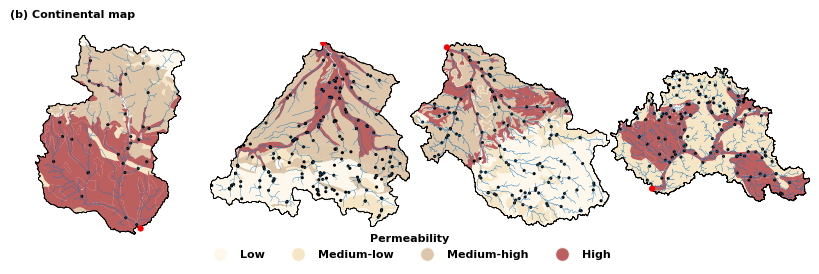

In [74]:
#catchment_boundaries["basin_id"] = catchment_boundaries.index

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import geopandas as gpd

# Extended color mapping for geology_median_dissolved
color_mapping_geology = {
    'Claystones and clays': 'wheat',             # Same as existing
    'Clays': 'oldlace',                              # Similar to Claystones and clays
    'Conglomerates': 'brown',                      # Tan, close to Gravels
    'Conglomerates and clays': 'tan',            # Peru, slightly darker to indicate mixture
    'Conglomerates and sands': 'brown',            # Burlywood, close to Sands
    'Gneisses': 'wheat',                            # Same as existing
    'Gravels': 'brown',                            # Same as existing
    'Inland water': 'oldlace',                       # Same as existing
    'Limestones': 'tan',                               # Same as existing
    'Limestones and clays': 'tan',               # Goldenrod, close to Limestones
    'Limestones and marls': 'tan',                 # Same as existing
    'Limestones and sands': 'tan',               # Gold, close to Limestones
    'Marbles': 'wheat',                            # LightSteelBlue, similar to Quartzites but distinct
    'Marls': 'wheat',                              # Pale Green, distinct but related to marlstones
    'Marlstones': 'wheat',                       # Same as existing
    'Marlstones and clays': 'wheat',                  # Same as existing
    'Marlstones and marls': 'wheat',               # Same as existing
    'Marlstones and sands': 'tan',               # Medium Aquamarine, slightly related to Marl
    'Phyllites': 'wheat',                          # SaddleBrown, similar to Plutonic rocks
    'Plutonic rocks': 'oldlace',                       # Same as existing
    'Quartzites': 'oldlace',                      # Same as existing
    'Sands': 'brown',                                # Same as existing
    'Sandstones': 'brown',                         # Same as existing
    'Sandstones and clays': 'tan',               # Tan, slightly darker as mixture
    'Sandstones and marls': 'tan',                  # Same as existing
    'Sandstones and sands': 'brown',                   # Same as existing
    'Schists': 'wheat',                            # LightSlateGray, similar to Shales
    'Shales': 'oldlace',                      # Same as existing
    'Silts': 'wheat',                              # PowderBlue, similar to clays but softer
    'Snow field / ice field': 'oldlace',             # GhostWhite, indicating a cold area
    'Volcanic rocks': 'oldlace'                          # Same as existing
}

# Define catchment IDs and layout
#catchment_ids = ["FR001604", "PL000936", "FR000867", "FR000373", "DEBU1959"]
catchment_ids = ["PL000936", "ES000665", "DEBU1959", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "ES000665", "FR001604", "FR000867"]
catchment_ids = ["PL000936", "FR000867", "FR003986", "FR001604"]
catchment_ids = ["ES000331", "FR001604", "FR003986", "PL000936"]

# Define the figure size for each subplot (width, height) in inches
subplot_width = 2
subplot_height = 2  # half of the previous height for 2 rows

# Number of columns and rows for subplots
n_cols = 4
n_rows = (len(catchment_ids) + n_cols - 1) // n_cols  # to ensure all catchments are plotted


# Create figure and subplots
#fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2, n_rows * 2), constrained_layout=True)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(subplot_width * n_cols, subplot_height * n_rows))


axes = axes.flatten()

j = 0
# Plot each catchment in subplots
for ax, catchment_id in zip(axes, catchment_ids):
    plot_catchment(ax, catchment_id, catchment_boundaries, IHME_reprojected, color_mapping_geology, network_estreams_all_gdf, j,
                   alpha_maps=0.75)
    
    if catchment_id == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25, label='River network')
    elif catchment_id == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25, label='River network')
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25, label='River network')
    
    network_estreams_all_gdf.loc[[catchment_id]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
    j = j + 1

# Hide any empty subplots
for i in range(len(catchment_ids), len(axes)):
    fig.delaxes(axes[i])

# Define your dictionary with labels and corresponding colors
color_mapping_geology_legend = {
    'Low': 'oldlace',
    'Medium-low': 'wheat',
    'Medium-high': 'tan',
    'High': 'brown'
}

# Create legend elements
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, alpha=0.75)
                   for label, color in color_mapping_geology_legend.items()]

# Add legend outside plot area at the bottom center
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, -0.175), ncol=7, frameon=False, fontsize='medium', title='Permeability')

fig.text(0.0, 1.1 , "(b) Continental map",
             ha='left', va='center', fontsize=8, fontweight='bold')
# Adjust layout and display
plt.tight_layout(pad=0)

fig.savefig(r'results\figs\fig_permeabilities_b_4.png', dpi=300, bbox_inches='tight')

plt.show()

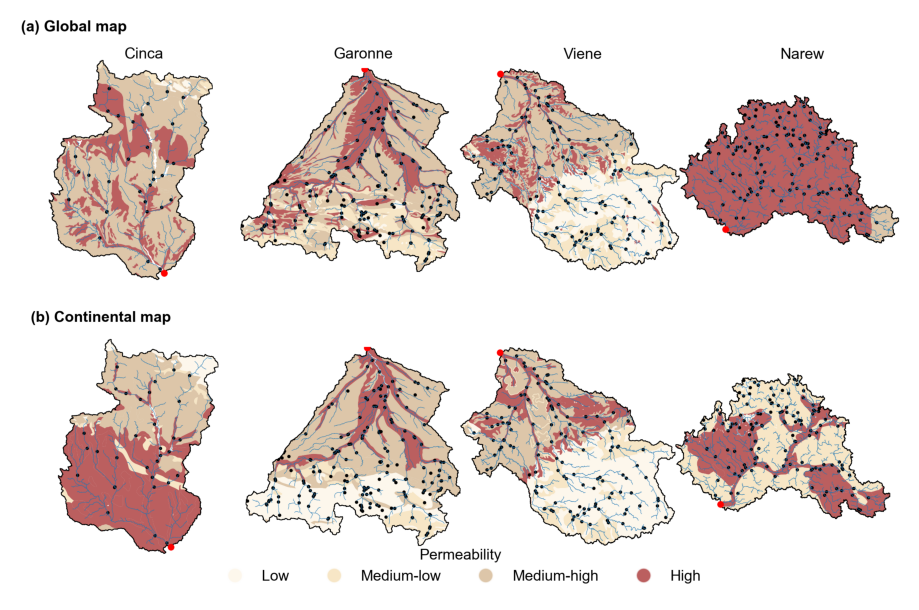

In [144]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Read back as arrays
img_a = plt.imread("results/figs/f04a.png")
img_b = plt.imread("results/figs/f04b.png")

# Create combined figure
combined_fig = plt.figure(figsize=(9, 6))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0.0)

ax1 = combined_fig.add_subplot(gs[0])
ax1.imshow(img_a)
ax1.axis('off')

ax2 = combined_fig.add_subplot(gs[1])
ax2.imshow(img_b)
ax2.axis('off')

# Adjust layout and save combined figure
combined_fig.tight_layout(pad=0)
combined_fig.savefig("results/figs/figures/f05.png", dpi=300, bbox_inches='tight')

plt.show()

## Tables
#### Export a table with data for supporting information

In [92]:
estreams_attributes_dfs_moselle = estreams_attributes_dfs["DEBU1959"][["area_estreams", 'lon', 'lat', 'start_date', 'end_date',
       'num_years', "gauges_upstream"]]
estreams_attributes_dfs_moselle.to_csv("results/table_modelle.csv")

# Intermediate scale analysis: Moselle

## Boxplot of the Moselle 

In [93]:
# First we define the outlet of the Moselle to be used
outlets = ["DEBU1959"]
nested_cats_df = nested_catchments.loc[outlets, :]

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

estreams_attributes_dfs["DEBU1959"]

100%|██████████| 1/1 [00:00<00:00, 774.00it/s]


,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi
basin_id,,,,,,,,,,,,,,,,,,,,,
BEWA0066,99141002,Reuland,BE,BE_SPW,Our,6.151802,50.188258,6.151802,50.188258,NaN,...,0.00,0.00,7.497,1.400,3.429,16.0,2.947531,0.000000,3.319025,93.733444
BEWA0067,99261002,Schoenberg,BE,BE_SPW,Our,6.263467,50.289277,6.263467,50.289277,NaN,...,0.00,0.00,8.920,0.000,0.075,8.0,2.347625,0.000000,0.000000,97.652375
BEWA0087,56100000,Martelange,BE,BE_SPW,Sure,5.739269,49.833704,5.739269,49.833704,NaN,...,0.00,0.00,6.106,0.000,0.000,6.0,0.005000,0.000000,0.000000,99.995000
BEWA0106,60800000,Reuland,BE,BE_SPW,Ulf,6.150669,50.196522,6.150669,50.196522,NaN,...,0.00,0.00,7.096,1.200,2.427,9.0,0.000000,0.000000,0.000000,100.000000
BEWA0107,60900000,Lommersweiler,BE,BE_SPW,Braunlauf,6.153292,50.235014,6.153955,50.234494,NaN,...,0.00,0.00,6.996,0.200,0.605,6.0,3.999021,0.000000,15.492765,80.508214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,34,Michelau,LU,LU_CONTACTFORM,Sure,6.091178,49.895421,6.091178,49.895421,NaN,...,1.80,62.62,5.680,0.045,0.045,25.0,1.917023,0.000000,0.000000,98.082977
LU000016,3,Pfaffenthal,LU,LU_CONTACTFORM,Alzette,6.132266,49.620647,6.132266,49.620647,NaN,...,0.00,0.00,2.863,0.004,0.009,15.0,14.327884,32.255374,53.416742,0.000000
LU000017,16,Rosport,LU,LU_CONTACTFORM,Sure,6.509851,49.785883,6.509851,49.785883,NaN,...,2.67,67.85,4.753,1.641,4.770,78.0,18.753136,5.872553,24.977481,50.396831


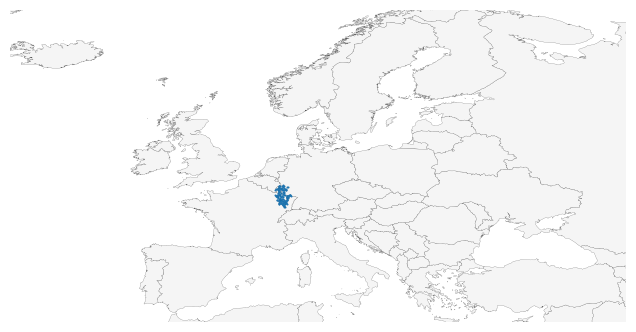

In [94]:
# Here we just plot the catchment for visual inspection
fig, axes = plt.subplots()
# Flatten the axes array

plot_watershed_groups_from_dict(estreams_attributes_used = estreams_attributes_dfs, figsize=(8, 6), ax=axes, 
                      title_plot='', limits_europe = True)

### Computation of the correlation values

In [95]:
# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in estreams_attributes_dfs.keys():

        estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
        #estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date > "2009"]
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       "perm_verylow_regi", "perm_low_regi", "perm_medium_regi", "perm_high_regi",
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict.keys())

100%|██████████| 14/14 [00:00<00:00, 87.98it/s]

dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


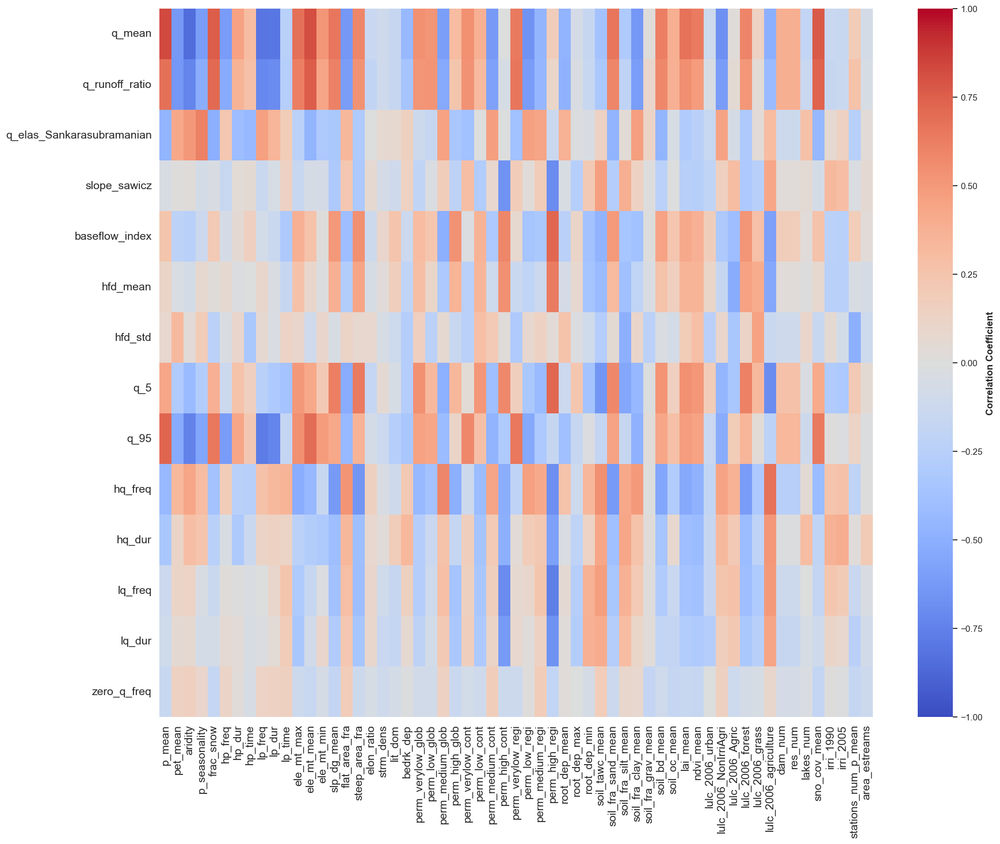

In [96]:
# Assuming correlation_dict is a dictionary containing all correlation DataFrames
# Initialize an empty list to store individual correlation DataFrames
correlation_list = []

# Iterate over all keys in the dictionary and append their DataFrame to the list with an added 'signature' column
for signature in correlation_dict.keys():
    corr_df = correlation_dict[signature].T
    corr_df['signature'] = signature  # Add a column to identify the signature
    correlation_list.append(corr_df)

# Concatenate all correlation DataFrames along the rows
combined_correlation_df = pd.concat(correlation_list)

# Preserve the order of the signatures by converting to categorical type
combined_correlation_df['signature'] = pd.Categorical(
    combined_correlation_df['signature'],
    categories=list(correlation_dict.keys()),
    ordered=True
)

# Set the signature column as the index
combined_correlation_df.set_index('signature', inplace=True)

# Customize row names (for demonstration purposes, modify as needed)
#custom_row_names = ['Row ' + str(i) for i in range(1, len(combined_correlation_df.index) + 1)]
#combined_correlation_df.index = custom_row_names

# Plot the combined heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(combined_correlation_df, annot=False, cmap='coolwarm', fmt=".1f", vmin=-1, vmax=1, 
            cbar_kws={'label': 'Correlation Coefficient'}, 
            yticklabels=combined_correlation_df.index)

#plt.title('Combined Heatmap for All Signatures', fontsize=20)
#plt.xlabel('Variables', fontsize=15)
plt.ylabel('', fontsize=15)

# Customize font sizes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.show()

In [97]:
# Group the variable features to groups
# Here we can use a dictionary to reclassifiy the variables we have to groups such as: climate, soil, geolofy
variable_dict = {
        'p_mean': 'climatic',
        'pet_mean': 'climatic',
        'aridity': 'climatic',
        'p_seasonality': 'climatic',
        'frac_snow': 'climatic',
        'hp_freq': 'climatic',
        'hp_dur': 'climatic',
        'hp_time': 'climatic',
        'lp_freq': 'climatic',
        'lp_dur': 'climatic',
        'lp_time': 'climatic',
        'ele_mt_max': 'topography',
        'ele_mt_mean': 'topography',
        'ele_mt_min': 'topography',
        'slp_dg_mean': 'topography',
        'flat_area_fra': 'topography',
        'steep_area_fra': 'topography',
        'elon_ratio': 'topography',
        'strm_dens': 'topography',
        'lit_dom': 'geology',
        'bedrk_dep': 'soil',

        'perm_verylow_glob': 'geology_low',
        'perm_low_glob': 'geology_low',
        'perm_medium_glob': 'geology_low',
        'perm_high_glob': 'geology_low',

        'root_dep_mean': 'soil',
        'root_dep_max': 'soil',
        'root_dep_min': 'soil',
        'soil_tawc_mean': 'soil',
        'soil_fra_sand_mean': 'soil',
        'soil_fra_silt_mean': 'soil',
        'soil_fra_clay_mean': 'soil',
        'soil_fra_grav_mean': 'soil',
        'soil_bd_mean': 'soil',
        'soil_oc_mean': 'soil',
        'lai_mean': 'lulc',
        'ndvi_mean': 'lulc',
        'lulc_2006_urban': 'lulc',
        'lulc_2006_NonIrriAgri': 'lulc',
        'lulc_2006_Agric': 'lulc',
        'lulc_2006_forest': 'lulc',
        'lulc_2006_grass': 'lulc',
        'lulc_2006_agriculture': 'lulc',
        'dam_num': 'hydrology',
        'res_num': 'hydrology',
        'lakes_num': 'hydrology',
        'sno_cov_mean': 'climatic',
        'irri_1990': 'hydrology',
        'irri_2005': 'hydrology',

        'perm_high_cont': 'geology_med',
        'perm_medium_cont': 'geology_med',
        'perm_low_cont': 'geology_med',
        'perm_verylow_cont': 'geology_med',

        'stations_num_p_mean': 'climatic',

        'perm_high_regi': "geology_high", 
        'perm_medium_regi': "geology_high", 
        'perm_low_regi': "geology_high",
        'perm_verylow_regi': "geology_high",
        "area_estreams": "topography"
    }

# Select the variable
signatures = ['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 
              'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq']


# Define the classes (example list, adjust based on your classes)
classes = ["climatic", "geology", "geology_low", "lulc", "soil", "topography", "vegetation", "hydrology", "geology_med", "geology_high"]

corr_max_group_dfs = pd.DataFrame(columns = signatures)

for signature in signatures:
    correlation_df = correlation_dict[signature]
    
    # Initialize the dataframe with columns for each class's maximum correlation and feature
    columns = []
    for cls in classes:
        columns.append(f"corr_max_{cls}")
        columns.append(f"corr_max_feature_{cls}")

    corr_max_group_df = pd.DataFrame(index=correlation_df.columns, columns=columns)

    # Populate the dataframe with the maximum correlations for each class
    for catchment in correlation_df.columns:
        max_corr = {cls: 0 for cls in classes}
        max_feature = {cls: None for cls in classes}

        for feature in correlation_df.index:
            cls = variable_dict[feature]
            corr_value = abs(correlation_df.loc[feature, catchment])

            if corr_value > abs(max_corr[cls]):
                max_corr[cls] = correlation_df.loc[feature, catchment]
                max_feature[cls] = feature

        for cls in classes:
            corr_max_group_df.loc[catchment, f"corr_max_{cls}"] = max_corr[cls]
            corr_max_group_df.loc[catchment, f"corr_max_feature_{cls}"] = max_feature[cls]

    # Reclassify geological classes using the mapping dictionary for each class's feature
    for cls in classes:
        corr_max_group_df[f"corr_max_feature_{cls}"] = corr_max_group_df[f"corr_max_feature_{cls}"].map(variable_dict)

    corr_max_group_df = corr_max_group_df[['corr_max_geology_low', "corr_max_geology_med", "corr_max_geology_high", 'corr_max_climatic', 
                                                      'corr_max_lulc', 'corr_max_soil', 'corr_max_topography', 
                                                      'corr_max_vegetation', 'corr_max_hydrology']]

    # Sort and add additional columns
    corr_max_group_df.iloc[:, 0:7] = corr_max_group_df.iloc[:, 0:7].astype(float)
    corr_max_group_df = corr_max_group_df.astype(float)
    corr_max_group_df = corr_max_group_df.T.iloc[0:-2]
    corr_max_group_dfs[signature] = corr_max_group_df


In [98]:
# Set font properties using rcParams
plt.rcParams['font.family'] = "sans-serif" #'helvetica'  # Change the font family
plt.rcParams['font.size'] = 8         # Change the font size
plt.rcParams['font.weight'] = 'normal'  # Change font weight (e.g., 'bold', 'normal')
plt.rcParams['axes.labelweight'] = 'normal'  # Change label font weight (e.g., 'bold', 'normal')


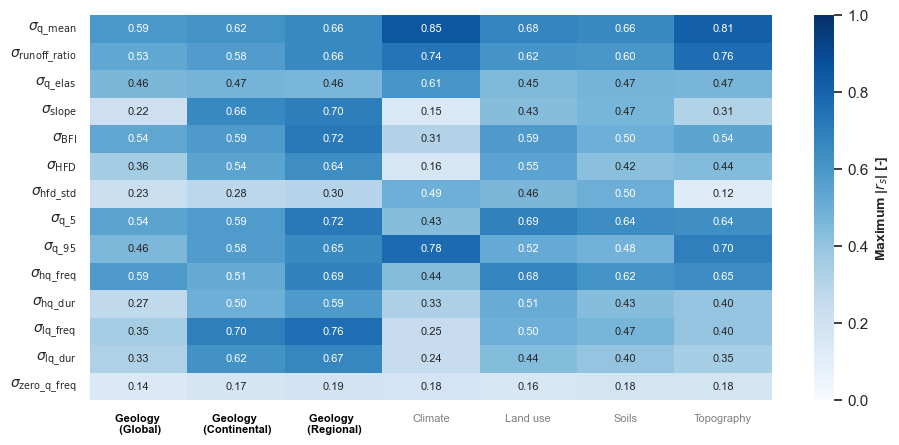

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming corr_max_group_dfs is your DataFrame and it already contains the required data
# Create custom x labels
custom_x_labels = [ "Geology \n (Global)", "Geology \n (Continental)", "Geology \n (Regional)", "Climate", "Land use", 
                   "Soils", "Topography"]  # Replace with your labels
# Create custom y labels (adjust based on your data)
custom_y_labels = ['$\sigma_{\mathrm{q\_mean}}$', '$\sigma_{\mathrm{runoff\_ratio}}$', '$\sigma_{\mathrm{q\_elas}}$', 
                   '$\sigma_{\mathrm{slope}}$', '$\sigma_{\mathrm{BFI}}$', '$\sigma_{\mathrm{HFD}}$', 
                   '$\sigma_{\mathrm{hfd\_std}}$', '$\sigma_{\mathrm{q\_5}}$', '$\sigma_{\mathrm{q\_95}}$', 
                   '$\sigma_{\mathrm{hq\_freq}}$', '$\sigma_{\mathrm{hq\_dur}}$', '$\sigma_{\mathrm{lq\_freq}}$',
                   '$\sigma_{\mathrm{lq\_dur}}$', '$\sigma_{\mathrm{zero\_q\_freq}}$'
                  ]

corr_max_group_dfs_abs = corr_max_group_dfs.abs()
# Plot the heatmap
plt.figure(figsize=(11, 5))
ax = sns.heatmap(corr_max_group_dfs_abs.T, annot=True, cmap='Blues', fmt=".2f", vmin=0, vmax=1, alpha=1)

# Set custom x labels
ax.set_xticklabels(custom_x_labels, rotation=0, ha='center', fontsize=8, fontweight='bold')  # Adjust rotation and alignment as needed
# Set custom y labels
ax.set_yticklabels(custom_y_labels, rotation=0, ha='right', fontsize=10, fontweight='bold')  # Adjust rotation and alignment as needed

# Set custom x labels with different styles
for i, label in enumerate(ax.get_xticklabels()):
    if i < 3:  # First three labels
        label.set_color('black')
        label.set_fontweight('bold')
    else:  # The rest of the labels
        label.set_color('gray')
        label.set_fontweight('normal')


# Customize the legend label
colorbar = ax.collections[0].colorbar
colorbar.set_label(r'Maximum |$r_s$| [-]', fontsize=10, fontweight='bold')

#plt.title(f'Heatmap for {signature}')
#plt.savefig(r'results\figs\fig_paper_heatmap.png', dpi=300, bbox_inches='tight')

plt.show()

## Figure 6

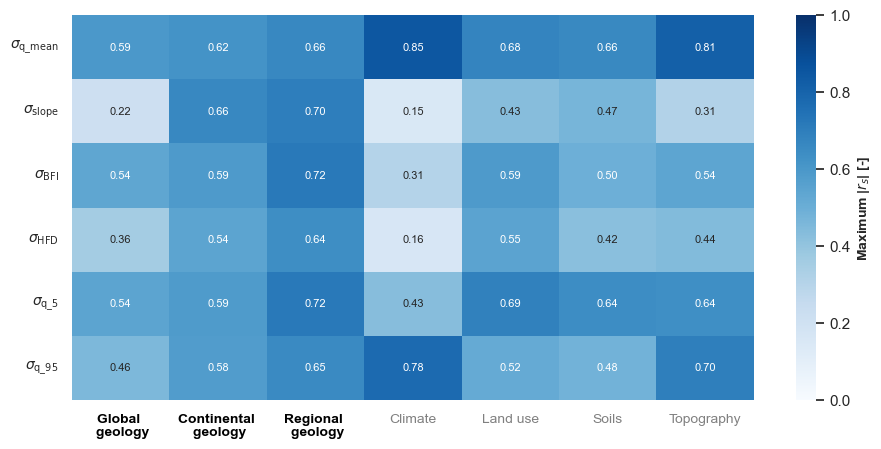

In [100]:
# Set font properties using rcParams
plt.rcParams['font.family'] = "sans-serif" #'helvetica'  # Change the font family
plt.rcParams['font.size'] = 8         # Change the font size
plt.rcParams['font.weight'] = 'normal'  # Change font weight (e.g., 'bold', 'normal')
plt.rcParams['axes.labelweight'] = 'bold'  # Change label font weight (e.g., 'bold', 'normal')


corr_max_group_dfs_red = corr_max_group_dfs.loc[:, ["q_mean", "slope_sawicz", "baseflow_index", 
                                                         "hfd_mean", "q_5", "q_95"]]

# Assuming corr_max_group_dfs is your DataFrame and it already contains the required data
# Create custom x labels
custom_x_labels = [ "Global \n geology", "Continental \n geology", "Regional \n geology", "Climate", "Land use", 
                   "Soils", "Topography"]  # Replace with your labels
# Create custom y labels (adjust based on your data)
custom_y_labels = ['$\sigma_{\mathrm{q\_mean}}$',  
                   '$\sigma_{\mathrm{slope}}$', '$\sigma_{\mathrm{BFI}}$', '$\sigma_{\mathrm{HFD}}$', 
                   '$\sigma_{\mathrm{q\_5}}$', '$\sigma_{\mathrm{q\_95}}$']

corr_max_group_dfs_abs = corr_max_group_dfs_red.abs()
# Plot the heatmap
fig = plt.figure(figsize=(11, 5))
ax = sns.heatmap(corr_max_group_dfs_abs.T, annot=True, cmap='Blues', fmt=".2f", vmin=0, vmax=1, alpha=1)

# Set custom x labels
ax.set_xticklabels(custom_x_labels, rotation=0, ha='center', fontsize=10, fontweight='bold')  # Adjust rotation and alignment as needed
# Set custom y labels
ax.set_yticklabels(custom_y_labels, rotation=0, ha='right', fontsize=10, fontweight='bold')  # Adjust rotation and alignment as needed

# Set custom x labels with different styles
for i, label in enumerate(ax.get_xticklabels()):
    if i < 3:  # First three labels
        label.set_color('black')
        label.set_fontweight('bold')
    else:  # The rest of the labels
        label.set_color('gray')
        label.set_fontweight('normal')

for label in ax.get_yticklabels():
    label.set_fontweight('bold')

# Customize the legend label
colorbar = ax.collections[0].colorbar
colorbar.set_label(r'Maximum |$r_s$| [-]', fontsize=10, fontweight='bold')

fig.align_ylabels()

#plt.title(f'Heatmap for {signature}')
plt.savefig(r'results/figs/figures/f06.png', dpi=300, bbox_inches='tight')

plt.show()

## Appendix C

### All 6 signatures

In [101]:
# Set global font properties
plt.rcParams.update({
    #'font.family': 'serif',            # Font family (e.g., 'sans-serif', 'serif', 'monospace')
    'font.size': 8,                  # Default font size
    'axes.titlesize': 8,             # Title font size
    'axes.labelsize': 8,             # Axis label font size
    'xtick.labelsize': 8,            # X-axis tick label font size
    'ytick.labelsize': 8,            # Y-axis tick label font size
    'legend.fontsize': 8,            # Legend font size
    'figure.titlesize': 6  ,          # Figure title font size
    'axes.titleweight': 'regular',        # Make only axis titles bold
    'font.weight': 'regular'           # Regular font for all other text
})

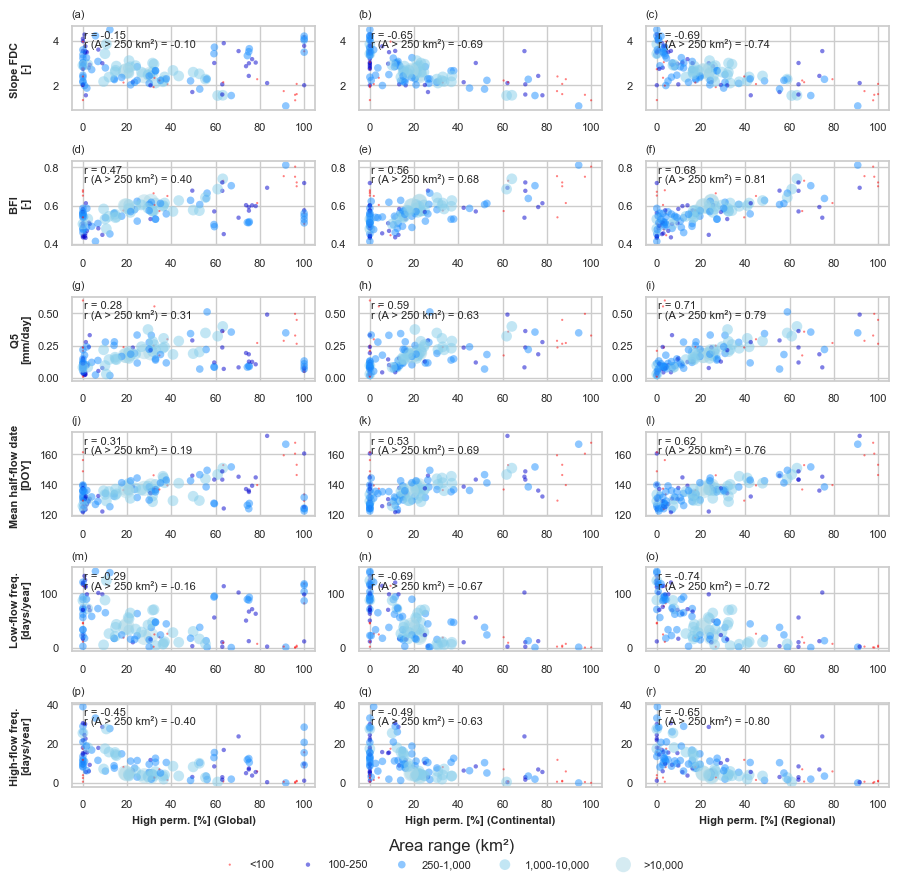

In [102]:
estreams_attributes_dfs_cat["end_date"] = estreams_attributes["end_date"] 
df = estreams_attributes_dfs["DEBU1959"]

df = estreams_attributes_dfs["DEBU1959"]
df = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date >= "2009"]

# Assuming df is your DataFrame and it already contains the required columns
y_cols = ["perm_high_glob", "perm_high_cont", "perm_high_regi"]
x_cols = ["slope_sawicz", "baseflow_index", "q_5", "hfd_mean", "lq_freq", "hq_freq"]
size_col = "area_estreams"

# Define size classes, corresponding sizes, and colors for the scatter plot
def get_size_color(area):
    if area < 100:
        return 2.5, 'red'  # Dark Blue
    elif 100 <= area < 250:
        return 10, '#0000CD'  # Medium Blue
    elif 250 <= area < 1000:
        return 30, '#1E90FF'  # Dodger Blue
    elif 1000 <= area < 10000:
        return 60, '#87CEEB'  # Sky Blue
    else:
        return 120, '#ADD8E6'  # Light Blue

# Apply the get_size_color function to the size_col to create new columns for sizes and colors
df['scaled_size'], df['color'] = zip(*df[size_col].apply(get_size_color))

# Filter data with area > 250
df_filtered = df[df[size_col] > 250]

# Apply the get_size_color function to the size_col to create new columns for sizes and colors for the filtered data
df_filtered['scaled_size'], df_filtered['color'] = zip(*df_filtered[size_col].apply(get_size_color))

# Custom labels for each subplot's x-axis
x_labels = ["High perm. [%] (Global)", "High perm. [%] (Continental)", "High perm. [%] (Regional)"]
y_labels = ["Slope FDC \n[-]", "BFI \n[-]", "Q5 \n[mm/day]", "Mean half-flow date \n[DOY]", "Low-flow freq.\n[days/year]", "High-flow freq. \n[days/year]"]

# Create the subplots
fig, axs = plt.subplots(len(y_labels), 3, figsize=(9, 1.4*len(y_labels)))

k = 0
for j, x_col in enumerate(x_cols):
    # Loop through the y_cols to create each subplot
    for i, y_col in enumerate(y_cols):
        ax = axs[j, i]
        ax.scatter(df[y_col], df[x_col], s=df['scaled_size'], alpha=0.5, c=df['color'], edgecolors='none')
        #ax.set_xlabel(x_labels[i])
        if i == 0:
            ax.set_ylabel(y_labels[j])

        if j == len(y_labels) - 1:
            ax.set_xlabel(x_labels[i])

        ax.set_title(f"({chr(97 + k)})", loc="left")  # chr(97) is 'a', chr(98) is 'b', etc.
        

        # Drop NaNs and calculate Spearman correlation coefficient for all data
        non_nan_data_all = df[[y_col, x_col]].dropna()
        corr_coef_all, _ = spearmanr(non_nan_data_all[y_col], non_nan_data_all[x_col])
        
        # Drop NaNs and calculate Spearman correlation coefficient for filtered data
        non_nan_data_filtered = df_filtered[[y_col, x_col]].dropna()
        corr_coef_filtered, _ = spearmanr(non_nan_data_filtered[y_col], non_nan_data_filtered[x_col])
        
        ax.text(0.05, 0.95, f'r = {corr_coef_all:.2f}', transform=ax.transAxes, verticalalignment='top')
        ax.text(0.05, 0.85, f'r (A > 250 km²) = {corr_coef_filtered:.2f}', transform=ax.transAxes, verticalalignment='top')
        
        # Set y-axis limits
        #ax.set_ylim(0, 5)
        k = k + 1


# Create custom legend handles
handles = [
    plt.scatter([], [], s=2.5, color='red', alpha=0.5, label='<100', edgecolors='none'),
    plt.scatter([], [], s=10, color='#0000CD', alpha=0.5, label='100-250', edgecolors='none'),
    plt.scatter([], [], s=30, color='#1E90FF', alpha=0.5, label='250-1,000', edgecolors='none'),
    plt.scatter([], [], s=60, color='#87CEEB', alpha=0.5, label='1,000-10,000', edgecolors='none'),
    plt.scatter([], [], s=120, color='#ADD8E6', alpha=0.5, label='>10,000', edgecolors='none')
]

# Add the legend below the figure
fig.legend(handles=handles, title='Area range (km²)', loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.05), frameon=False)


plt.tight_layout()
fig.align_ylabels()

# Display the plot
plt.show()
#fig.savefig(r'results\figs\fig_paper_combined_scatter.png', dpi=300, bbox_inches='tight')


### Only slope, BFI and Q5

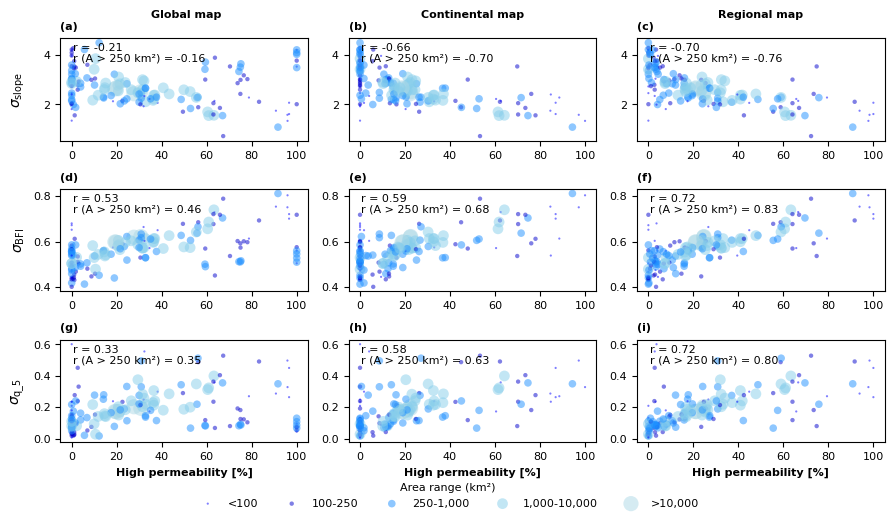

In [103]:
# Load the world shapefile dataset provided by GeoPandas
sns.reset_defaults()      # resets Seaborn style
plt.rcdefaults()          # resets Matplotlib defaults


# Set global font properties
plt.rcParams.update({
    'font.family': 'sans-serif',            # Font family (e.g., 'sans-serif', 'serif', 'monospace')
    'font.size': 8,                  # Default font size
    'axes.titlesize': 8,             # Title font size
    'axes.labelsize': 8,             # Axis label font size
    'xtick.labelsize': 8,            # X-axis tick label font size
    'ytick.labelsize': 8,            # Y-axis tick label font size
    'legend.fontsize': 8,            # Legend font size
    'figure.titlesize': 6  ,          # Figure title font size
#    'axes.titleweight': 'regular',        # Make only axis titles bold
#    'font.weight': 'regular'           # Regular font for all other text
})

estreams_attributes_dfs_cat["end_date"] = estreams_attributes["end_date"] 
estreams_attributes_dfs_cat["area_estreams"] = estreams_attributes["area_estreams"] 
df = estreams_attributes_dfs["DEBU1959"]
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import spearmanr


df = estreams_attributes_dfs["DEBU1959"]
df = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date >= "1900"]
df=df[df.slope_sawicz < 9]
# Assuming df is your DataFrame and it already contains the required columns
y_cols = ["perm_high_glob", "perm_high_cont", "perm_high_regi"]
x_cols = ["slope_sawicz", "baseflow_index", "q_5"]
size_col = "area_estreams"

# Define size classes, corresponding sizes, and colors for the scatter plot
def get_size_color(area):
    if area < 100:
        return 2.5, 'blue'  # Dark Blue
    elif 100 <= area < 250:
        return 10, '#0000CD'  # Medium Blue
    elif 250 <= area < 1000:
        return 30, '#1E90FF'  # Dodger Blue
    elif 1000 <= area < 10000:
        return 60, '#87CEEB'  # Sky Blue
    else:
        return 120, '#ADD8E6'  # Light Blue

# Apply the get_size_color function to the size_col to create new columns for sizes and colors
df['scaled_size'], df['color'] = zip(*df[size_col].apply(get_size_color))

# Filter data with area > 250
df_filtered = df[df[size_col] > 250]

# Apply the get_size_color function to the size_col to create new columns for sizes and colors for the filtered data
df_filtered['scaled_size'], df_filtered['color'] = zip(*df_filtered[size_col].apply(get_size_color))

# Custom labels for each subplot's x-axis
x_labels = ["High permeability [%]", "High permeability [%]", "High permeability [%]"]
y_labels = ["$\sigma_{\mathrm{slope}}$", "$\sigma_{\mathrm{BFI}}$", "$\sigma_{\mathrm{q\_5}}$"]



# Create the subplots
fig, axs = plt.subplots(len(y_labels), 3, figsize=(9, 1.6*len(y_labels)))

k = 0
for j, x_col in enumerate(x_cols):
    # Loop through the y_cols to create each subplot
    for i, y_col in enumerate(y_cols):
        ax = axs[j, i]
        ax.scatter(df[y_col], df[x_col], s=df['scaled_size'], alpha=0.5, c=df['color'], edgecolors='none')
        #ax.set_xlabel(x_labels[i])
        if i == 0:
            ax.set_ylabel(y_labels[j], fontsize=10, fontweight="bold")

        if j == len(y_labels) - 1:
            ax.set_xlabel(x_labels[i], fontweight="bold")

        ax.set_title(f"({chr(97 + k)})", loc="left", fontweight="bold")  # chr(97) is 'a', chr(98) is 'b', etc.
        

        # Drop NaNs and calculate Spearman correlation coefficient for all data
        non_nan_data_all = df[[y_col, x_col]].dropna()
        corr_coef_all, _ = spearmanr(non_nan_data_all[y_col], non_nan_data_all[x_col])
        
        # Drop NaNs and calculate Spearman correlation coefficient for filtered data
        non_nan_data_filtered = df_filtered[[y_col, x_col]].dropna()
        corr_coef_filtered, _ = spearmanr(non_nan_data_filtered[y_col], non_nan_data_filtered[x_col])
        
        ax.text(0.05, 0.95, f'r = {corr_coef_all:.2f}', transform=ax.transAxes, verticalalignment='top')
        ax.text(0.05, 0.85, f'r (A > 250 km²) = {corr_coef_filtered:.2f}', transform=ax.transAxes, verticalalignment='top')
        
        # Set y-axis limits
        #ax.set_ylim(0, 5)
        k = k + 1


# Create custom legend handles
handles = [
    plt.scatter([], [], s=2.5, color='blue', alpha=0.5, label='<100', edgecolors='none'),
    plt.scatter([], [], s=10, color='#0000CD', alpha=0.5, label='100-250', edgecolors='none'),
    plt.scatter([], [], s=30, color='#1E90FF', alpha=0.5, label='250-1,000', edgecolors='none'),
    plt.scatter([], [], s=60, color='#87CEEB', alpha=0.5, label='1,000-10,000', edgecolors='none'),
    plt.scatter([], [], s=120, color='#ADD8E6', alpha=0.5, label='>10,000', edgecolors='none')
]

# Add the legend below the figure
fig.legend(handles=handles, title='Area range (km²)', loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.06), frameon=False)


fig.text(0.17, 1.0, 'Global map', verticalalignment='top', fontweight="bold")
fig.text(0.47, 1.0, 'Continental map', verticalalignment='top', fontweight="bold")
fig.text(0.8, 1.0, 'Regional map', verticalalignment='top', fontweight="bold")

plt.tight_layout()
fig.align_ylabels()

# Display the plot
plt.show()
fig.savefig(r'results/figs/figures/appendixfb01.png', dpi=300, bbox_inches='tight')


### Only BFI

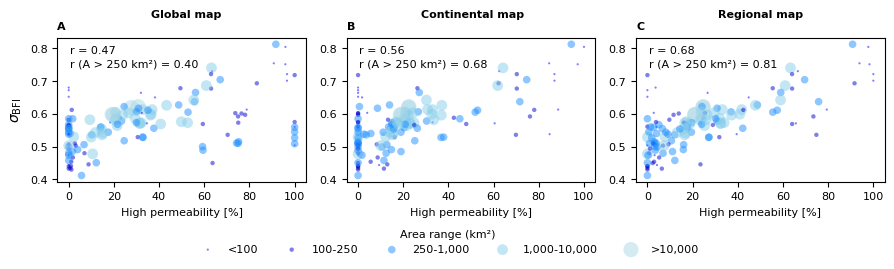

In [104]:
df = estreams_attributes_dfs["DEBU1959"]
df = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date >= "2009"]

# Assuming df is your DataFrame and it already contains the required columns
y_cols = ["perm_high_glob", "perm_high_cont", "perm_high_regi"]
x_cols = ["baseflow_index"]
size_col = "area_estreams"

# Define size classes, corresponding sizes, and colors for the scatter plot
def get_size_color(area):
    if area < 100:
        return 2.5, 'blue'  # Dark Blue
    elif 100 <= area < 250:
        return 10, '#0000CD'  # Medium Blue
    elif 250 <= area < 1000:
        return 30, '#1E90FF'  # Dodger Blue
    elif 1000 <= area < 10000:
        return 60, '#87CEEB'  # Sky Blue
    else:
        return 120, '#ADD8E6'  # Light Blue

# Apply the get_size_color function to the size_col to create new columns for sizes and colors
df['scaled_size'], df['color'] = zip(*df[size_col].apply(get_size_color))

# Filter data with area > 250
df_filtered = df[df[size_col] > 250]

# Apply the get_size_color function to the size_col to create new columns for sizes and colors for the filtered data
df_filtered['scaled_size'], df_filtered['color'] = zip(*df_filtered[size_col].apply(get_size_color))

# Custom labels for each subplot's x-axis
x_labels = ["High permeability [%]", "High permeability [%]", "High permeability [%]"]
y_labels = ["$\sigma_{\mathrm{BFI}}$"]



# Create the subplots
fig, axs = plt.subplots(len(y_labels), 3, figsize=(9, 2.2*len(y_labels)))
axs = np.atleast_2d(axs)

k = 0
for j, x_col in enumerate(x_cols):
    # Loop through the y_cols to create each subplot
    for i, y_col in enumerate(y_cols):
        ax = axs[j, i]
        ax.scatter(df[y_col], df[x_col], s=df['scaled_size'], alpha=0.5, c=df['color'], edgecolors='none')
        #ax.set_xlabel(x_labels[i])
        if i == 0:
            ax.set_ylabel(y_labels[j], fontsize=10)

        if j == len(y_labels) - 1:
            ax.set_xlabel(x_labels[i])

        ax.set_title(f"{chr(65 + k)}", loc="left", fontweight="bold")  # chr(97) is 'a', chr(98) is 'b', etc.
        

        # Drop NaNs and calculate Spearman correlation coefficient for all data
        non_nan_data_all = df[[y_col, x_col]].dropna()
        corr_coef_all, _ = spearmanr(non_nan_data_all[y_col], non_nan_data_all[x_col])
        
        # Drop NaNs and calculate Spearman correlation coefficient for filtered data
        non_nan_data_filtered = df_filtered[[y_col, x_col]].dropna()
        corr_coef_filtered, _ = spearmanr(non_nan_data_filtered[y_col], non_nan_data_filtered[x_col])
        
        ax.text(0.05, 0.95, f'r = {corr_coef_all:.2f}', transform=ax.transAxes, verticalalignment='top')
        ax.text(0.05, 0.85, f'r (A > 250 km²) = {corr_coef_filtered:.2f}', transform=ax.transAxes, verticalalignment='top')
        
        # Set y-axis limits
        #ax.set_ylim(0, 5)
        k = k + 1


# Create custom legend handles
handles = [
    plt.scatter([], [], s=2.5, color='blue', alpha=0.5, label='<100', edgecolors='none'),
    plt.scatter([], [], s=10, color='#0000CD', alpha=0.5, label='100-250', edgecolors='none'),
    plt.scatter([], [], s=30, color='#1E90FF', alpha=0.5, label='250-1,000', edgecolors='none'),
    plt.scatter([], [], s=60, color='#87CEEB', alpha=0.5, label='1,000-10,000', edgecolors='none'),
    plt.scatter([], [], s=120, color='#ADD8E6', alpha=0.5, label='>10,000', edgecolors='none')
]

# Add the legend below the figure
fig.legend(handles=handles, title='Area range (km²)', loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.16), frameon=False)


fig.text(0.17, 1.0, 'Global map', verticalalignment='top', fontweight="bold")
fig.text(0.47, 1.0, 'Continental map', verticalalignment='top', fontweight="bold")
fig.text(0.8, 1.0, 'Regional map', verticalalignment='top', fontweight="bold")

plt.tight_layout()
fig.align_ylabels()

# Display the plot
plt.show()
#fig.savefig(r'results\figs\fig_paper_combined_scatter_BFIonly.png', dpi=300, bbox_inches='tight')


# Small scale analysis: Moselle Subcatchments 

In [105]:
# Filter the catchments in Moselle
cats_moselle = estreams_attributes_dfs["DEBU1959"][estreams_attributes_dfs["DEBU1959"].end_date >= "1900"].index.tolist()
len(cats_moselle)

152

In [106]:
# Filter only the Moselle catchments
estreams_attributes_moselle = estreams_attributes.loc[cats_moselle, :]
estreams_attributes_moselle

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi
basin_id,,,,,,,,,,,,,,,,,,,,,
BEWA0066,99141002,Reuland,BE,BE_SPW,Our,6.151802,50.188258,6.151802,50.188258,NaN,...,0.00,0.00,7.497,1.400,3.429,16.0,2.947531,0.000000,3.319025,93.733444
BEWA0067,99261002,Schoenberg,BE,BE_SPW,Our,6.263467,50.289277,6.263467,50.289277,NaN,...,0.00,0.00,8.920,0.000,0.075,8.0,2.347625,0.000000,0.000000,97.652375
BEWA0087,56100000,Martelange,BE,BE_SPW,Sure,5.739269,49.833704,5.739269,49.833704,NaN,...,0.00,0.00,6.106,0.000,0.000,6.0,0.005000,0.000000,0.000000,99.995000
BEWA0106,60800000,Reuland,BE,BE_SPW,Ulf,6.150669,50.196522,6.150669,50.196522,NaN,...,0.00,0.00,7.096,1.200,2.427,9.0,0.000000,0.000000,0.000000,100.000000
BEWA0107,60900000,Lommersweiler,BE,BE_SPW,Braunlauf,6.153292,50.235014,6.153955,50.234494,NaN,...,0.00,0.00,6.996,0.200,0.605,6.0,3.999021,0.000000,15.492765,80.508214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,34,Michelau,LU,LU_CONTACTFORM,Sure,6.091178,49.895421,6.091178,49.895421,NaN,...,1.80,62.62,5.680,0.045,0.045,25.0,1.917023,0.000000,0.000000,98.082977
LU000016,3,Pfaffenthal,LU,LU_CONTACTFORM,Alzette,6.132266,49.620647,6.132266,49.620647,NaN,...,0.00,0.00,2.863,0.004,0.009,15.0,14.327884,32.255374,53.416742,0.000000
LU000017,16,Rosport,LU,LU_CONTACTFORM,Sure,6.509851,49.785883,6.509851,49.785883,NaN,...,2.67,67.85,4.753,1.641,4.770,78.0,18.753136,5.872553,24.977481,50.396831


In [107]:
# First we filter the potential watersheds:
list_cats_moselle = estreams_attributes_moselle[estreams_attributes_moselle.gauges_upstream <= 60][estreams_attributes_moselle.gauges_upstream >= 10].sort_values(by='gauges_upstream', ascending=True)["gauges_upstream"].index.tolist()

# Here we filter the list of nested_catchments according to this first filter:
nested_cats_moselle_df = nested_catchments.loc[list_cats_moselle, :]

print("Number of catchemnts with potentially nested catchments:", len(list_cats_moselle))

Number of catchemnts with potentially nested catchments: 22


In [108]:
# Filter only the catchemnts using the function stated before (unique headwaters):
nested_cats_moselle_filtered = find_unique_nested_catchments(nested_cats_moselle_df)
print(nested_cats_moselle_filtered)

['FR003283', 'FR003249', 'FR000159', 'LU000017', 'DEBU1957']


In [109]:
# Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_moselle_df = nested_catchments.loc[nested_cats_moselle_filtered, :]

In [110]:
# Store the variables for the selected catchments in a list of dataframes:
estreams_attributes_headwaters_moselle_dfs = {}

for catchment in tqdm.tqdm(nested_cats_moselle_filtered):

    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_moselle_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes_moselle.index]

    cat_clip = estreams_attributes.loc[nested_clip, :]

    estreams_attributes_headwaters_moselle_dfs[catchment] = cat_clip

100%|██████████| 5/5 [00:00<00:00, 1188.19it/s]


In [111]:
# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens_moselle = pd.DataFrame(index = estreams_attributes_headwaters_moselle_dfs.keys())
for catchment, data in estreams_attributes_headwaters_moselle_dfs.items():
    catchment_lens_moselle.loc[catchment, "len"] = len(data)

In [112]:
# Create subplots
fig, axes = plt.subplots()
# Flatten the axes array

plot_watershed_groups_from_dict(estreams_attributes_used = estreams_attributes_headwaters_moselle_dfs, figsize=(8, 6), ax=axes, 
                      title_plot='List of headwater nested catchments selected', add_legend = True, size_symbol = 10, 
                               limits_europe = False)

In [113]:
# List of keys to filter
keys_to_filter = estreams_attributes_headwaters_moselle_dfs.keys()

# Initialize an empty list to store the DataFrames
filtered_dfs_list = []

# Iterate through the list of keys and append each DataFrame to the list
for key in keys_to_filter:
    if key in estreams_attributes_headwaters_moselle_dfs:
        df = estreams_attributes_headwaters_moselle_dfs[key].copy()  # Get the DataFrame
        df['key'] = key  # Add the key as a column to keep track of the original DataFrame
        filtered_dfs_list.append(df)

# Concatenate all DataFrames in the list into a single DataFrame
combined_df = pd.concat(filtered_dfs_list, ignore_index=True)
combined_df

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi,key
0,A812200001,A8122000,FR,FR_EAUFRANCE,L'Yron à Hannonville-Suzémont,5.837081,49.098776,5.837081,49.098776,197,...,3.61,2.131,0.070,0.040,2.0,0.000000,49.984663,50.015337,0.000000,FR003283
1,A818201001,A8182010,FR,FR_EAUFRANCE,L'Yron à Jarny [La Cartoucherie],5.862013,49.156008,5.862013,49.156008,187,...,3.61,2.226,0.274,0.137,4.0,0.000000,39.668363,60.331637,0.000000,FR003283
2,A802101001,L'Orne Ã Ã‰tain,FR,FR_EAUFRANCE,L'Orne à Étain,5.632484,49.213610,5.632484,49.213610,199,...,1.10,2.101,0.089,0.032,1.0,0.000000,28.814132,71.185868,0.000000,FR003283
3,A807101001,L'Orne Ã Boncourt,FR,FR_EAUFRANCE,L'Orne à Boncourt,5.830467,49.162566,5.830467,49.162566,185,...,1.40,2.060,0.638,0.190,3.0,0.000000,30.090776,69.909224,0.000000,FR003283
4,A812020101,L'Yron Ã Jarny [Droitaumont],FR,FR_EAUFRANCE,L'Yron à Jarny [Droitaumont],5.876081,49.142330,5.876081,49.142330,188,...,3.61,2.167,0.083,0.065,2.0,0.000000,57.507079,42.492921,0.000000,FR003283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,A961205050,La Bisten Ã Creutzwald,FR,FR_EAUFRANCE,La Bisten à Creutzwald,6.688894,49.225799,6.688894,49.225799,201,...,0.50,2.452,0.000,0.000,2.0,93.860251,2.539723,3.600025,0.000000,DEBU1957
117,A986201001,La Nied Allemande Ã Varize,FR,FR_EAUFRANCE,La Nied Allemande à Varize,6.446071,49.142442,6.446071,49.142442,204,...,1.62,2.903,0.040,0.052,4.0,4.353730,46.021991,49.624279,0.000000,DEBU1957
118,A994202001,La Nied Ã Bouzonville et Ã Filstroff,FR,FR_EAUFRANCE,La Nied à Bouzonville et à Filstroff,6.545267,49.324381,6.545267,49.324381,189,...,4.50,2.726,0.117,0.157,8.0,7.308442,32.066428,60.625131,0.000000,DEBU1957
119,A994202002,La Nied Ã Bouzonville et Ã Filstroff,FR,FR_EAUFRANCE,La Nied à Bouzonville et à Filstroff,6.539043,49.301285,6.539043,49.301285,189,...,4.50,2.727,0.117,0.157,8.0,7.432438,32.248834,60.318727,0.000000,DEBU1957


In [114]:
for outlet in estreams_attributes_headwaters_moselle_dfs.keys():
    print(outlet)
    print(estreams_attributes.loc[outlet, "area_estreams"])
    print(len(estreams_attributes_headwaters_moselle_dfs[outlet]))

FR003283
1241.962
9
FR003249
3396.832
25
FR000159
2882.865
23
LU000017
4255.524
32
DEBU1957
6970.0
32


## Figure 8: Heatmaps for the 5 Moselle sub-catchments

In [115]:
# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict_hw_moselle = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in estreams_attributes_headwaters_moselle_dfs.keys():

        estreams_attributes_dfs_cat = estreams_attributes_headwaters_moselle_dfs[catchment]
        
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep', 
       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       "perm_verylow_regi", "perm_low_regi", "perm_medium_regi", "perm_high_regi",
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict_hw_moselle[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict_hw_moselle.keys())

100%|██████████| 14/14 [00:00<00:00, 77.69it/s]

dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


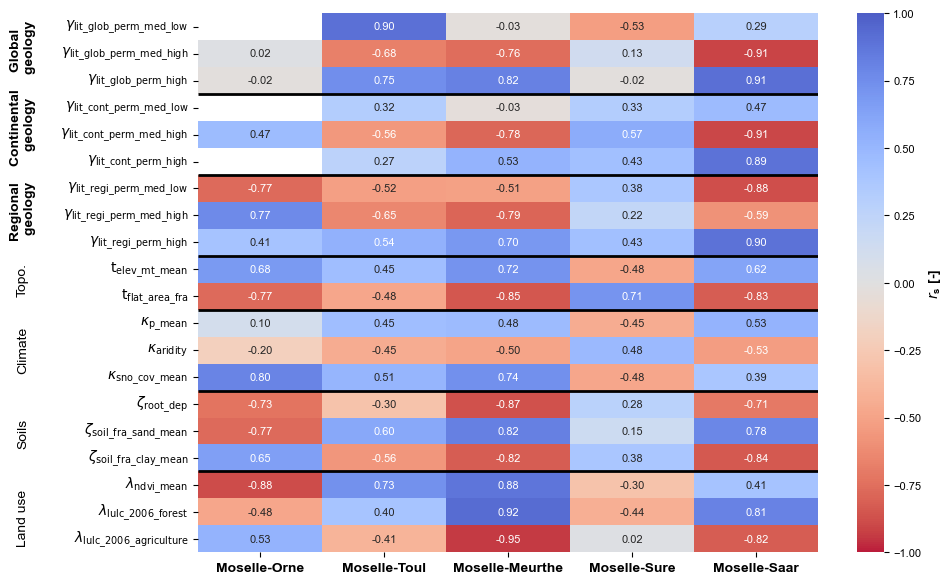

In [117]:
plt.rcParams.update({
    'font.size': 8,             # Base font size
    'axes.titlesize': 8,        # Axis title size
    'axes.labelsize': 10,        # Axis label size
    'xtick.labelsize': 8,       # X tick size
    'ytick.labelsize': 8,       # Y tick size
    'legend.fontsize': 8,       # Legend size
    'figure.titlesize': 10       # Figure title (if used)
})

# baseflow_index correlations:
signature = "baseflow_index"

y_labels = ["$\gamma_{\mathrm{lit\_glob\_perm\_med\_low}}$", "$\gamma_{\mathrm{lit\_glob\_perm\_med\_high}}$", "$\gamma_{\mathrm{lit\_glob\_perm\_high}}$",
            "$\gamma_{\mathrm{lit\_cont\_perm\_med\_low}}$", "$\gamma_{\mathrm{lit\_cont\_perm\_med\_high}}$", "$\gamma_{\mathrm{lit\_cont\_perm\_high}}$",
            "$\gamma_{\mathrm{lit\_regi\_perm\_med\_low}}$", "$\gamma_{\mathrm{lit\_regi\_perm\_med\_high}}$", "$\gamma_{\mathrm{lit\_regi\_perm\_high}}$",
            "$\mathrm{t}_{\mathrm{elev\_mt\_mean}}$", 
            "$\mathrm{t}_{\mathrm{flat\_area\_fra}}$",
            "$\kappa_{\mathrm{p\_mean}}$","$\kappa_{\mathrm{aridity}}$",   
            "$\kappa_{\mathrm{sno\_cov\_mean}}$", 
            "$\zeta_{\mathrm{root\_dep}}$", "$\zeta_{\mathrm{soil\_fra\_sand\_mean}}$", "$\zeta_{\mathrm{soil\_fra\_clay\_mean}}$", 
            "$\lambda_{\mathrm{ndvi\_mean}}$", "$\lambda_{\mathrm{lulc\_2006\_forest}}$", "$\lambda_{\mathrm{lulc\_2006\_agriculture}}$" 
            ]

# Desired order of indices
desired_order = ['perm_low_glob', 'perm_medium_glob', 'perm_high_glob',
                 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
                 'perm_low_regi','perm_medium_regi', 'perm_high_regi',
                 
                 'ele_mt_mean', 
                 'flat_area_fra', 
                 'p_mean','aridity',  'sno_cov_mean', 
                 'root_dep_mean', 'soil_fra_sand_mean', 'soil_fra_clay_mean', 
                 'ndvi_mean', 'lulc_2006_forest', 'lulc_2006_agriculture', 

                 ]

# Correlation DataFrame (assuming this is already prepared)
correlation_df = correlation_dict_hw_moselle[signature].loc[desired_order, :]

# Plot the heatmap
plt.figure(figsize=(10, 7))
ax = sns.heatmap(correlation_df, annot=True, cmap='coolwarm_r', fmt=".2f", vmin=-1, vmax=1, alpha=0.9)

labels_x = ["Moselle-Orne", "Moselle-Toul", "Moselle-Meurthe", "Moselle-Sure", "Moselle-Saar"]
# Set the x and y tick labels
ax.set_xticklabels(labels_x, rotation=0, ha='center', fontsize=10, fontweight="bold")
ax.set_yticklabels(y_labels, rotation=0, ha='right', fontsize=12)

# Customize the colorbar
colorbar = ax.collections[0].colorbar
colorbar.set_label('$r_{\mathregular{s}}$ [-]', fontsize=10)

# Set custom colors for specific labels
for label in ax.get_yticklabels():
    text = label.get_text()
    if 'global' in text:
        label.set_color('black')  # Color for 'global'
        label.set_fontweight('normal')  # Bold for 'global'

    elif 'euro' in text:
        label.set_color('black')  # Color for 'euro'
        label.set_fontweight('normal')  # Bold for 'global'

    elif 'country' in text:
        label.set_color('black')  # Color for 'country'
        label.set_fontweight('bold')  # Bold for 'global'


# Ensure y-labels are set before applying styles
ax.set_yticklabels(y_labels, rotation=0, ha='right', fontsize=10)

# Apply bold to the first six rows explicitly
for i, label in enumerate(ax.get_yticklabels()):
    if i < 6:  # First 6 rows
        label.set_fontweight('bold')



# Adding text outside the plot for section titles
plt.text(-0.05, 0.83, 'Global \n geology', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="bold")
plt.text(-0.05, 0.72, 'Continental \n geology', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="bold")
plt.text(-0.05, 0.60, 'Regional \n geology', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="bold")
plt.text(-0.05, 0.50, 'Topo.', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="normal")
plt.text(-0.05, 0.40, 'Climate', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="normal")
plt.text(-0.05, 0.28, 'Soils', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="normal")
plt.text(-0.05, 0.16, 'Land use', va='center', ha='center', rotation=90, fontsize=10, transform=plt.gcf().transFigure, fontweight="normal")

# Add horizontal lines to divide the groups visually
ax.hlines([3, 6, 9, 11, 14, 17], *ax.get_xlim(), colors='black', linewidth=2, linestyles='-')

# Save the figure
plt.savefig(r'results/figs/figures/f07.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

## Supporting information: Boxplots for sub-catchments

In [118]:
def plot_boxplots_for_columns(data_dict, columns, n_cols=5):
    """
    Plots boxplots for a list of columns against multiple DataFrames.

    Parameters:
    data_dict (dict): Dictionary containing DataFrames.
    columns (list of str): List of column names to create boxplots for.
    n_cols (int, optional): Number of columns in the subplot grid. Default is 5.
    """
    n_rows = (len(columns) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 6 * n_rows))

    for idx, column in enumerate(columns):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]
        
        combined_df = pd.concat(
            [df[[column]].assign(DataFrame=name) for name, df in data_dict.items()],
            axis=0
        )

        sns.boxplot(x='DataFrame', y=column, data=combined_df, ax=ax)
        ax.set_xlabel('DataFrame')
        ax.set_ylabel(column)
        ax.set_title(f'Boxplot of {column}')
    
    # Remove empty subplots
    for idx in range(len(columns), n_rows * n_cols):
        fig.delaxes(axes.flatten()[idx])
        
    plt.tight_layout()
    plt.show()

In [119]:
for key, df in estreams_attributes_headwaters_moselle_dfs.items():
    df['range_elev'] = df['ele_mt_max'] - df['ele_mt_min']
    df['perm_low'] = df['perm_low_regi'] + df['perm_verylow_regi']
    df['perm_high'] = df['perm_medium_regi'] + df['perm_high_regi']

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# List of columns to plot
columns = ["q_mean", "p_mean",  "frac_snow", "ele_mt_mean",
           "slope_sawicz", "range_elev", "soil_fra_silt_mean", "root_dep_mean", 
           'baseflow_index', "lulc_2006_forest", "lulc_2006_Agric", "perm_high"]





# Define custom y-labels for each plot (you can customize this list)
y_labels = ["$\sigma_{\mathrm{q\_mean}}$ \n [mm/day]", "$\kappa_{\mathrm{p\_mean}}$ \n [mm/day]", "$\kappa_{\mathrm{frac\_snow}}$ \n [-]", "$\mathrm{t}_{\mathrm{elev\_mt\_mean}}$ \n [m]",
            "$\sigma_{\mathrm{slope}}$ \n [-]", "$\mathrm{t}_{\mathrm{elev\_mt\_max}}$ \n - \n $\mathrm{t}_{\mathrm{elev\_mt\_min}}$ \n [m]", "$\zeta_{\mathrm{soil\_fra\_silt\_mean}}$ \n [%]", "$\zeta_{\mathrm{root\_dep_mean}}$ \n [cm]",
            "$\sigma_{\mathrm{BFI}}$ \n [-]", "$\lambda_{\mathrm{lulc\_2006\_forest}}$ \n [%]", "$\lambda_{\mathrm{lulc\_2006\_agric}}$ \n [%]", "$\gamma_{\mathrm{lit\_cont\_perm\_high}}$ \n + \n $\gamma_{\mathrm{lit\_cont\_perm\_med\_hig}}$\n [%]"
            ]

# Number of columns in the grid
n_cols = 4
data_dict = estreams_attributes_headwaters_moselle_dfs

# Number of rows and columns for subplots
n_rows = (len(columns) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 4))

# Define custom colors for each DataFrame
custom_colors = {
    'FR003283': 'lightgray',
    'FR003249': 'lavender',
    'FR000159': 'lightsteelblue',
    'LU000017': 'cornflowerblue',
    "DEBU1957": "royalblue"
}

# Titles with (a), (b), (c), etc.
subplot_titles = [f"({chr(97 + i)})" for i in range(len(columns))]
# Set the properties for the outliers
flierprops = dict(marker='o', color='black', markersize=3)

for idx, column in enumerate(columns):
    row = idx // n_cols
    col = idx % n_cols
    ax = axes[row, col] if n_rows > 1 else axes[col]
    
    # Combine the DataFrames into one for plotting
    combined_df = pd.concat(
        [df[[column]].assign(DataFrame=name) for name, df in data_dict.items()],
        axis=0
    )

    # Create the boxplot with custom colors for each DataFrame
    sns.boxplot(x='DataFrame', y=column, data=combined_df, ax=ax, palette=custom_colors, linewidth=0.5,  # No edge colors
                flierprops=flierprops  # Set smaller outliers
               )
    
    ax.set_xticks('')
    ax.set_xlabel('')
    ax.set_ylabel(y_labels[idx])
    ax.set_title(subplot_titles[idx], loc="left")

# Remove any empty subplots
for idx in range(len(columns), n_rows * n_cols):
    fig.delaxes(axes.flatten()[idx])
custom_names = ["Moselle-Orne", "Moselle-Toul", "Moselle-Meurthe", "Moselle-Sure", "Moselle-Saar"]

# Create a custom legend
handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=color, markersize=10, label=name) 
        for name, color in zip(custom_names, custom_colors.values())]

# Add the legend below the plot, horizontal, in one single line
fig.legend(handles=handles, title='', loc='lower center', bbox_to_anchor=(0.5, -0.1), 
           ncol=len(custom_colors), frameon=False, prop={'weight': 'bold'})  # Set the title to bold

fig.align_ylabels()


fig.text(0.08, 0.01, 'Streamflow signatures', verticalalignment='top', fontweight="bold")
fig.text(0.6, 0.01, 'Catchment attributes', verticalalignment='top', fontweight="bold")

plt.tight_layout(rect=[0, 0.01, 1, 1])  # Adjust layout to make space for the legend


#fig.savefig(r'results\figs\fig_boxplots.png', dpi=300, bbox_inches='tight')


plt.show()


ValueError: 'locs' must be 1D with shape (N,), but your input has shape ()

## Supporting information: Different geology permeabilitites in the Moselle graphs

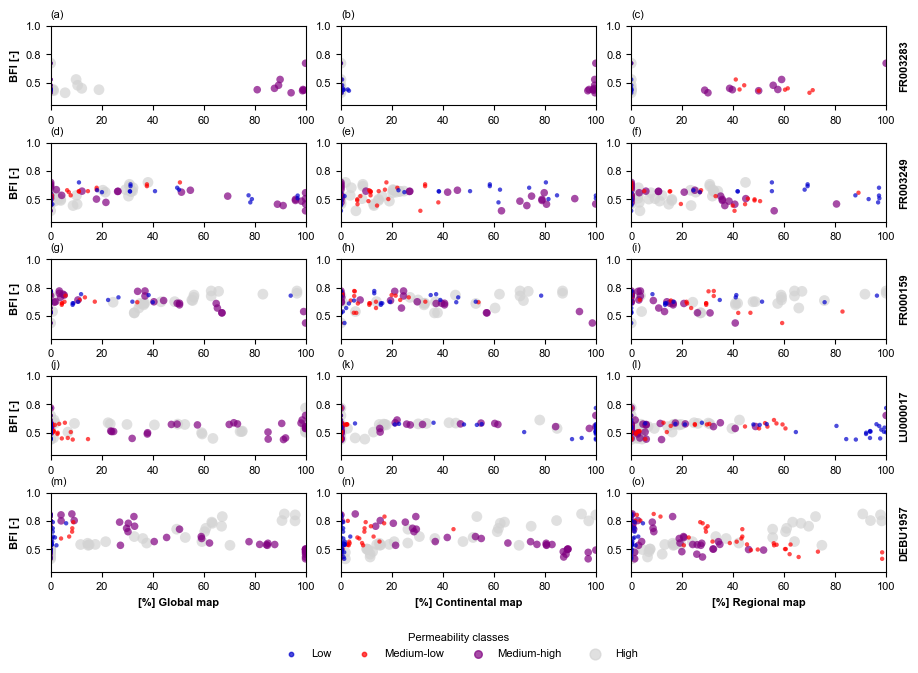

In [116]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import matplotlib.ticker as ticker

# Assuming df is your DataFrame and already contains the required columns
x_col = "baseflow_index"
y_cols_c = ['perm_high_regi', "perm_medium_regi", 'perm_low_regi', "perm_verylow_regi"]
y_cols_b = ['perm_high_cont', "perm_medium_cont", 'perm_low_cont', "perm_verylow_cont"]
y_cols_a = ["perm_high_glob", "perm_medium_glob", 'perm_low_glob', "perm_verylow_glob"]

# Define a mapping of columns to colors and sizes (keeping the previous colors and sizes)
category_colors = {
    "perm_high_regi": 'lightgray',
    "perm_medium_regi": 'purple',
    "perm_low_regi": 'red',
    "perm_verylow_regi": '#0000CD',
    "perm_medium_cont": 'purple',
    "perm_high_cont": 'lightgray',
    "perm_low_cont": 'red',
    "perm_verylow_cont": '#0000CD',
    "perm_high_glob": 'lightgray',
    "perm_medium_glob": 'purple',
    "perm_low_glob": 'red',
    "perm_verylow_glob": '#0000CD'
}

category_sizes = {
    "perm_high_regi": 60,
    "perm_medium_regi": 30,
    "perm_low_regi": 10,
    "perm_verylow_regi": 10,
    "perm_medium_cont": 30,
    "perm_high_cont": 60,
    "perm_low_cont": 10,
    "perm_verylow_cont": 10,
    "perm_high_glob": 60,
    "perm_medium_glob": 30,
    "perm_low_glob": 10,
    "perm_verylow_glob": 10
}

# Create the subplots (3 columns, 5 rows)
fig, axs = plt.subplots(5, 3, figsize=(9, 6))  # Adjust the figure size accordingly

# Adjust the layout to remove vertical spacing
plt.subplots_adjust(hspace=0, wspace=0)  # Set vertical space (hspace) to 0, adjust wspace as needed
# Define columns for each subplot
y_cols_list = [y_cols_a, y_cols_b, y_cols_c]
sub_basin_list = ["FR003283", "FR003249", "FR000159", "LU000017", "DEBU1957"]

j = 0
# Loop through the subplots and columns to create the scatter plots for each sub-basin
for row, sub_basin in enumerate(sub_basin_list):
    df = estreams_attributes_headwaters_moselle_dfs[sub_basin]
    for i, (ax, y_cols) in enumerate(zip(axs[row, :], y_cols_list)):
        for y_col in y_cols:
            ax.scatter(df[y_col], df[x_col], 
                       s=category_sizes[y_col], 
                       alpha=0.7, 
                       c=category_colors[y_col], 
                       edgecolors='none', 
                       label=y_col)
        
        ax.set_title(f"({chr(97 + j)})", loc="left", fontsize=8)
        j = j + 1 

        if i == 0:
            ax.set_ylabel('BFI [-]', fontsize=8)
            # Add vertical text outside the axes
        ax.set_ylim(0.3, 1)
        ax.set_xlim(0, 100)
        # Format the y-axis to display with one decimal place ('.1f')
        ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))


        if j >= 13:
            # Custom labels for each subplot's x-axis
            x_labels = ["[%] Global map", "[%] Continental map", "[%] Regional map"]
            ax.set_xlabel(x_labels[i])

    ax.text(1.05, 0.5, f'{sub_basin}', 
            transform=ax.transAxes, verticalalignment='center', fontsize=8, 
            rotation=90,  # Rotate the text vertically
            ha='left',
            fontweight='bold')  # Adjust the horizontal alignment to position it outside


# Add legend at the bottom
handles = [
    plt.scatter([], [], s=10, color='#0000CD', alpha=0.7, label='Low'),
    plt.scatter([], [], s=10, color='red', alpha=0.7, label='Medium-low'),
    plt.scatter([], [], s=30, color='purple', alpha=0.7, label='Medium-high'),
    plt.scatter([], [], s=60, color='lightgray', alpha=0.7, label='High')
]

fig.legend(handles=handles, title='Permeability classes', frameon=False, loc='lower center', 
           bbox_to_anchor=(0.5, -0.1), ncol=4)


# Adjust layout
plt.tight_layout(pad=0.1)

# Save the plot
#fig.savefig(r'results\figs\\fig_paper_scatter_geology_combined.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

## Figure 7 and supporting information: Maps with Colorfull histograms

In [121]:
# List of keys to filter
keys_to_filter = estreams_attributes_dfs.keys()

# Initialize an empty list to store the DataFrames
filtered_dfs_list = []

# Iterate through the list of keys and append each DataFrame to the list
for key in keys_to_filter:
    if key in estreams_attributes_dfs:
        df = estreams_attributes_dfs[key].copy()  # Get the DataFrame
        df['key'] = key  # Add the key as a column to keep track of the original DataFrame
        filtered_dfs_list.append(df)


# Concatenate all DataFrames in the list into a single DataFrame
combined_df = pd.concat(filtered_dfs_list, ignore_index=False)

network_estreams_filtered = combined_df.copy()
#network_estreams_filtered = network_estreams_filtered[network_estreams_filtered.end_date >= "2009"]
network_estreams_filtered

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi,key
basin_id,,,,,,,,,,,,,,,,,,,,,
BEWA0066,99141002,Reuland,BE,BE_SPW,Our,6.151802,50.188258,6.151802,50.188258,NaN,...,0.00,7.497,1.400,3.429,16.0,2.947531,0.000000,3.319025,93.733444,DEBU1959
BEWA0067,99261002,Schoenberg,BE,BE_SPW,Our,6.263467,50.289277,6.263467,50.289277,NaN,...,0.00,8.920,0.000,0.075,8.0,2.347625,0.000000,0.000000,97.652375,DEBU1959
BEWA0087,56100000,Martelange,BE,BE_SPW,Sure,5.739269,49.833704,5.739269,49.833704,NaN,...,0.00,6.106,0.000,0.000,6.0,0.005000,0.000000,0.000000,99.995000,DEBU1959
BEWA0106,60800000,Reuland,BE,BE_SPW,Ulf,6.150669,50.196522,6.150669,50.196522,NaN,...,0.00,7.096,1.200,2.427,9.0,0.000000,0.000000,0.000000,100.000000,DEBU1959
BEWA0107,60900000,Lommersweiler,BE,BE_SPW,Braunlauf,6.153292,50.235014,6.153955,50.234494,NaN,...,0.00,6.996,0.200,0.605,6.0,3.999021,0.000000,15.492765,80.508214,DEBU1959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LU000015,34,Michelau,LU,LU_CONTACTFORM,Sure,6.091178,49.895421,6.091178,49.895421,NaN,...,62.62,5.680,0.045,0.045,25.0,1.917023,0.000000,0.000000,98.082977,DEBU1959
LU000016,3,Pfaffenthal,LU,LU_CONTACTFORM,Alzette,6.132266,49.620647,6.132266,49.620647,NaN,...,0.00,2.863,0.004,0.009,15.0,14.327884,32.255374,53.416742,0.000000,DEBU1959
LU000017,16,Rosport,LU,LU_CONTACTFORM,Sure,6.509851,49.785883,6.509851,49.785883,NaN,...,67.85,4.753,1.641,4.770,78.0,18.753136,5.872553,24.977481,50.396831,DEBU1959


In [122]:
color_categories_range_df = network_estreams_filtered.copy()

# Defining the colour categories and mapping lists
color_categories_q_mean = [(color_categories_range_df.q_mean.min(), 0.5), (0.5, 1.0), (1.0, 1.5), (1.5, 2.0), (2.0, np.inf)]
color_categories_q_runoff_ratio = [(color_categories_range_df.q_runoff_ratio.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_q_elas_Sankarasubramanian = [(0.5, 1.0), (1.0, 1.5), (1.5, 2.0), (2.0, 2.5), (2.5, np.inf)]
color_categories_slope_sawicz = [(-np.inf, 1.5), (1.5, 2.0), (2.0, 2.5), (2.5, 3.0), (3.0, np.inf)]
color_categories_baseflow_index = [(0.4, 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8), (0.8, np.inf)]
color_categories_hfd_mean = [(color_categories_range_df.hfd_mean.min(), 130), (130, 140), (140, 150), (150, 160), (160, np.inf)]
color_categories_q_5 = [(color_categories_range_df.q_5.min(), 0.2), (0.2, 0.3), (0.3, 0.4), (0.4, 0.5), (0.5, np.inf)]
color_categories_q_95 = [(color_categories_range_df.q_95.min(), 2.0), (2.0, 4.0), (4.0, 6.0), (6.0, 8.0), (8.0, np.inf)]
color_categories_hq_freq = [(color_categories_range_df.hq_freq.min(), 10), (10, 15), (15, 20), (20, 25), (25, np.inf)]
color_categories_hq_dur = [(color_categories_range_df.hq_dur.min(), 2), (2, 3), (3, 4), (4, 5), (5, np.inf)]
color_categories_lq_freq = [(color_categories_range_df.lq_freq.min(), 25), (25, 50), (50, 75), (75, 100), (100, np.inf)]
color_categories_lq_dur = [(color_categories_range_df.lq_dur.min(), 5), (5, 10), (10, 15), (15, 20), (20, np.inf)]
color_categories_p_mean = [(color_categories_range_df.p_mean.min(), 2.5), (2.5, 3.0), (3, 3.5), (3.5, 4), (4, np.inf)]
color_categories_pet_mean = [(1.7, 1.8), (1.8, 1.9), (1.9, 2.0), (2.0, 2.1), (2.1, np.inf)]
color_categories_aridity = [(color_categories_range_df.aridity.min(), 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8), (0.8, np.inf)]
color_categories_p_seasonality = [(color_categories_range_df.p_seasonality.min(), -0.2), (-0.2, -0.1), (-0.1, 0), (0, 0.1), (0.1, np.inf)]
color_categories_frac_snow = [(color_categories_range_df.frac_snow.min(), 0.05), (0.05, 0.1), (0.1, 0.15), (0.15, 0.2), (0.2, np.inf)]
color_categories_hp_freq = [(color_categories_range_df.hp_freq.min(), 14), (14, 15), (15, 16), (16, 17), (17, np.inf)]
color_categories_hp_dur = [(color_categories_range_df.hp_dur.min(), 1.16), (1.16, 1.18), (1.18, 1.2), (1.2, 1.22), (1.22, np.inf)]
color_categories_lp_freq = [(color_categories_range_df.lp_freq.min(), 205), (205, 210), (210,215), (215, 220), (220, np.inf)]
color_categories_lp_dur = [(color_categories_range_df.lp_dur.min(), 3.7), (3.7, 3.8), (3.8, 3.9), (3.9, 4), (4, np.inf)]
color_categories_ele_mt_max = [(color_categories_range_df.ele_mt_max.min(), 1000), (1000, 2000), (2000, 3000), (3000, 4000), (4000, np.inf)]
color_categories_ele_mt_mean = [(color_categories_range_df.ele_mt_mean.min(), 300), (300, 400), (400, 500), (500, 600), (600, np.inf)]
color_categories_slp_dg_mean = [(color_categories_range_df.slp_dg_mean.min(), 5), (5, 7.5), (7.5, 10), (10, 12.5), (12.5, np.inf)]
color_categories_elon_ratio = [(color_categories_range_df.elon_ratio.min(), 0.5), (0.5, 0.6), (0.6, 0.7), (0.7, 0.8), (0.8, np.inf)]
color_categories_flat_area_fra = [(color_categories_range_df.flat_area_fra.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
color_categories_steep_area_fra = [(color_categories_range_df.steep_area_fra.min(), 10), (10, 25), (25, 40), (40, 55), (55, np.inf)]
color_categories_strm_dens = [(color_categories_range_df.strm_dens.min(), 0.1), (0.1, 0.125), (0.125, 0.15), (0.15, 0.175), (0.175, np.inf)]
color_categories_bedrk_dep = [(color_categories_range_df.bedrk_dep.min(), 1), (1, 1.5), (1.5, 2), (2, 2.5), (2.5, np.inf)]
#color_categories_perc_imp = [(color_categories_range_df.perc_imp.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perc_low_perm = [(color_categories_range_df.perc_low_perm.min(), 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]
#color_categories_perc_medium_perm = [(color_categories_range_df.perc_medium_perm.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perc_high_perm = [(color_categories_range_df.perc_high_perm.min(), 2.5), (2.5, 5), (5, 7.5), (7.5, 10), (10, np.inf)]
#
#color_categories_perm_high_euro = [(color_categories_range_df.perm_high_euro.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perm_medium_euro = [(color_categories_range_df.perm_medium_euro.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_perm_lower_euro = [(color_categories_range_df.perm_lower_euro.min(), 5), (5, 10), (10, 15), (15, 20), (20, np.inf)]
#color_categories_perm_impermeable_euro = [(color_categories_range_df.perm_impermeable_euro.min(), 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#
#color_categories_perm_mos_ff = [(-np.nan, 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_imper_mos_ff = [(-np.nan, 20), (20, 40), (40, 60), (60, 80), (80, np.inf)]
#color_categories_semiperm_mos_ff = [(-np.nan, 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]

color_categories_root_dep_mean = [(color_categories_range_df.root_dep_mean.min(), 80), (80, 90), (90, 100), (100, 110), (110, np.inf)]
color_categories_soil_tawc_mean = [(color_categories_range_df.soil_tawc_mean.min(), 45), (45, 47), (47, 49), (49, 52), (52, np.inf)]
color_categories_soil_fra_sand_mean = [(color_categories_range_df.soil_fra_sand_mean.min(), 30), (30, 40), (40, 50), (50, 60), (60, np.inf)]
color_categories_soil_fra_silt_mean = [(color_categories_range_df.soil_fra_silt_mean.min(), 15), (15, 20), (20, 25), (25, 30), (30, np.inf)]
color_categories_soil_fra_clay_mean = [(color_categories_range_df.soil_fra_clay_mean.min(), 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]
color_categories_soil_fra_grav_mean = [(color_categories_range_df.soil_fra_grav_mean.min(), 6), (6, 7), (7, 8), (8, 9), (9, np.inf)]
color_categories_soil_oc_mean = [(color_categories_range_df.soil_oc_mean.min(), 1), (1, 1.5), (1.5, 2), (2, 2.5), (2.5, np.inf)]
color_categories_lai_mean = [(color_categories_range_df.lai_mean.min(), 0.16), (0.16, 0.18), (0.18, 0.2), (0.2, 0.22), (0.22, np.inf)]
color_categories_ndvi_mean = [(color_categories_range_df.ndvi_mean.min(), 0.6), (0.6, 0.64), (0.64, 0.68), (0.68, 0.72), (0.72, np.inf)]
color_categories_lulc_2006_urban = [(color_categories_range_df.lulc_2006_urban.min(), 0.05), (0.05, 0.1), (0.1, 0.15), (0.15, 0.2), (0.2, np.inf)]
color_categories_lulc_2006_NonIrriAgri = [(color_categories_range_df.lulc_2006_NonIrriAgri.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_lulc_2006_Agric = [(color_categories_range_df.lulc_2006_Agric.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_lulc_2006_forest = [(color_categories_range_df.lulc_2006_forest.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_lulc_2006_grass = [(color_categories_range_df.lulc_2006_grass.min(), 0.05), (0.05, 0.075), (0.075, 0.1), (0.1, 0.125), (0.125, np.inf)]
color_categories_lulc_2006_agriculture = [(color_categories_range_df.lulc_2006_agriculture.min(), 0.2), (0.2, 0.4), (0.4, 0.6), (0.6, 0.8), (0.8, np.inf)]
color_categories_sno_cov_mean = [(color_categories_range_df.sno_cov_mean.min(), 3), (3, 5), (5, 7), (7, 9), (9, np.inf)]
color_categories_dam_num = [(color_categories_range_df.dam_num.min(), 0), (0, 1), (1, 2), (2, 3), (3, np.inf)]
color_categories_lakes_num = [(color_categories_range_df.lakes_num.min(), 0), (0, 1), (1, 2), (2, 3), (3, np.inf)]
color_categories_area = [(color_categories_range_df.area_estreams.min(), 100), (100, 250), (250, 500), (500, 1000), (1000, np.inf)]

color_categories_num_years = [(-np.inf, 10), (10, 20), (20, 30), (30, 40), (40, np.inf)]

# Color mapping list
color_mapping_list = {
    "q_mean":  generate_legend_and_color_mapping("Q [mm/day]", color_categories_q_mean, 0, 10, 1, 10, color_palette='blues'),
    "q_runoff_ratio": generate_legend_and_color_mapping("Q/P [-]", color_categories_q_runoff_ratio, 0, 2, 0.5, 10),
    "q_elas_Sankarasubramanian": generate_legend_and_color_mapping("Q-Elasticity [-]", color_categories_q_elas_Sankarasubramanian, -2, 5, 1, 10),
    "slope_sawicz": generate_legend_and_color_mapping("FDC-Slope[-]", color_categories_slope_sawicz, 0, 10, 0.5, 10, color_palette='blues'),
    "baseflow_index": generate_legend_and_color_mapping("BFI [-]", color_categories_baseflow_index, 0, 1, 0.2, 10, color_palette='blues'),
    "hfd_mean": generate_legend_and_color_mapping("HFD [day]", color_categories_hfd_mean, 100, 300, 50, 10, color_palette='blues'),
    "q_5":  generate_legend_and_color_mapping("Q5 [mm/day]", color_categories_q_5, 0, 2, 0.25, 10, color_palette='blues'),
    "q_95":  generate_legend_and_color_mapping("Q95 [mm/day]", color_categories_q_95, 0, 20, 2, 10, color_palette='blues'),
    "hq_freq":  generate_legend_and_color_mapping("HQ freq. [days/year]", color_categories_hq_freq, 0, 100, 1, 10),
    "hq_dur":  generate_legend_and_color_mapping("HQ dur. [days]", color_categories_hq_dur, 0, 30, 1, 10),
    "lq_freq":  generate_legend_and_color_mapping("LQ freq. [day/year]", color_categories_lq_freq, 0, 350, 50, 10, color_palette='custom'),
    "lq_dur":  generate_legend_and_color_mapping("LQ dur. [days]", color_categories_lq_dur, 0, 150, 1, 10, color_palette='custom'),
    "p_mean":  generate_legend_and_color_mapping("P [mm/day]", color_categories_p_mean, 0, 10, 1, 10, color_palette='blues'),
    "pet_mean":  generate_legend_and_color_mapping("PET [mm/day]", color_categories_pet_mean, 0, 10, 1, 10, color_palette='custom'),
    "aridity": generate_legend_and_color_mapping("Aridity [-]", color_categories_aridity, 0, 5, 1, 10, color_palette='custom'),
    "p_seasonality":  generate_legend_and_color_mapping("P-Seasonality [-]", color_categories_p_seasonality, 0, 10, 1, 10, color_palette='default'),
    "frac_snow":  generate_legend_and_color_mapping("Snow frac. [-]", color_categories_frac_snow, 0, 10, 1, 10, color_palette='default'),
    "hp_freq":  generate_legend_and_color_mapping("HP freq. [days/year]", color_categories_hp_freq, 0, 10, 1, 10, color_palette='default'),
    "hp_dur": generate_legend_and_color_mapping("HP dur. [days]", color_categories_hp_dur, 0, 5, 1, 10, color_palette='default'),
    "lp_freq":  generate_legend_and_color_mapping("LP freq. [days/year]", color_categories_lp_freq, 0, 10, 0.2, 10, color_palette='default'),
    "lp_dur":  generate_legend_and_color_mapping("LP dur. [days]", color_categories_lp_dur, 0, 10, 1, 10, color_palette='default'),
    "ele_mt_max":  generate_legend_and_color_mapping("Elev-max [m]", color_categories_ele_mt_max, 0, 10, 1, 10, color_palette='default'),
    "ele_mt_mean":  generate_legend_and_color_mapping("Mean elev. [m]", color_categories_ele_mt_mean, 0, 10, 1, 10, color_palette='default'),
    "slp_dg_mean":  generate_legend_and_color_mapping("Mean slope [d]", color_categories_slp_dg_mean, 0, 10, 1, 10, color_palette='blues'),
    "elon_ratio":  generate_legend_and_color_mapping("Elon. ratio [-]", color_categories_elon_ratio, 0, 10, 1, 10, color_palette='default'),
    "flat_area_fra":  generate_legend_and_color_mapping("Flat area [-]", color_categories_flat_area_fra, 0, 10, 1, 10, color_palette='default'),
    "steep_area_fra":  generate_legend_and_color_mapping("Steep area [-]", color_categories_steep_area_fra, 0, 10, 1, 10, color_palette='default'),
    "strm_dens":  generate_legend_and_color_mapping("Strm dens. [-]", color_categories_strm_dens, 0, 10, 1, 10, color_palette='default'),
    "bedrk_dep":  generate_legend_and_color_mapping("Bedrock depth [m]", color_categories_bedrk_dep, 0, 10, 1, 10, color_palette='custom'),        
    #"perc_low_perm":  generate_legend_and_color_mapping("Low perm. LR [%]", color_categories_perc_low_perm, 0, 10, 1, 10, color_palette='default'),
    #"perc_medium_perm":  generate_legend_and_color_mapping("Medium perm. LR [%]", color_categories_perc_medium_perm, 0, 10, 1, 10, color_palette='default'),
    #"perc_high_perm":  generate_legend_and_color_mapping("High perm. LR [%]", color_categories_perc_high_perm, 0, 10, 1, 10, color_palette='default'),
    #"perc_imp":  generate_legend_and_color_mapping("Impe. LR [%]", color_categories_perc_imp, 0, 10, 1, 10, color_palette='default'),
    #"perm_mos_ff":  generate_legend_and_color_mapping("Perm. HR [%]", color_categories_perm_mos_ff, 0, 10, 1, 10, color_palette='default'),
    #"semiperm_mos_ff":  generate_legend_and_color_mapping("Semi. HR [%]", color_categories_semiperm_mos_ff, 0, 10, 1, 10, color_palette='default'),
    #"imper_mos_ff":  generate_legend_and_color_mapping("Impe. HR [%]", color_categories_imper_mos_ff, 0, 10, 1, 10, color_palette='default'),
    #
    #"perm_impermeable_euro":  generate_legend_and_color_mapping("Impe. MR [%]", color_categories_perm_impermeable_euro, 0, 10, 1, 10, color_palette='default'),
    #"perm_lower_euro":  generate_legend_and_color_mapping("Low perm. MR [%]", color_categories_perm_lower_euro, 0, 10, 1, 10, color_palette='default'),
    #"perm_medium_euro":  generate_legend_and_color_mapping("Medium perm. MR [%]", color_categories_perm_medium_euro, 0, 10, 1, 10, color_palette='default'),
    #"perm_high_euro":  generate_legend_and_color_mapping("High perm. MR [%]", color_categories_perm_high_euro, 0, 10, 1, 10, color_palette='default'),


    "root_dep_mean":  generate_legend_and_color_mapping("Root depth [cm]", color_categories_root_dep_mean, 0, 10, 1, 10, color_palette='blues'),
    "soil_tawc_mean":  generate_legend_and_color_mapping("TAWC [cm]", color_categories_soil_tawc_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_sand_mean":  generate_legend_and_color_mapping("Sand [%]", color_categories_soil_fra_sand_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_silt_mean":  generate_legend_and_color_mapping("Silt [%]", color_categories_soil_fra_silt_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_clay_mean":  generate_legend_and_color_mapping("Clay [%]", color_categories_soil_fra_clay_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_fra_grav_mean":  generate_legend_and_color_mapping("Gravel [%]", color_categories_soil_fra_grav_mean, 0, 10, 1, 10, color_palette='default'),
    "soil_oc_mean":  generate_legend_and_color_mapping("OC [%]", color_categories_soil_oc_mean, 0, 10, 1, 10, color_palette='default'),
    "lai_mean":  generate_legend_and_color_mapping("LAI [-]", color_categories_lai_mean, 0, 10, 1, 10, color_palette='vegetation'),
    "ndvi_mean":  generate_legend_and_color_mapping("NDVI [-]", color_categories_ndvi_mean, 0, 10, 1, 10, color_palette='vegetation'),
    "lulc_2006_urban":  generate_legend_and_color_mapping("Urban [-]", color_categories_lulc_2006_urban, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_NonIrriAgri":  generate_legend_and_color_mapping("Agriculture [-]", color_categories_lulc_2006_NonIrriAgri, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_Agric":  generate_legend_and_color_mapping("Agriculture [-]", color_categories_lulc_2006_Agric, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_forest":  generate_legend_and_color_mapping("Forests [-]", color_categories_lulc_2006_forest, 0, 10, 1, 10, color_palette='blues'),
    "lulc_2006_grass":  generate_legend_and_color_mapping("Grasslands [-]", color_categories_lulc_2006_grass, 0, 10, 1, 10, color_palette='custom'),
    "lulc_2006_agriculture":  generate_legend_and_color_mapping("Agriculture [-]", color_categories_lulc_2006_agriculture, 0, 10, 1, 10, color_palette='custom'),
    "sno_cov_mean":  generate_legend_and_color_mapping("Snow cover [%]", color_categories_sno_cov_mean, 0, 10, 1, 10, color_palette='default'),
    "dam_num":  generate_legend_and_color_mapping("Dams [-]", color_categories_dam_num, 0, 10, 1, 10, color_palette='default'),
    "lakes_num":  generate_legend_and_color_mapping("Lakes [-]", color_categories_lakes_num, 0, 10, 1, 10, color_palette='default'),
    "area_estreams":  generate_legend_and_color_mapping("Area [km2]", color_categories_area, 0, 10, 1, 10, color_palette='default'),
    "num_years":  generate_legend_and_color_mapping("Number of years [-]", color_categories_num_years, 0, 10, 1, 10, color_palette='blues'),

}

def plot_variable_subplot(ax, variable, estreams_attributes, color_mapping_list, gdf, total_bins=20):
    """
    Plot a variable on a subplot along with its legend and histogram, ensuring correct bin edges from color_mapping
    and equal-width bins.

    Parameters:
        ax (matplotlib Axes): Subplot axes.
        variable (str): Name of the variable.
        estreams_attributes (DataFrame): DataFrame containing attribute data.
        color_mapping_list (dict): Dictionary containing color mapping information.
        gdf (GeoDataFrame): GeoDataFrame for plotting shapefile.
        total_bins (int): Total number of bins for the histogram (ensuring equal width).

    Returns:
        None
    """
    # Extract color mapping information from the color mapping list
    legend_title = color_mapping_list[variable][0]
    color_categories = color_mapping_list[variable][1]
    legend_labels = color_mapping_list[variable][2]
    color_mapping = color_mapping_list[variable][3]

    # Determine the min and max values from the data
    data_min = estreams_attributes[variable].min()
    data_max = estreams_attributes[variable].max()

    # Create uniform bin edges
    hist_bins = np.linspace(data_min, data_max, total_bins + 1)

    # Set the background color to white
    ax.set_facecolor('white')

    # Plot the shapefile with white facecolor and black boundaries
    gdf.plot(ax=ax, facecolor='none', edgecolor='none', linewidth=0.2)
    ax.set_xlim(4.5, 8)
    ax.set_ylim(47.5, 50.5)

    # Plot the data on the map
    plot_num_measurementsmap_subplot(plotsome=estreams_attributes, xcoords="lon", ycoords="lat", column_labels=variable,
                                     color_categories=color_categories, color_mapping=color_mapping, 
                                     legend_title=legend_title, legend_labels=legend_labels, legend_loc='lower left', ax=ax, 
                                     set_map_limits=True, minx=4.5, miny=47.5, maxx=8, maxy=50.5, show_legend=False, 
                                     legend_outside=False, north_arrow=False, markersize_map=10)

    # Turn off both x-axis and y-axis
    ax.set_axis_off()

    # Create a histogram inset axis within the subplot
    hist_ax = ax.inset_axes([0.05, 0.15, 0.3, 0.175])  # Adjust the values as needed

    # Extract the data for the histogram
    hist_data = estreams_attributes[variable].dropna()

    # Plot the histogram with manually controlled uniform bins
    counts, bins, patches = hist_ax.hist(hist_data, bins=hist_bins, color='white', edgecolor='black', alpha=0.7, linewidth=0.4)

    # Assign colors based on color_categories to the bins
    for patch, bin_left, bin_right in zip(patches, bins[:-1], bins[1:]):
        # Iterate through color categories and check if the bin falls within the category
        for low, high in color_categories:
            if low <= bin_left < high:
                patch.set_facecolor(color_mapping[f'{low}-{high}'])
                break
        # For bins beyond the last threshold, use the color for the last defined category
        if bin_left >= color_categories[-1][0]:
            patch.set_facecolor(color_mapping[f'{color_categories[-1][0]}-{np.inf}'])

    # Hide the axis spines and ticks for the inset axis
    hist_ax.spines['top'].set_visible(False)
    hist_ax.spines['right'].set_visible(False)
    hist_ax.spines['left'].set_visible(True)
    hist_ax.spines['bottom'].set_visible(True)
    hist_ax.set_facecolor('none')
    hist_ax.set_yticklabels(hist_ax.get_yticks(), rotation=90, fontsize=8)

    # Get the x-axis limits
    x_min, x_max = hist_ax.get_xlim()

    # Compute the midpoint of the x-axis
    middle_tick = (x_min + x_max) / 2

    # Set x-ticks to show only the middle tick
    hist_ax.set_xticks([middle_tick])

    # Set the label for the middle tick
    hist_ax.set_xticklabels([f'{middle_tick:.1f}'], fontsize=7, fontweight="bold")

    hist_ax.set_ylabel("Count", fontsize=7, fontweight="bold")

    # Set custom y-axis ticks to show automatically but label only the middle one
    y_ticks = hist_ax.get_yticks()
    mid_tick = y_ticks[len(y_ticks) // 2]
    hist_ax.set_yticks([mid_tick])  # Set only the middle tick
    hist_ax.set_yticklabels([f'{mid_tick:.0f}'], fontsize=7, fontweight="bold")
    hist_ax.set_ylim(0,50)
    
    # Call the function to add a circular legend
    add_circular_legend(ax, color_mapping, legend_labels, legend_title="")

    # Adjust aspect ratio
    ax.set_aspect('equal')

    # Hide spines for the main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)


def plot_num_measurementsmap_subplot(ax, plotsome: pd.DataFrame, xcoords="lon", ycoords="lat", column_labels="num_yearly_complete",
                                     crsproj='epsg:4326', showcodes=False, markersize_map=3, north_arrow=True, 
                                     set_map_limits=False, minx=0, miny=0, maxx=1, maxy=1, color_categories=None, color_mapping=None,
                                     legend_title=None, legend_labels=None, legend_loc='upper left', show_legend = True, 
                                     legend_outside=True, legend_bbox_to_anchor=(0.5, 1)):  # Add legend_outside and legend_bbox_to_anchor parameters:
    """
    Plot data on a subplot with additional options.

    Parameters:
        ax (matplotlib.axes.Axes): The subplot where the data will be plotted.
        plotsome (pd.DataFrame): The data to be plotted.
        xcoords (str): The name of the column containing x-coordinates.
        ycoords (str): The name of the column containing y-coordinates.
        column_labels (str): The name of the column containing data for coloring.
        crsproj (str): The coordinate reference system (CRS) for the data.
        showcodes (bool): Whether to show data labels.
        markersize_map (int): Size of the markers.
        north_arrow (bool): Whether to include a north arrow.
        set_map_limits (bool): Whether to set specific map limits.
        minx (float): Minimum x-axis limit.
        miny (float): Minimum y-axis limit.
        maxx (float): Maximum x-axis limit.
        maxy (float): Maximum y-axis limit.
        color_categories (list): List of color categories for data bins.
        color_mapping (dict): Mapping of color categories to colors.
        legend_title (str): Title for the legend.
        legend_labels (list): Labels for the legend items.
        legend_loc (str): Location of the legend.
        show_legend (bool): Whether to display the legend.
        legend_outside (bool): Whether to place the legend outside the plot.
        legend_bbox_to_anchor (tuple): Position of the legend (x, y).

    Returns:
        None
    """
    # Prepare the data for plotting
    crs = {'init': crsproj}
    geometry = plotsome.apply(lambda row: Point(row[xcoords], row[ycoords]), axis=1)
    geodata = gpd.GeoDataFrame(plotsome, crs=crs, geometry=geometry)
    geodatacond = geodata

    if color_categories is not None and color_mapping is not None:
        geodatacond['color_category'] = pd.cut(geodatacond[column_labels], bins=[c[0] for c in color_categories] + [np.inf], labels=[f'{c[0]}-{c[1]}' for c in color_categories])
    else:
        raise ValueError("Both color_categories and color_mapping must be provided.")

    # Plotting and legend:
    for category, group in geodatacond.groupby('color_category'):
        #group.plot(ax=ax, color=color_mapping[category], markersize=markersize_map, legend=False, label=category)
        group.plot(ax=ax, marker='o', color=color_mapping[category], markersize=markersize_map, legend=False, label=category, edgecolor='none')
    
    if showcodes == True:
        geodatacond["Code"] = geodatacond.index
        geodatacond.plot(column='Code', ax=ax)
        for x, y, label in zip(geodatacond.geometry.x, geodatacond.geometry.y, geodatacond.index):
            ax.annotate(label, xy=(x, y), xytext=(1, 1), textcoords="offset points")
        plt.rcParams.update({'font.size': 8})

    if set_map_limits == False:
        total_bounds = geodatacond.total_bounds
        minx, miny, maxx, maxy = total_bounds
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)

    # Plot the legend
    if legend_labels is None:
        legend_labels = [f'{c[0]}-{c[1]}' for c in color_categories]
        
    if show_legend:
        if legend_outside:
            legend = ax.legend(title=legend_title, labels=legend_labels, loc='upper left', bbox_to_anchor=legend_bbox_to_anchor,
                               bbox_transform=ax.transAxes, frameon=False)  # Use bbox_transform to position the legend
        else:
            legend = ax.legend(title=legend_title, labels=legend_labels, loc=legend_loc, frameon=False)
            
        if legend_outside:
            ax.add_artist(legend)
            
    # Plot the north arrow:
    if north_arrow == True:
        x, y, arrow_length = 0.975, 0.125, 0.1

        ax.annotate('N', xy=(x, y), xytext=(x, y - arrow_length),
                    arrowprops=dict(facecolor='black', width=5, headwidth=15),
                    ha='center', va='center', fontsize=18,
                    xycoords='axes fraction')
  
    # Set font family and size using rcParams
    mpl.rcParams['font.family'] = 'Arial'
    mpl.rcParams['font.size'] = 7  # You can adjust this value as needed
    
from matplotlib.lines import Line2D
import matplotlib as mpl
import math
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=Warning)

def add_circular_legend(ax, color_mapping, legend_labels, legend_title):
    """
    Add a circular legend to the specified axes.

    Parameters:
        ax (matplotlib.axes.Axes): The axes to which the legend will be added.
        color_mapping (dict): A dictionary mapping legend labels to colors.
        legend_labels (list): List of legend labels.
        legend_title (str): Title for the legend.

    Returns:
        None
    """
    handles = [Line2D([0], [0], marker='o', color='none', markerfacecolor=color_mapping[key], markeredgecolor='none', markersize=7) for key in color_mapping]
    legend = ax.legend(handles, legend_labels, loc='upper left', bbox_to_anchor=(1, 1), title=legend_title)
    legend.get_frame().set_linewidth(0)  # Remove legend frame
    legend.get_frame().set_facecolor('none')  # Remove legend background
    legend.set_bbox_to_anchor((-0.1, 0.875))  # Adjust legend position

In [123]:
# Load the world shapefile dataset provided by GeoPandas
#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Set font properties using rcParams
#mpl.rcParams['font.family'] = 'helvetica'  # Change the font family
mpl.rcParams['font.size'] = 8         # Change the font size
mpl.rcParams['font.weight'] = 'bold'  # Change font weight (e.g., 'bold', 'normal')
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight (e.g., 'bold', 'normal')

### Supporting information: Signatures

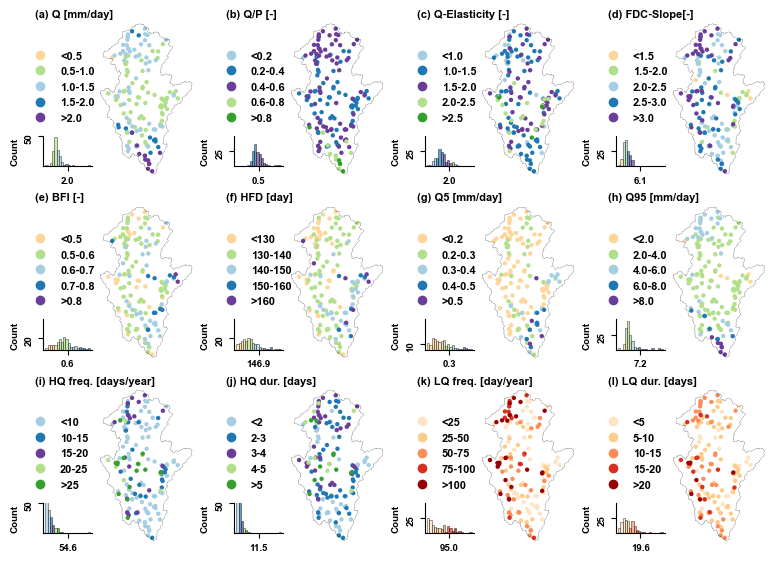

In [ ]:
# List of variables
variable_list = ["q_mean"]
variable_list = ["q_mean", "q_runoff_ratio", "q_elas_Sankarasubramanian", "slope_sawicz", "baseflow_index", "hfd_mean", "q_5", "q_95", 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur']
#variable_list = ["q_95", "q_5"]

# Create a subplot grid
num_variables = len(variable_list)
num_cols = 4
num_rows = math.ceil(num_variables / num_cols)

fig, axs = plt.subplots(num_rows, num_cols, figsize=(7.7, 5.5))
axs = axs.flatten()

for i, variable in enumerate(variable_list):
    
    plot_variable_subplot(axs[i], variable, network_estreams_filtered, color_mapping_list, gdf)
    legend_title = color_mapping_list[variable][0]
        
    axs[i].set_title(f'({chr(97+i)}) {legend_title}', loc="left", fontweight="bold", pad=0)  # Add subplot title with letter indexing
    # Plot the shapefile with white facecolor and black boundaries
    moselle_del.plot(ax=axs[i], facecolor='none', edgecolor='black', linewidth=0.1)
    #river_moselle.plot(ax=axs[i], linewidth=0.25)
    
    axs[i].set_xlim(3.7, 8) 
    axs[i].set_ylim(47.5, 50.5)  
    
# Adjust layout and remove space between subplots
plt.tight_layout(pad=0)

# Save the figure as a file
#fig.savefig(r'results\figs\fig_signatures_v02.png', dpi=300, bbox_inches='tight')

# Save or display the plot
plt.show()

### Figure 7: Some signatures and attributes

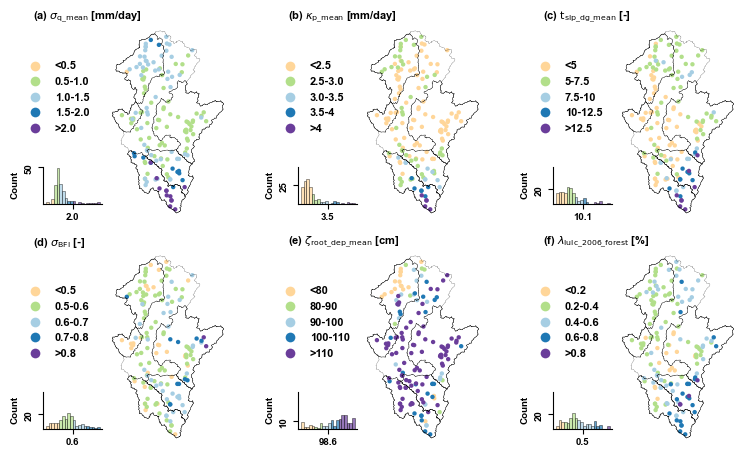

In [125]:
# Select multiple geometries
FR_selected = catchment_boundaries.loc[["FR003283", "FR003249", "FR000159", "LU000017", "DEBU1957"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')

# List of variables
variable_list = ["q_mean"]
variable_list = ["q_mean", "slope_sawicz", "baseflow_index", "hfd_mean", "q_5", "q_95"]
variable_list = ["q_mean", 'p_mean', 'slp_dg_mean',  "baseflow_index", 'root_dep_mean', 'lulc_2006_forest']

# Create custom y labels (adjust based on your data)
custom_legend_title = ['$\sigma_{\mathrm{q\_mean}}$ [mm/day]',  
                   "$\kappa_{\mathrm{p\_mean}}$ [mm/day]", 
                   "$\mathrm{t}_{\mathrm{slp\_dg\_mean}}$ [-]",
                   '$\sigma_{\mathrm{BFI}}$ [-]',
                   "$\zeta_{\mathrm{root\_dep\_mean}}$ [cm]",
                   "$\lambda_{\mathrm{lulc\_2006\_forest}}$ [%]"]

# Create a subplot grid
num_variables = len(variable_list)
num_cols = 3
num_rows = math.ceil(num_variables / num_cols)

fig, axs = plt.subplots(num_rows, num_cols, figsize=(7.8, 4.5))
axs = axs.flatten()

for i, variable in enumerate(variable_list):
    
    plot_variable_subplot(axs[i], variable, network_estreams_filtered, color_mapping_list, gdf)
    legend_title = custom_legend_title[i]
        
    axs[i].set_title(f'({chr(97+i)}) {legend_title}', loc="left", fontweight="bold", pad=0)  # Add subplot title with letter indexing
    # Plot the shapefile with white facecolor and black boundaries
    moselle_del.plot(ax=axs[i], facecolor='none', edgecolor='black', linewidth=0.1)
    #river_moselle.plot(ax=axs[i], linewidth=0.25)
    
    FR_selected_gdf.plot(ax=axs[i], facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    axs[i].set_xlim(3.7, 8) 
    axs[i].set_ylim(47.5, 50.5)  
    
# Adjust layout and remove space between subplots
plt.tight_layout(pad=0)

# Save the figure as a file
fig.savefig(r'results/figs/figures/appendixfe01.png', dpi=300, bbox_inches='tight')

# Save or display the plot
plt.show()

### Supporting information: Only attributes

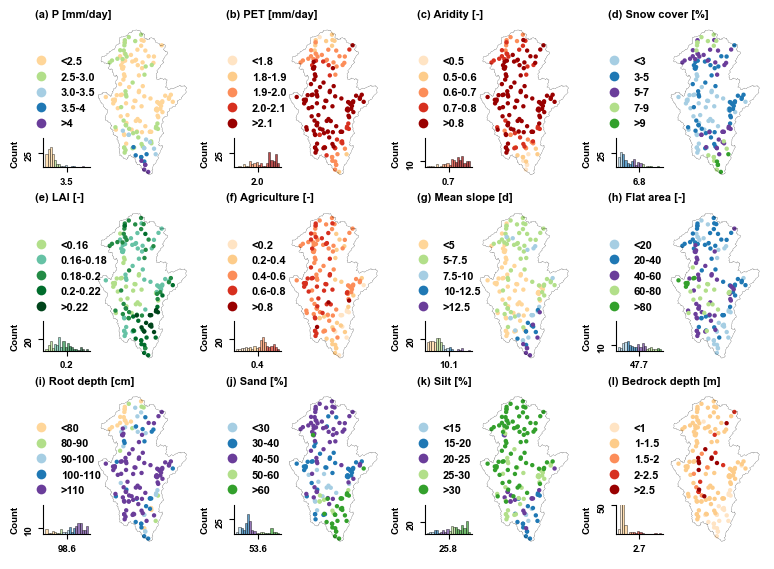

In [ ]:
# List of variables
variable_list = ['p_mean', 'pet_mean', 'aridity', "sno_cov_mean", 'lai_mean', 'lulc_2006_agriculture', 'slp_dg_mean', "flat_area_fra", 'root_dep_mean', 'soil_fra_sand_mean', 'soil_fra_silt_mean', "bedrk_dep"]
#variable_list = ['pet_mean']

# Create a subplot grid
num_variables = len(variable_list)
num_cols = 4
num_rows = math.ceil(num_variables / num_cols)

fig, axs = plt.subplots(num_rows, num_cols, figsize=(7.7, 5.5))
axs = axs.flatten()

for i, variable in enumerate(variable_list):
    
    plot_variable_subplot(axs[i], variable, network_estreams_filtered, color_mapping_list, gdf)
    legend_title = color_mapping_list[variable][0]
        
    axs[i].set_title(f'({chr(97+i)}) {legend_title}', loc="left", fontweight="bold")  # Add subplot title with letter indexing
    # Plot the shapefile with white facecolor and black boundaries
    moselle_del.plot(ax=axs[i], facecolor='none', edgecolor='black', linewidth=0.1)
    #river_moselle.plot(ax=axs[i], linewidth=0.25)
    
    axs[i].set_xlim(3.7, 8) 
    axs[i].set_ylim(47.5, 50.5)  
    
# Adjust layout and remove space between subplots
plt.tight_layout(pad=0)

# Save the figure as a file
#fig.savefig(r'results\figs\fig_plots_v02.png', dpi=300, bbox_inches='tight')

# Save or display the plot
plt.show()

## Appendix A. Three geologies for the Moselle

In [126]:
# Set the basin_id as the index
#catchment_boundaries.set_index("basin_id", inplace=True)
# Reproject to EPSG:4326
catchment_boundaries = catchment_boundaries.to_crs(epsg=4326)

In [127]:
# Assuming network_estreams_filtered is your DataFrame with lat and lon columns
# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_filtered['lon'], network_estreams_filtered['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_filtered, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_filtered.index

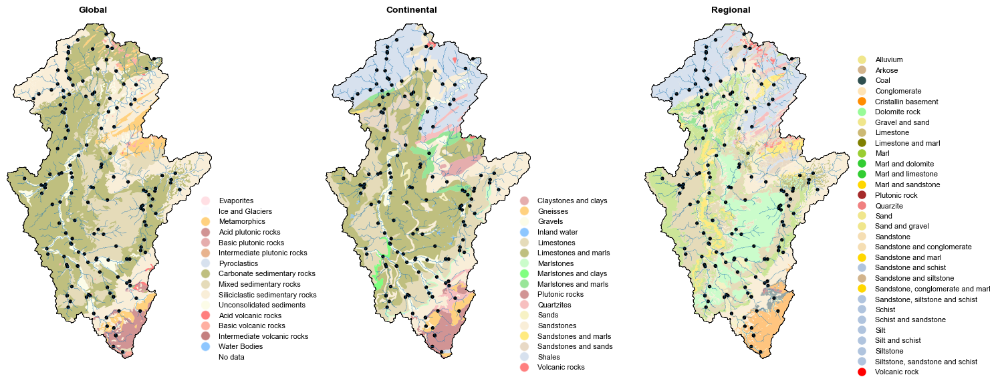

In [128]:
# Set global font properties
plt.rcParams.update({
    #'font.family': 'serif',            # Font family (e.g., 'sans-serif', 'serif', 'monospace')
    'font.size': 8,                  # Default font size
    'axes.titlesize': 8,             # Title font size
    'axes.labelsize': 8,             # Axis label font size
    'xtick.labelsize': 8,            # X-axis tick label font size
    'ytick.labelsize': 8,            # Y-axis tick label font size
    'legend.fontsize': 8,            # Legend font size
    'figure.titlesize': 6  ,          # Figure title font size
    'axes.titleweight': 'regular',        # Make only axis titles bold
    'font.weight': 'regular'           # Regular font for all other text
})

# Select multiple geometries
FR_selected = catchment_boundaries.loc[["DEBU1959"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')


# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'ev': "pink",  # Evaporites
    'ig': "ghostwhite",  # Ice and Glaciers
    'mt': "orange",  # Metamorphics
    'pa': "brown",  # Acid plutonic rocks
    'pb': "indianred",  # Basic plutonic rocks
    'pi': "chocolate",  # Intermediate plutonic rocks
    'py': "lightsteelblue",  # Pyroclastics
    'sc': "olive",  # Carbonate sedimentary rocks
    'sm': "y",  # Mixed sedimentary rocks
    'ss': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'su': "#FAFAD2",  # Unconsolidated sediments
    'va': "red",  # Acid volcanic rocks
    'vb': "tomato",  # Basic volcanic rocks
    'vi': "darkred",  # Intermediate volcanic rocks
    'wb': "#1E90FF",  # Water Bodies
    'nd': "white"   # Precambrian rocks
}

# Define the first color mapping for GLiM_dissolved just for the legend (full names)
color_mapping_glim_legend = {
    'Evaporites': "pink",  # Evaporites
    'Ice and Glaciers': "ghostwhite",  # Ice and Glaciers
    'Metamorphics': "orange",  # Metamorphics
    'Acid plutonic rocks': "brown",  # Acid plutonic rocks
    'Basic plutonic rocks': "indianred",  # Basic plutonic rocks
    'Intermediate plutonic rocks': "chocolate",  # Intermediate plutonic rocks
    'Pyroclastics': "lightsteelblue",  # Pyroclastics
    'Carbonate sedimentary rocks': "olive",  # Carbonate sedimentary rocks
    'Mixed sedimentary rocks': "y",  # Mixed sedimentary rocks
    'Siliciclastic sedimentary rocks': "#F5DEB3",  # Siliciclastic sedimentary rocks
    'Unconsolidated sediments': "#FAFAD2",  # Unconsolidated sediments
    'Acid volcanic rocks': "red",  # Acid volcanic rocks
    'Basic volcanic rocks': "tomato",  # Basic volcanic rocks
    'Intermediate volcanic rocks': "darkred",  # Intermediate volcanic rocks
    'Water Bodies': "#1E90FF",  # Water Bodies
    'No data': "white"   # Precambrian rocks
}


# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'Claystones and clays': 'indianred',       # Saddle Brown
    'Gneisses': 'orange',                       # Dim Gray
    'Gravels': '#FAFAD2',                         # Light Yellow
    'Inland water': '#1E90FF',                 # Dodger Blue
    'Limestones': 'y',                       # Light Slate Gray
    'Limestones and marls': 'olive',            # Slate Gray
    'Marlstones': 'palegreen',                   # Pale Green
    'Marlstones and clays': 'lime',         # Dark Olive Green
    'Marlstones and marls': '#32CD32',         # Lime Green
    'Plutonic rocks': 'brown',                 # Black
    'Quartzites': 'lightcoral',                   # Dark Slate Blue
    'Sands': 'khaki',                        # Light Goldenrod Yellow
    'Sandstones': '#F5DEB3',                   # Burlywood
    'Sandstones and marls': 'gold',         # Peru
    'Sandstones and sands': 'tan',         # Wheat
    'Shales': 'lightsteelblue',                       # Dark Slate Gray
    'Volcanic rocks': 'red'                # Dark Red
}

# Corrected color mapping with same colors for classes with the same name
color_mapping_geology_high = {
    'Alluvium': '#F0E68C',                        # Khaki-like, slightly lighter than sand
    'Arkose': '#D2B48C',                          # Tan
    'Coal': '#2F4F4F',                            # Dark Slate Gray (for a coal-like appearance)
    'Conglomerate': '#FFE4B5',                    # Moccasin, similar to gravel
    'Cristallin basement': '#FF8C00',             # Dark Orange, similar to 'Gneisses'
    'Dolomite rock': '#98FB98',                   # PaleGreen
    'Gravel and sand': '#F0E68C',                 # Same as Sand, as they are closely related
    'Limestone': 'y',                             # Yellow, same as before
    'Limestone and marl': 'olive',                # Same as before
    'Marl': '#9ACD32',                            # YellowGreen, similar to PaleGreen but unique
    'Marl and dolomite': '#32CD32',               # LimeGreen, same as before
    'Marl and limestone': '#32CD32',              # Same as Marl and dolomite (same color logic)
    'Marl and sandstone': 'gold',                 # Same as Sandstones and marls
    'Plutonic rock': 'brown',                     # Same as Plutonic rocks
    'Quarzite': 'lightcoral',                     # Same as Quartzites
    'Sand': 'khaki',                              # Same as Sands
    'Sand and gravel': 'khaki',                   # Same as Sand
    'Sandstone': '#F5DEB3',                       # Burlywood, same as Sandstones
    'Sandstone and conglomerate': '#F5DEB3',      # Same as Sandstones (close relationship)
    'Sandstone and marl': 'gold',                 # Same as Sandstones and marls
    'Sandstone and schist': 'lightsteelblue',     # Similar to Shales but distinct
    'Sandstone and siltstone': 'tan',             # Tan-like, similar to Arkose but unique
    'Sandstone, conglomerate and marl': 'gold',   # Same as Sandstones and marls
    'Sandstone, siltstone and schist': 'lightsteelblue',  # Similar to Shales
    'Schist': 'lightsteelblue',                   # Same as Shales (similar behavior)
    'Schist and sandstone': 'lightsteelblue',     # Same as Schist
    'Silt': 'lightsteelblue',                     # Same as Schist and Shales
    'Silt and schist': 'lightsteelblue',          # Same as Schist
    'Siltstone': 'lightsteelblue',                # Same as Schist and Shales
    'Siltstone, sandstone and schist': 'lightsteelblue',  # Same as Schist
    'Volcanic rock': 'red'                        # Dark Red, same as Volcanic rocks
}



# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['class'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['class'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['class'].map(color_mapping_geology_high)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plotting
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='class', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
                          label='Measurement Points')

# Plot the river
river_moselle.plot(ax=ax1, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax1, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=15, edgecolor='none', linewidth=0.5, 
                          label='Streamflow gauges')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_title('')
ax1.set_xlabel('')
ax1.set_ylabel('')

# Create custom legend elements with circles for the first plot
geology_legend_elements1 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=0.5, 
                                   label=cls) for cls, color in color_mapping_glim_legend.items()]
geology_legend1 = ax1.legend(handles=geology_legend_elements1, title='', 
                             bbox_to_anchor=(0.9, 0.5), frameon=False)

# Add the geological classes legend back to the first plot
#ax1.add_artist(geology_legend1)

# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='class', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=0.5, label='')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
#                          label='Measurement Points')


# Plot the river
river_moselle.plot(ax=ax2, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax2, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='black', markersize=15, edgecolor='none', linewidth=0.5, 
                          label='Streamflow gauges')

# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
ax2.set_title('')
ax2.set_xlabel('')
ax2.set_ylabel('')

# Create custom legend elements with circles for the second plot
geology_legend_elements2 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=0.5,
                                   label=cls) for cls, color in color_mapping_geology.items()]
geology_legend2 = ax2.legend(handles=geology_legend_elements2, title='', 
                             bbox_to_anchor=(0.9, 0.5), frameon=False)

# Add the geological classes legend back to the second plot
#ax2.add_artist(geology_legend2)
###########################################################################################################
# Plot the THIRD geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='class', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='black', linewidth=0.5, label='')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='white', linewidth=0.5, 
#                          label='Measurement Points')


# Plot the river
river_moselle.plot(ax=ax3, linewidth=0.25, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='black', linewidth=0.5, label='Basins')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='black', markersize=15, edgecolor='none', linewidth=0.5, 
                          label='Streamflow gauges')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
ax3.set_title('')
ax3.set_xlabel('')
ax3.set_ylabel('')

# Create custom legend elements with circles for the second plot
geology_legend_elements3 = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, alpha=1,
                                   label=cls) for cls, color in color_mapping_geology_high.items()]
# Add the legend to the third plot, keeping its current location
geology_legend3 = ax3.legend(handles=geology_legend_elements3, title='', 
                             bbox_to_anchor=(0.99, 0.92), frameon=False)


# Add the geological classes legend back to the second plot
#ax3.add_artist(geology_legend3)


## Extract color mapping information from the color mapping list
#legend_labels = color_mapping_list[variable][2]
#color_mapping = color_mapping_list[variable][3]
#
## Extract color mapping information from the color mapping list
#legend_labels = color_mapping_list[variable][2]
#color_mapping = color_mapping_list[variable][3]

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    ax.text(0.42, 1.05, text_to_subplots[i], transform=ax.transAxes, 
            fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    i = i + 1

fig.tight_layout()

fig.savefig(r'results/figs/figures/appendixfa01.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

### Here we retrieve the name of the sub-catchments within Moselle used

In [129]:
estreams_attributes.loc[["PL000936", "FR000867", "FR003986", "FR001604"]]

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi
basin_id,,,,,,,,,,,,,,,,,,,,,
PL000936,152210060,ZAMBSKI KOŚCIELNE,PL,PL_IMGW,Narew (26),21.206094,52.755974,21.206094,52.755974,NaN,...,649.34,4864.86,10.874,429.370,313.206,89.0,NaN,NaN,NaN,NaN
FR000867,J930061101,J9300611,FR,FR_EAUFRANCE,La Vilaine à Rieux,-2.126360,47.580112,-2.126360,47.580112,1,...,20.96,76.40,0.796,101.568,180.202,15.0,NaN,NaN,NaN,NaN
FR003986,L720061001,La Vienne Ã Chinon,FR,FR_EAUFRANCE,La Vienne à Chinon,0.238393,47.165937,0.238393,47.165937,25,...,59.47,350.54,0.964,439.426,689.877,57.0,NaN,NaN,NaN,NaN
FR001604,O262002002,O2620010,FR,FR_EAUFRANCE,La Garonne à Verdun-sur-Garonne,1.242179,43.854636,1.242179,43.854636,91,...,29.76,280.70,5.958,830.840,1002.036,34.0,NaN,NaN,NaN,NaN


In [130]:
estreams_attributes.loc[["FR003249", "FR000159", "FR003283", "LU000017", "DEBU1957"]]

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi
basin_id,,,,,,,,,,,,,,,,,,,,,
FR003249,A573061001,La Moselle Ã Toul,FR,FR_EAUFRANCE,La Moselle à Toul,5.896402,48.669764,5.896402,48.669764,201,...,6.58,35.46,4.315,0.391,0.466,21.0,23.257992,24.941138,27.394805,24.406065
FR000159,A694102004,A6941020,FR,FR_EAUFRANCE,La Meurthe à Malzéville,6.179269,48.710667,6.179269,48.710667,188,...,6.72,69.27,4.024,0.391,0.627,13.0,40.885303,16.434307,29.399550,13.280840
FR003283,A843101001,L'Orne Ã Rosselange,FR,FR_EAUFRANCE,L'Orne à Rosselange,6.072001,49.256392,6.072001,49.256392,164,...,2.00,5.01,2.215,0.976,0.473,5.0,0.003413,58.991819,41.004768,0.000000
LU000017,16,Rosport,LU,LU_CONTACTFORM,Sure,6.509851,49.785883,6.509851,49.785883,NaN,...,2.67,67.85,4.753,1.641,4.770,78.0,18.753136,5.872553,24.977481,50.396831
DEBU1957,26400550,BundespegelFremersdorf,DE,DE_BU,Saar,6.648000,49.409000,6.648000,49.409000,NaN,...,23.06,114.90,3.185,4.261,3.796,103.0,33.169048,20.494960,43.577625,2.758367


## Figure 1: Part c

In [131]:
#catchment_boundaries.set_index("basin_id", inplace=True)

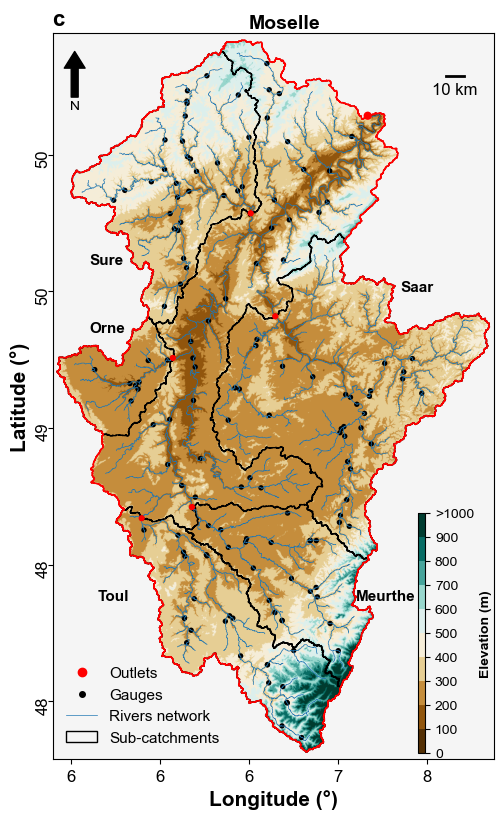

In [132]:
# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams['lon'], network_estreams['lat'])]
network_estreams_all_gdf = gpd.GeoDataFrame(network_estreams, geometry=geometry, crs='EPSG:4326')
network_estreams_all_gdf["basin_id"] = network_estreams.index


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_filtered['lon'], network_estreams_filtered['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_filtered, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_filtered.index


# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, ax = plt.subplots(figsize=(5, 8))


data_df = estreams_attributes_dfs["DEBU1959"]
# Load the world shapefile dataset provided by GeoPandas
#gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 12           # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight


# Clear the subplot
ax.clear()

# Set the background color to white
ax.set_facecolor('whitesmoke')

# Plot the shapefile with white facecolor and black boundaries
#gdf.plot(ax=ax, facecolor='white', edgecolor='black', linewidth=0.1)


# Select multiple geometries
FR_selected = catchment_boundaries.loc[["FR003283", "FR003249", "FR000159", "LU000017", "DEBU1957"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')

# Select multiple geometries
moselle_boundaries = catchment_boundaries.loc[["DEBU1959"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
moselle_boundaries_gdf = gpd.GeoDataFrame({'geometry': moselle_boundaries}, crs='EPSG:4326')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle_boundaries_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle_boundaries_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

## Define the color limits
#vmin, vmax = 200, 1000  # Set your desired min and max values for the color map
#
## Display the image with specified color range
#cax = ax.imshow(elevation_wgs, cmap='BrBG', extent=extent, vmin=vmin, vmax=vmax)

# Define the color classes (discrete intervals)
bounds = [0, 100,200, 300, 400, 500, 600, 700, 800, 900, 1000]  # Define class boundaries
cmap = plt.get_cmap('BrBG')  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

# Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent)

# Add colorbar with class labels
#cbar = fig.colorbar(cax, ticks=bounds)
#cbar.set_label('Elevation (m)')
# Create a small colorbar inside the plot
cbar_ax = fig.add_axes([0.825, 0.07, 0.015, 0.3])  # [left, bottom, width, height]
#cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)
#cbar.ax.tick_params(labelsize=10)  # Set the font size for the ticks
#cbar.set_label('Elevation (m)', fontsize=12)  # Set the label with a smaller font size
# Create the colorbar with the same ticks
cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)
cbar.ax.tick_params(labelsize=10)
cbar.set_label('Elevation (m)', fontsize=10)

# Get tick labels and modify the last one
tick_labels = [str(int(b)) for b in bounds]
tick_labels[-1] = ">1000"  # Replace last label

# Apply custom tick labels
cbar.ax.set_yticklabels(tick_labels)

# Adjust the colorbar size (shrink)
cbar.ax.set_aspect('auto')

# Set the title and show the plot
ax.set_title('c', loc = "left", fontsize=16, fontweight="bold")


# Plot the river
river_moselle.plot(ax=ax, linewidth=0.5)

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax, facecolor='whitesmoke', edgecolor='darkred', linewidth=0.8)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Sub-catchments')

moselle_boundaries_gdf.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='Sub-catchments')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax, color='black', markersize=15, edgecolor='none', linewidth=0.5, 
                          label='Streamflow gauges')

# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=35, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_gdf.loc[["FR003249"]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_gdf.loc[["FR000159"]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_gdf.loc[["FR003283"]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_gdf.loc[["LU000017"]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_gdf.loc[["DEBU1957"]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)


# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min-0.025, x_max+0.025)
ax.set_ylim(y_min-0.025, y_max+0.025)

ax.set_xlabel("Longitude (°)", fontsize=15)
ax.set_ylabel("Latitude (°)", fontsize=15)

# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', label='Sub-catchments')

# For streamflow gauges (as black dots)
streamflow_marker = Line2D([0], [0], color='black', lw=0, marker='o', markersize=4, label='Gauges')

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlets')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network')

# Add the legend with all items
legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, subcatchment_patch], 
                   loc='lower left', fontsize=11, title="", title_fontsize='10', frameon=False)

# Add a north arrow
x, y, arrow_length = 0.05, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=5, headwidth=15), ha='center', va='center', fontsize=10, xycoords=ax.transAxes)

# Add a scale bar 
scalebar_length = 10  # in kilometers
x_scalebar = x_max - (x_max - x_min) * 0.1
y_scalebar = y_min + (y_max - y_min) * 0.95
ax.plot([x_scalebar, x_scalebar + scalebar_length/100], [y_scalebar, y_scalebar], color='black', linewidth=2)
ax.text(x_scalebar + (scalebar_length/200), y_scalebar - (y_max - y_min) * 0.02, f'{scalebar_length} km', ha='center', va='center', fontsize=12)

# Adding some text
ax.text(5.6, 49.35, 'Orne', fontsize=11, color='black', fontweight='bold')
ax.text(5.6, 49.60, 'Sure', fontsize=11, color='black', fontweight='bold')
ax.text(7.35, 49.50, 'Saar', fontsize=11, color='black', fontweight='bold')
ax.text(7.1, 48.37, 'Meurthe', fontsize=11, color='black', fontweight='bold')
ax.text(5.65, 48.37, 'Toul', fontsize=11, color='black', fontweight='bold')
ax.text(6.5, 50.465, 'Moselle', fontsize=14, color='black', fontweight='bold')


# Rotate the existing y-tick labels without changing them
ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=12)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)


import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))

# Adjust the layout to remove extra space
plt.tight_layout(pad=0)

fig.savefig(r'results/figs/f01c.png', dpi=300)

# Show the plot
plt.show()

## Figure 1: Part a & b

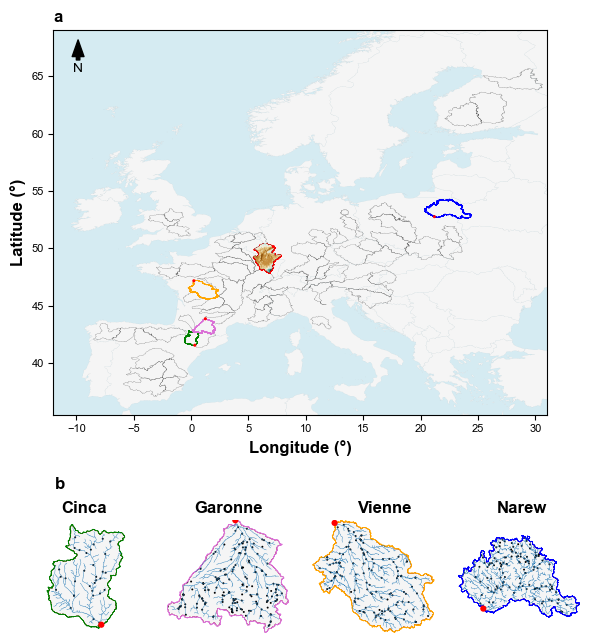

In [238]:
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig = plt.figure(figsize=(6, 8))
gs = fig.add_gridspec(2, 1)

# Create the first figure in the first column
ax = fig.add_subplot(gs[0, 0])

list_cats_list = ['ES000801', 'ES000665', 'ES001243', 'ES000196', 'ES000194', 'ES001080',
       'ES000316', 'ES000339', 'GB000472', 'GB000271', 'GB000153', 'ITTO0361',
       'ITVE0408', 'ITPI0183', 'FI000557', 'FI000226', 'FI000137', 'PL000936',
       'PL000794', 'HR000048', 'HUGR0037', 'AT000393', 'PL000253', 'PL000349',
       'PL000015', 'CZ000097', 'DEST1711', 'DEBY0711', 'DEBY0724', 'DEBY0697',
       'DEBU1953', 'NL000008', 'CH000026', 'FR002679', 'FR004615', 'NL000016',
       'BEVL0155', 'FR000408', 'FR000373', 'FR000345', 'FR001071', 'FR003922',
       'FR003986', 'FR002118', 'FR001952', 'FR002029', 'FR001604', 'FR004221',
       'ES001171', 'ES001010', 'PL000536', 'HR000278', 'CZ000236', 'DEST1707',
       'DEBE0155', 'FR002758', 'FR002462', 'FR001394', 'FR000867', 'FR004308',
       'DEBU1959']

list_cats_list = dataframe_BFI_sorted.index.tolist() 

# Select multiple geometries
cats_selected = catchment_boundaries.loc[list_cats_list, "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
cats_selected_gdf = gpd.GeoDataFrame({'geometry': cats_selected}, crs='EPSG:4326')

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 14            # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight

estreams_attributes_used = estreams_attributes_dfs_all.copy()

# Set the background color to white
#ax.set_facecolor('white')
ax.set_facecolor((0.68, 0.85, 0.9, 0.5))  # RGBA for light blue with 50% transparency

# Plot the shapefile with white facecolor and black boundaries
gdf.plot(ax=ax, facecolor='whitesmoke', edgecolor='black', linewidth=0.01)

ax.set_xlim(-12, 31)
ax.set_ylim(35.5, 69)

# Define markers for each watershed group
#markers = ['o', 's', '^', 'D', 'P']  # You can extend this list if needed

#river_dissolved.plot(ax=ax, linewidth=0.25, alpha=0.5)

cats_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.1, label='', alpha=0.7)

# Plot the gauges for each desired watershed group
colors = plt.cm.tab10(np.linspace(0, 1, len(estreams_attributes_used.keys())))  # Get distinct colors

# Select multiple geometries
cat_selected = catchment_boundaries.loc[["DEBU1959"], "geometry"]
# Create a GeoDataFrame from the selected geometries and set the CRS directly
cat_selected_gdf = gpd.GeoDataFrame({'geometry': cat_selected}, crs='EPSG:4326')
cat_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=0.6, label='')

cat_selected = catchment_boundaries.loc[["PL000936"], "geometry"]
# Create a GeoDataFrame from the selected geometries and set the CRS directly
cat_selected_gdf = gpd.GeoDataFrame({'geometry': cat_selected}, crs='EPSG:4326')
cat_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=0.6, label='')

cat_selected = catchment_boundaries.loc[["ES000331"], "geometry"]
# Create a GeoDataFrame from the selected geometries and set the CRS directly
cat_selected_gdf = gpd.GeoDataFrame({'geometry': cat_selected}, crs='EPSG:4326')
cat_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='green', linewidth=0.6, label='')

cat_selected = catchment_boundaries.loc[["FR003986"], "geometry"]
# Create a GeoDataFrame from the selected geometries and set the CRS directly
cat_selected_gdf = gpd.GeoDataFrame({'geometry': cat_selected}, crs='EPSG:4326')
cat_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='orange', linewidth=0.6, label='')

cat_selected = catchment_boundaries.loc[["FR001604"], "geometry"]
# Create a GeoDataFrame from the selected geometries and set the CRS directly
cat_selected_gdf = gpd.GeoDataFrame({'geometry': cat_selected}, crs='EPSG:4326')
cat_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='orchid', linewidth=0.6, label='')



# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=5, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_all_gdf.loc[["PL000936"]].plot(ax=ax, color='red', markersize=5, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_all_gdf.loc[["ES000331"]].plot(ax=ax, color='red', markersize=5, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_all_gdf.loc[["FR003986"]].plot(ax=ax, color='red', markersize=5, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

network_estreams_all_gdf.loc[["FR001604"]].plot(ax=ax, color='red', markersize=5, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)



ax.set_aspect('equal')  # Adjust aspect ratio as needed
#ax.set_axis_off()  # Turn off both x-axis and y-axis
ax.set_xlabel('Longitude (°)', fontsize=12)
ax.set_ylabel('Latitude (°)', fontsize=12)
ax.set_title("a", loc="left", fontsize=12, fontweight="bold")

# Add a north arrow
x, y, arrow_length = 0.05, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=2.5, headwidth=8.5), ha='center', va='center', fontsize=10, xycoords=ax.transAxes)

# Select multiple geometries
moselle_boundaries = catchment_boundaries.loc[["DEBU1959"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
moselle_boundaries_gdf = gpd.GeoDataFrame({'geometry': moselle_boundaries}, crs='EPSG:4326')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle_boundaries_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle_boundaries_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

# Define the color classes (discrete intervals)
bounds = [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]  # Define class boundaries
cmap = plt.get_cmap('BrBG')  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

## Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent, zorder = 100)

#---------------------------------------------------------------------------------------------------------------------------------------------
gs_sub = gs[1, 0].subgridspec(1, 4)  # Create space for 3 rows in the second column

### Second grid:
# First subplot
ax1 = fig.add_subplot(gs_sub[0, 0])
ax2 = fig.add_subplot(gs_sub[0, 1])
ax3 = fig.add_subplot(gs_sub[0, 2])
ax4 = fig.add_subplot(gs_sub[0, 3])

catchments=["ES000331", "FR001604", "FR003986", "PL000936"]
colors_cat = ["green", "orchid", "orange", "blue"]
text_to_subplots=["Cinca", "Garonne", "Vienne", "Narew"]
x_centers = [0.14, 0.38, 0.64, 0.87]
i = 0
for ax in [ax1, ax2, ax3, ax4]:

    # Select the catchment
    FR_selected = catchment_boundaries.loc[[catchments[i]], "geometry"]

    # Create a GeoDataFrame from the selected geometries and set the CRS directly
    FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')

    # Set plot limits to the bounding box of the selected study areas
    bounds = FR_selected_gdf.total_bounds
    x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

    # Create a mask that covers the entire plotting area
    plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
    mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

    # Combine the selected geometries into one
    combined_geometry = FR_selected_gdf.unary_union

    # Create the mask by subtracting the combined geometry from the plot extent
    mask['geometry'] = mask.difference(combined_geometry)

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='whitesmoke', edgecolor='darkred', linewidth=0.5, label='')


    # Plot the points from network_estreams_filtered
    network_estreams_all_gdf.plot(ax=ax, color='black', markersize=2, edgecolor='none', linewidth=0.5, 
                            label='Measurement Points')
    
    # Plot the mask to cover everything outside the study area
    mask.plot(ax=ax, facecolor='white', edgecolor=colors_cat[i], linewidth=0.5, label='Basins')
    
    if catchments[i] == "ES000331":
        rivers_cinca.plot(ax=ax, linewidth=0.25, label='River network')
    elif catchments[i] == "FR001604":
        rivers_garonne.plot(ax=ax, linewidth=0.25, label='River network')
    else:
        rivers_fivesubs_es.plot(ax=ax, linewidth=0.25, label='River network')
    

    # Plot the points from network_estreams_filtered
    network_estreams_all_gdf.loc[[catchments[i]]].plot(ax=ax, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                            label='Measurement Points', zorder=10000)


    if catchments[i] == "ES000331":
        ax.set_xlim(-1, 1)
        ax.set_ylim(y_min, y_max)
    else:
        # Set plot limits to the bounding box of the study area
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)

    # Overlay the study area boundaries
    #FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    
    # Calculate the x-coordinate for the center of each subplot
    fig.text(x_centers[i], 0.36, text_to_subplots[i], fontsize=12, ha='center', va='top', fontweight='bold')

    #ax.set_title(text_to_subplots[i], loc="center", fontsize=12)
    i = i + 1

fig.text(0.1, 0.39, "b", fontsize=12, ha='center', va='top', fontweight="bold")

# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig(r'results/figs/f01ab.png', dpi=300)
plt.show()


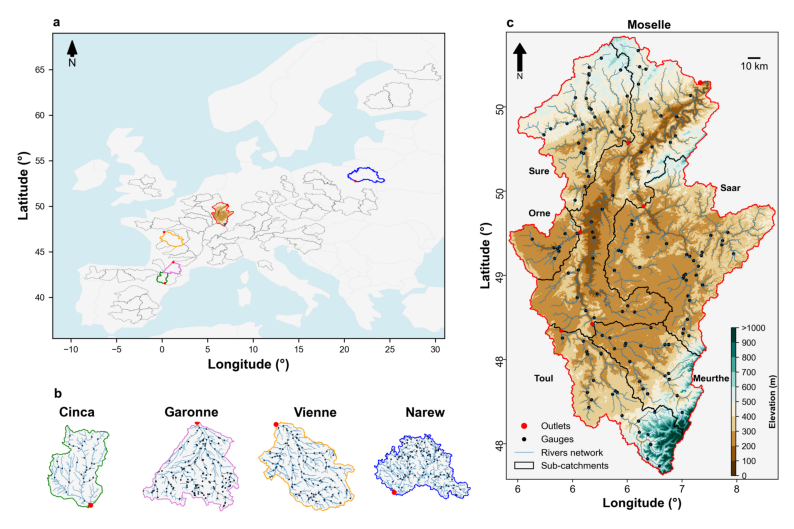

In [270]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the saved images
img_left = mpimg.imread("results/figs/fig_study_area_a.png")   # panels a,b
img_right = mpimg.imread("results/figs/f01c.png")   # panel c

fig, axes = plt.subplots(
    1, 2, figsize=(10, 7),
    gridspec_kw={'width_ratios': [1.52, 1]}  # left panel wider
)

# Plot both images
axes[0].imshow(img_left)
axes[1].imshow(img_right)

# Hide axes
for ax in axes:
    ax.axis("off")

# Adjust spacing between panels
plt.subplots_adjust(wspace=0.00, hspace=0)

# Save combined figure
fig.savefig("results/figs/figures/f01.png", dpi=300, bbox_inches="tight")

plt.show()


## Figure 2: Permeabilities Moselle

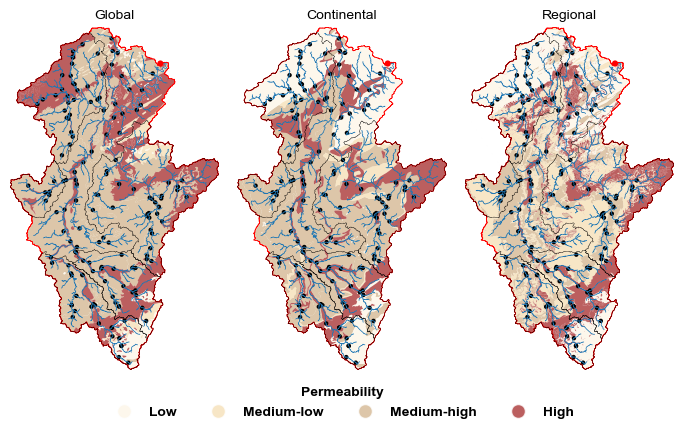

In [133]:
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 4))  # Two subplots side by side

# Select multiple geometries
FR_selected = catchment_boundaries.loc[["DEBU1959"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "wheat",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "wheat",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "wheat",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'wheat',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='black', markersize=10, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points')

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=10)

# Select multiple geometries
FR_selected = catchment_boundaries.loc[["FR003283", "FR003249", "FR000159", "LU000017", "DEBU1957"], "geometry"]

# Create a GeoDataFrame from the selected geometries and set the CRS directly
FR_selected_gdf = gpd.GeoDataFrame({'geometry': FR_selected}, crs='EPSG:4326')

# Plot the river
river_moselle.plot(ax=ax1, linewidth=0.5, label='River network')
river_moselle.plot(ax=ax2, linewidth=0.5, label='River network')
river_moselle.plot(ax=ax3, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=10)
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium-low': to_rgba('wheat', 0.75),
    'Medium-high': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5, fontsize='small', title_fontsize='small')
# Make the legend title bold
legend.get_title().set_fontweight('bold')
# Make all legend item labels bold
for text in legend.get_texts():
    text.set_fontweight('bold')
# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig(r'results/figs/figures/f02.png', dpi=300, bbox_inches='tight')

plt.show()

## Appendix D

### Check the correlations using the whole dataset

In [277]:
list_cats_list = ['ES000801', 'ES000665', 'ES001243', 'ES000196', 'ES000194', 'ES001080',
       'ES000316', 'ES000339', 'GB000472', 'GB000271', 'GB000153', 'ITTO0361',
       'ITVE0408', 'ITPI0183', 'FI000557', 'FI000226', 'FI000137', 'PL000936',
       'PL000794', 'HR000048', 'HUGR0037', 'AT000393', 'PL000253', 'PL000349',
       'PL000015', 'CZ000097', 'DEST1711', 'DEBY0711', 'DEBY0724', 'DEBY0697',
       'DEBU1953', 'NL000008', 'CH000026', 'FR002679', 'FR004615', 'NL000016',
       'BEVL0155', 'FR000408', 'FR000373', 'FR000345', 'FR001071', 'FR003922',
       'FR003986', 'FR002118', 'FR001952', 'FR002029', 'FR001604', 'FR004221',
       'ES001171', 'ES001010', 'PL000536', 'HR000278', 'CZ000236', 'DEST1707',
       'DEBE0155', 'FR002758', 'FR002462', 'FR001394', 'FR000867', 'FR004308',
       'DEBU1959']

list_cats_list = dataframe_BFI_sorted.index.tolist()

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

In [278]:
combined_df = pd.concat(estreams_attributes_dfs_all.values(), ignore_index=True)
combined_df

,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean,perm_high_regi,perm_medium_regi,perm_low_regi,perm_verylow_regi
0,Q012005001,L'Adour Ã Montgaillard,FR,FR_EAUFRANCE,L'Adour à Montgaillard,0.109344,43.125266,0.109344,43.125266,431,...,0.44,4.69,16.422,0.000,0.000,4.0,NaN,NaN,NaN,NaN
1,Q012006001,L'Adour Ã Tarbes,FR,FR_EAUFRANCE,L'Adour à Tarbes,0.083189,43.239630,0.083189,43.239630,309,...,0.44,4.69,15.646,0.000,0.000,5.0,NaN,NaN,NaN,NaN
2,Q012006002,L'Adour Ã Tarbes,FR,FR_EAUFRANCE,L'Adour à Tarbes,0.088685,43.231731,0.088685,43.231731,309,...,0.44,4.69,15.724,0.000,0.000,5.0,NaN,NaN,NaN,NaN
3,Q013003001,L'Adour Ã Maubourguet,FR,FR_EAUFRANCE,L'Adour à Maubourguet,0.035542,43.470656,0.035542,43.470656,172,...,1.10,5.94,13.121,42.748,38.536,6.0,NaN,NaN,NaN,NaN
4,Q021401001,L'Echez Ã Louey,FR,FR_EAUFRANCE,L'Echez à Louey,0.022191,43.175522,0.022191,43.175522,333,...,0.00,0.00,0.720,0.000,0.000,2.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4464,O469251002,O4692510,FR,FR_EAUFRANCE,L'Agout à Lavaur et à Saint-Jean-de-Rives,1.807978,43.711997,1.807978,43.711997,110,...,8.32,148.89,1.421,92.703,207.942,11.0,NaN,NaN,NaN,NaN
4465,O469251003,O4692550,FR,FR_EAUFRANCE,L'Agout à Lavaur et à Saint-Jean-de-Rives,1.822910,43.701405,1.822910,43.701405,110,...,8.32,148.89,1.428,92.703,207.942,11.0,NaN,NaN,NaN,NaN
4466,O470403001,O4704030,FR,FR_EAUFRANCE,Le Dadou à Paulinet et à Rayssac [Saint-Jean-d...,2.440637,43.822139,2.440637,43.822139,413,...,0.00,0.00,1.697,0.000,0.211,1.0,NaN,NaN,NaN,NaN
4467,O479404001,O4794040,FR,FR_EAUFRANCE,Le Dadou à Graulhet [La Jonquière],1.960869,43.773184,1.960869,43.773184,150,...,1.47,23.90,0.644,6.138,29.559,3.0,NaN,NaN,NaN,NaN


100%|██████████| 14/14 [00:04<00:00,  2.89it/s]


dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


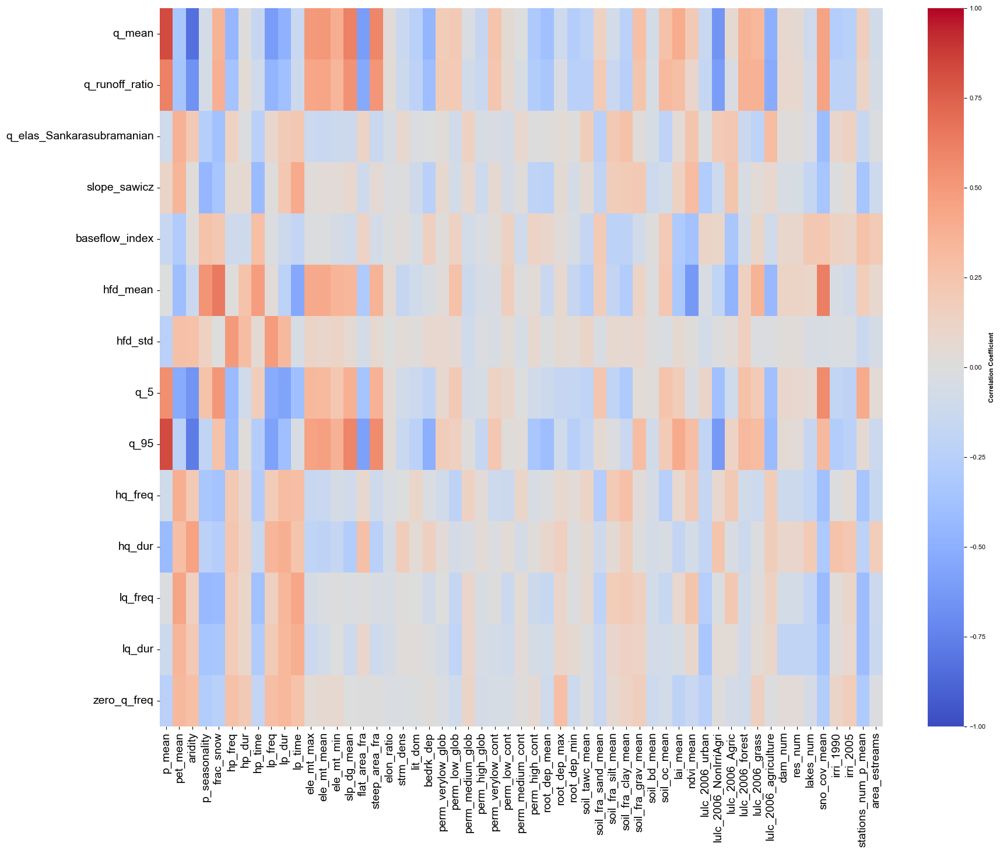

In [279]:
# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(combined_df.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    

    estreams_attributes_dfs_cat = combined_df.copy()
    #estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date > "2009"]
    estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
    # Calculate correlations between the current variable and other variables
    correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
    # Add the correlations to the DataFrame
    correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict.keys())

# Assuming correlation_dict is a dictionary containing all correlation DataFrames
# Initialize an empty list to store individual correlation DataFrames
correlation_list = []

# Iterate over all keys in the dictionary and append their DataFrame to the list with an added 'signature' column
for signature in correlation_dict.keys():
    corr_df = correlation_dict[signature].T
    corr_df['signature'] = signature  # Add a column to identify the signature
    correlation_list.append(corr_df)

# Concatenate all correlation DataFrames along the rows
combined_correlation_df = pd.concat(correlation_list)

# Preserve the order of the signatures by converting to categorical type
combined_correlation_df['signature'] = pd.Categorical(
    combined_correlation_df['signature'],
    categories=list(correlation_dict.keys()),
    ordered=True
)

# Set the signature column as the index
combined_correlation_df.set_index('signature', inplace=True)

# Customize row names (for demonstration purposes, modify as needed)
#custom_row_names = ['Row ' + str(i) for i in range(1, len(combined_correlation_df.index) + 1)]
#combined_correlation_df.index = custom_row_names

# Plot the combined heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(combined_correlation_df, annot=False, cmap='coolwarm', fmt=".1f", vmin=-1, vmax=1, 
            cbar_kws={'label': 'Correlation Coefficient'}, 
            yticklabels=combined_correlation_df.index)

#plt.title('Combined Heatmap for All Signatures', fontsize=20)
#plt.xlabel('Variables', fontsize=15)
plt.ylabel('', fontsize=15)

# Customize font sizes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.show()

In [280]:
correlation_dict["baseflow_index"]

,FR004221
p_mean,-0.154090
pet_mean,-0.295179
aridity,0.030364
p_seasonality,0.262083
frac_snow,0.232618
hp_freq,-0.107515
hp_dur,-0.107399
hp_time,0.283033
lp_freq,-0.018293
lp_dur,-0.122460


In [281]:
correlation_dict["baseflow_index"].loc[["perm_verylow_glob", "perm_low_glob", "perm_medium_glob", "perm_high_glob", 
                                        "perm_verylow_cont", "perm_low_cont", "perm_medium_cont", "perm_high_cont"]]

,FR004221
perm_verylow_glob,0.017349
perm_low_glob,0.144344
perm_medium_glob,-0.078335
perm_high_glob,-0.027392
perm_verylow_cont,0.030108
perm_low_cont,0.134022
perm_medium_cont,-0.094149
perm_high_cont,0.127356


In [282]:
combined_df["q5qmean"] = combined_df["q_5"]/combined_df["q_mean"]

In [283]:
combined_df[["q5qmean",'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']].corr(method="spearman")

,q5qmean,perm_verylow_glob,perm_low_glob,perm_medium_glob,perm_high_glob,perm_verylow_cont,perm_low_cont,perm_medium_cont,perm_high_cont
q5qmean,1.000000,-0.059081,0.118313,-0.064403,0.074242,-0.021068,0.101046,-0.005786,0.133148
perm_verylow_glob,-0.059081,1.000000,0.614703,-0.432649,-0.281886,0.596272,0.314834,-0.462745,-0.183042
perm_low_glob,0.118313,0.614703,1.000000,-0.385979,-0.359594,0.401102,0.555911,-0.396256,-0.222679
perm_medium_glob,-0.064403,-0.432649,-0.385979,1.000000,-0.352320,-0.469444,-0.199522,0.682089,0.081995
perm_high_glob,0.074242,-0.281886,-0.359594,-0.352320,1.000000,-0.057163,-0.186350,-0.050172,0.372643
perm_verylow_cont,-0.021068,0.596272,0.401102,-0.469444,-0.057163,1.000000,0.005813,-0.558732,-0.270165
perm_low_cont,0.101046,0.314834,0.555911,-0.199522,-0.186350,0.005813,1.000000,-0.309804,-0.082723
perm_medium_cont,-0.005786,-0.462745,-0.396256,0.682089,-0.050172,-0.558732,-0.309804,1.000000,-0.114323
perm_high_cont,0.133148,-0.183042,-0.222679,0.081995,0.372643,-0.270165,-0.082723,-0.114323,1.000000


# Additional analysis

### Correlation between geology and other attributes f0or the five regional catchments overexplored

In [142]:
list_cats_list = ['ES000801', 'ES000665', 'ES001243', 'ES000196', 'ES000194', 'ES001080',
       'ES000316', 'ES000339', 'GB000472', 'GB000271', 'GB000153', 'ITTO0361',
       'ITVE0408', 'ITPI0183', 'FI000557', 'FI000226', 'FI000137', 'PL000936',
       'PL000794', 'HR000048', 'HUGR0037', 'AT000393', 'PL000253', 'PL000349',
       'PL000015', 'CZ000097', 'DEST1711', 'DEBY0711', 'DEBY0724', 'DEBY0697',
       'DEBU1953', 'NL000008', 'CH000026', 'FR002679', 'FR004615', 'NL000016',
       'BEVL0155', 'FR000408', 'FR000373', 'FR000345', 'FR001071', 'FR003922',
       'FR003986', 'FR002118', 'FR001952', 'FR002029', 'FR001604', 'FR004221',
       'ES001171', 'ES001010', 'PL000536', 'HR000278', 'CZ000236', 'DEST1707',
       'DEBE0155', 'FR002758', 'FR002462', 'FR001394', 'FR000867', 'FR004308',
       'DEBU1959', "ES000331"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

In [143]:
### Vilaine  
corrs_test = estreams_attributes_dfs_all["FR000867"].loc[:, ['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]].corr(method="spearman")[['perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']]

corrs_test.loc[["baseflow_index", "p_mean", "pet_mean", "ele_mt_mean"], :].T

,baseflow_index,p_mean,pet_mean,ele_mt_mean
perm_verylow_glob,0.797377,0.765176,-0.467707,0.581454
perm_low_glob,0.574155,0.624412,-0.445607,0.329749
perm_medium_glob,-0.126298,0.173084,-0.019213,0.218656
perm_high_glob,-0.472864,-0.679607,0.327566,-0.433147
perm_verylow_cont,-0.315907,-0.421846,0.331473,-0.159128
perm_low_cont,0.363335,0.369794,-0.093372,-0.045217
perm_medium_cont,0.092873,0.210907,-0.361583,0.277867
perm_high_cont,-0.030429,0.051860,0.171870,-0.235818


In [144]:
### Garonne
corrs_test = estreams_attributes_dfs_all["FR001604"].loc[:, ['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]].corr(method="spearman")[['perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']]

corrs_test.loc[["baseflow_index", "p_mean", "pet_mean", "ele_mt_mean"], :].T

,baseflow_index,p_mean,pet_mean,ele_mt_mean
perm_verylow_glob,0.801799,0.825808,-0.822961,0.826126
perm_low_glob,0.699435,0.883459,-0.902741,0.894441
perm_medium_glob,-0.689619,-0.605099,0.569535,-0.591062
perm_high_glob,0.196783,-0.095642,0.229336,-0.160977
perm_verylow_cont,0.787246,0.915524,-0.912828,0.923135
perm_low_cont,0.553511,0.466285,-0.513058,0.506509
perm_medium_cont,-0.866982,-0.864973,0.852973,-0.847543
perm_high_cont,-0.063574,-0.480520,0.472912,-0.514080


In [145]:
## Cinca
corrs_test = estreams_attributes_dfs_all["ES000331"].loc[:, ['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]].corr(method="spearman")[['perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']]

corrs_test.loc[["baseflow_index", "p_mean", "pet_mean", "ele_mt_mean"], :].T

,baseflow_index,p_mean,pet_mean,ele_mt_mean
perm_verylow_glob,0.249236,0.791128,-0.819785,0.813707
perm_low_glob,0.223157,0.853247,-0.873572,0.866374
perm_medium_glob,0.596154,-0.270769,0.256923,-0.195385
perm_high_glob,-0.613077,-0.370769,0.394615,-0.446923
perm_verylow_cont,0.287712,0.805440,-0.801180,0.804278
perm_low_cont,-0.056967,0.016936,-0.056967,0.089299
perm_medium_cont,-0.228462,0.549231,-0.524615,0.505385
perm_high_cont,0.069750,-0.904433,0.906360,-0.885551


In [146]:
### Viene
corrs_test = estreams_attributes_dfs_all["FR003986"].loc[:, ['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]].corr(method="spearman")[['perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']]

corrs_test.loc[["baseflow_index", "p_mean", "pet_mean", "ele_mt_mean"], :].T

,baseflow_index,p_mean,pet_mean,ele_mt_mean
perm_verylow_glob,0.107717,0.732014,-0.806480,0.817253
perm_low_glob,-0.041637,0.552278,-0.443297,0.492091
perm_medium_glob,-0.160076,-0.837647,0.816818,-0.811234
perm_high_glob,-0.103369,-0.679335,0.666445,-0.633401
perm_verylow_cont,0.115156,0.790531,-0.862969,0.855170
perm_low_cont,-0.127033,0.186456,-0.093788,0.130912
perm_medium_cont,-0.099541,-0.820007,0.824112,-0.831720
perm_high_cont,-0.183550,-0.753633,0.711582,-0.664536


In [147]:
### Narew  
corrs_test = estreams_attributes_dfs_all["PL000936"].loc[:, ['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]].corr(method="spearman")[['perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']]

corrs_test.loc[["baseflow_index", "p_mean", "pet_mean", "ele_mt_mean"], :].T

,baseflow_index,p_mean,pet_mean,ele_mt_mean
perm_verylow_glob,NaN,NaN,NaN,NaN
perm_low_glob,NaN,NaN,NaN,NaN
perm_medium_glob,-0.022025,0.122547,0.355862,0.055325
perm_high_glob,0.022025,-0.122547,-0.355862,-0.055325
perm_verylow_cont,0.671413,0.182722,-0.728173,-0.214401
perm_low_cont,0.017093,0.154806,-0.418559,0.227506
perm_medium_cont,NaN,NaN,NaN,NaN
perm_high_cont,-0.080603,-0.152144,0.475297,-0.205070


In [148]:
### Moselle 

corrs_test = estreams_attributes_dfs_all["DEBU1959"].loc[:, ['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]].corr(method="spearman")[['perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont']]

corrs_test.loc[["baseflow_index", "p_mean", "pet_mean", "ele_mt_mean"], :].T

,baseflow_index,p_mean,pet_mean,ele_mt_mean
perm_verylow_glob,0.307991,0.522246,-0.349569,0.498548
perm_low_glob,0.235187,0.417933,-0.553453,0.584544
perm_medium_glob,-0.504796,-0.672844,0.694107,-0.741886
perm_high_glob,0.537650,0.422221,-0.492105,0.453667
perm_verylow_cont,-0.022020,0.538455,-0.765427,0.693867
perm_low_cont,0.365131,0.461889,0.007994,0.249455
perm_medium_cont,-0.319391,-0.636889,0.825462,-0.834962
perm_high_cont,0.586709,0.016823,0.085817,-0.010378


### Check the percentage of classes over each catchment

In [174]:
list_cats_list = ['ES000801', 'ES000665', 'ES001243', 'ES000196', 'ES000194', 'ES001080',
       'ES000316', 'ES000339', 'GB000472', 'GB000271', 'GB000153', 'ITTO0361',
       'ITVE0408', 'ITPI0183', 'FI000557', 'FI000226', 'FI000137', 'PL000936',
       'PL000794', 'HR000048', 'HUGR0037', 'AT000393', 'PL000253', 'PL000349',
       'PL000015', 'CZ000097', 'DEST1711', 'DEBY0711', 'DEBY0724', 'DEBY0697',
       'DEBU1953', 'NL000008', 'CH000026', 'FR002679', 'FR004615', 'NL000016',
       'BEVL0155', 'FR000408', 'FR000373', 'FR000345', 'FR001071', 'FR003922',
       'FR003986', 'FR002118', 'FR001952', 'FR002029', 'FR001604', 'FR004221',
       'ES001171', 'ES001010', 'PL000536', 'HR000278', 'CZ000236', 'DEST1707',
       'DEBE0155', 'FR002758', 'FR002462', 'FR001394', 'FR000867', 'FR004308',
       'DEBU1959', "ES000331"]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs_all = {}

for catchment in list_cats_list:
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs_all[catchment] = cat_clip

In [175]:
catchments=["FR000867", "FR001604", "FR003986", "PL000936", "DEBU1959"]
text_to_subplots=["Vilaine", "Garonne", "Viene", "Narew", "Moselle"]

In [176]:
estreams_attributes.loc[["FR000867", "FR001604", "FR003986", "PL000936", "DEBU1959", "ES000331"], ['perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont']].T

basin_id,FR000867,FR001604,FR003986,PL000936,DEBU1959,ES000331
perm_high_glob,83.060,28.927,13.688,95.818,30.731000,28.149
perm_medium_glob,5.707,52.720,36.600,4.181,60.685000,68.276
perm_low_glob,4.619,15.293,20.882,0.000,4.666000,1.829
perm_verylow_glob,6.613,3.035,28.830,0.000,3.826000,0.917
perm_high_cont,2.952,17.473,16.642,42.634,22.487000,57.031
perm_medium_cont,4.463,49.274,30.607,0.000,48.081000,33.985
perm_low_cont,5.261,7.386,15.470,54.984,6.691000,4.321
perm_verylow_cont,87.325,25.867,37.280,2.382,22.741459,4.665


In [177]:
estreams_attributes_dfs_all["FR000867"].loc[:, ['perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont']]

# Apply condition and count occurrences
counts = estreams_attributes_dfs_all["FR000867"]["perm_high_glob"].gt(99).sum()
print(counts)

# Apply condition and count occurrences
counts = estreams_attributes_dfs_all["FR000867"]["perm_verylow_cont"].gt(99).sum()
print(counts)

# Total
counts = estreams_attributes_dfs_all["FR000867"]["perm_verylow_cont"].gt(0).sum()
print(counts)


# Total
counts = estreams_attributes_dfs_all["FR000867"]["perm_verylow_glob"].gt(0).sum()
print(counts)

6
12
45
32


In [178]:
estreams_attributes_dfs_all.keys()

dict_keys(['ES000801', 'ES000665', 'ES001243', 'ES000196', 'ES000194', 'ES001080', 'ES000316', 'ES000339', 'GB000472', 'GB000271', 'GB000153', 'ITTO0361', 'ITVE0408', 'ITPI0183', 'FI000557', 'FI000226', 'FI000137', 'PL000936', 'PL000794', 'HR000048', 'HUGR0037', 'AT000393', 'PL000253', 'PL000349', 'PL000015', 'CZ000097', 'DEST1711', 'DEBY0711', 'DEBY0724', 'DEBY0697', 'DEBU1953', 'NL000008', 'CH000026', 'FR002679', 'FR004615', 'NL000016', 'BEVL0155', 'FR000408', 'FR000373', 'FR000345', 'FR001071', 'FR003922', 'FR003986', 'FR002118', 'FR001952', 'FR002029', 'FR001604', 'FR004221', 'ES001171', 'ES001010', 'PL000536', 'HR000278', 'CZ000236', 'DEST1707', 'DEBE0155', 'FR002758', 'FR002462', 'FR001394', 'FR000867', 'FR004308', 'DEBU1959', 'ES000331'])

In [179]:
estreams_attributes_dfs_all["ES000331"].loc[:, ['perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont']]

# Apply condition and count occurrences
counts = estreams_attributes_dfs_all["ES000331"]["perm_medium_glob"].gt(99).sum()
print(counts)

# Apply condition and count occurrences
counts = estreams_attributes_dfs_all["ES000331"]["perm_medium_cont"].gt(99).sum()
print(counts)

# Total
counts = estreams_attributes_dfs_all["ES000331"]["perm_verylow_cont"].gt(0).sum()
print(counts)


# Total
counts = estreams_attributes_dfs_all["ES000331"]["perm_verylow_glob"].gt(0).sum()
print(counts)

0
0
19
10


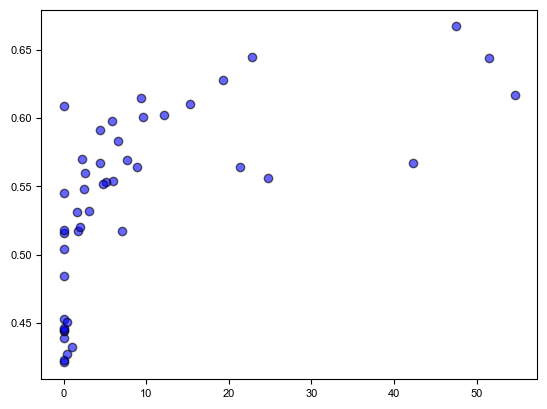

In [180]:
df = estreams_attributes_dfs_all["FR000867"].loc[:, [
       'baseflow_index', 

       'perm_verylow_glob', 'perm_verylow_cont', "perm_high_cont", "perm_low_cont"]]

plt.scatter(df['perm_verylow_glob'], df['baseflow_index'], color='blue', alpha=0.6, edgecolor='black')

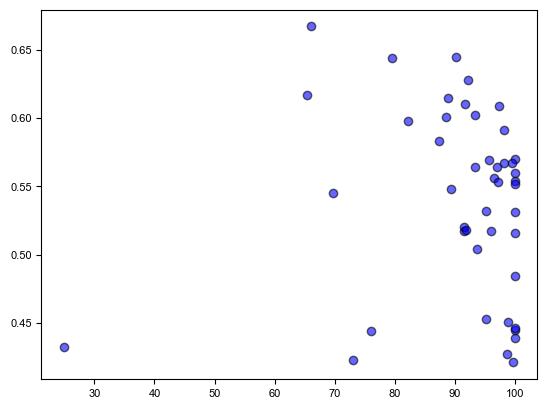

In [181]:
plt.scatter(df['perm_verylow_cont'], df['baseflow_index'], color='blue', alpha=0.6, edgecolor='black')


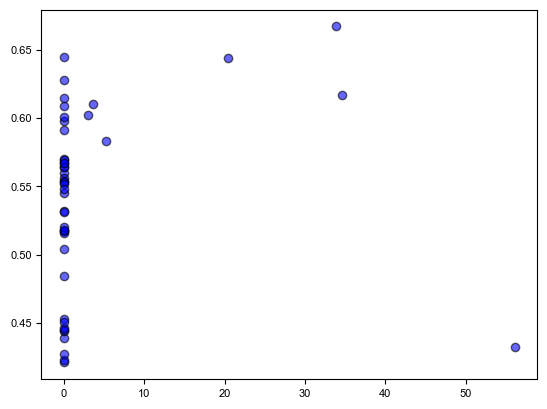

In [156]:
plt.scatter(df['perm_low_cont'], df['baseflow_index'], color='blue', alpha=0.6, edgecolor='black')


In [157]:
estreams_attributes_dfs_all["FR003986"].loc[:, ['perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont']]

# Apply condition and count occurrences
counts = estreams_attributes_dfs_all["FR001604"]["perm_verylow_glob"].lt(1).sum()
print(counts)

# Apply condition and count occurrences
counts = estreams_attributes_dfs_all["FR001604"]["perm_verylow_cont"].lt(1).sum()
print(counts)

# Total
counts = estreams_attributes_dfs_all["FR001604"]["perm_verylow_cont"].gt(0).sum()
print(counts)

40
23
44


## Area of Moselle within each country

In [158]:
catchment_boundaries[catchment_boundaries.basin_id == "DEBU1959"]

,gauge_id,country,area_offic,area_estre,area_flag,area_rel,start_date,end_date,gauge_flag,upstream,group,geometry,basin_id
basin_id,,,,,,,,,,,,,
DEBU1959,26900400,DE,27088.0,27100.0,0,-0.0443,1901-01-01,2021-07-31,B,210,1,"POLYGON Z ((7.14374 50.13125 0.00000, 7.14374 ...",DEBU1959


In [159]:
import geopandas as gpd
from shapely.geometry import shape

# Load the world countries shapefile from GeoPandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Load your shapefile (replace 'your_shapefile.shp' with the path to your file)
your_shapefile = catchment_boundaries[catchment_boundaries.basin_id == "DEBU1959"].copy()

# Ensure both datasets are in the same CRS (WGS84, EPSG:4326)
your_shapefile = your_shapefile.to_crs(epsg=4326)
world = world.to_crs(epsg=4326)

# Reproject to an equal-area projection for accurate area calculations (e.g., World Eckert IV, EPSG:54012)
equal_area_crs = 'EPSG:3035'  # World Eckert IV projection
your_shapefile = your_shapefile.to_crs(equal_area_crs)
world = world.to_crs(equal_area_crs) 

# Perform a spatial join to find intersections
intersections = gpd.overlay(your_shapefile, world, how='intersection')

# Calculate the area of each intersection
intersections['area'] = intersections.geometry.area

# Calculate the total area of your shapefile
total_area = your_shapefile.geometry.area.sum()

# Group by country and calculate the percentage of area
results = intersections.groupby('name')['area'].sum().reset_index()
results['percentage'] = (results['area'] / total_area) * 100

# Sort by percentage (descending)
results = results.sort_values(by='percentage', ascending=False)

# Print the results
print(results)

         name          area  percentage
1      France  1.478713e+10   54.540232
2     Germany  9.927611e+09   36.616599
3  Luxembourg  2.024718e+09    7.467889
0     Belgium  3.728705e+08    1.375280


# Drop in correlations from the headwaters to the outlet

## Drop in correlation: Moselle

In [160]:
from utils.functions import compute_correlation_score, find_unique_nested_catchments, find_directly_connected_catchments
from utils.plots import plot_histograms_by_group, plot_histograms_by_group_two_subsets, plot_watershed_groups_from_dict

In [161]:
# First we define the outlet of the Moselle to be used
outlets = ["DEBU1959"]
nested_cats_df = nested_catchments.loc[outlets, :]
nested_cats_df

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

estreams_attributes_dfs["DEBU1959"]

# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in estreams_attributes_dfs.keys():

        estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
        #estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date > "2009"]
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       "perm_verylow_regi", "perm_low_regi", "perm_medium_regi", "perm_high_regi",
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict.keys())
correlation_dict["baseflow_index"]

100%|██████████| 14/14 [00:00<00:00, 33.39it/s]

dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


,DEBU1959
p_mean,0.245129
pet_mean,-0.220092
aridity,-0.246028
p_seasonality,-0.129408
frac_snow,0.207157
hp_freq,-0.070253
hp_dur,0.058948
hp_time,0.163094
lp_freq,-0.084574
lp_dur,-0.138445


['FR003253', 'FR003262', 'FR000156', 'FR000158', 'FR000159', 'FR003265', 'FR000163', 'FR003272', 'FR003273', 'FR003284', 'DEBU1956', 'DEBU1958', 'DEBU1959']


100%|██████████| 14/14 [00:00<00:00, 35.60it/s]


dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


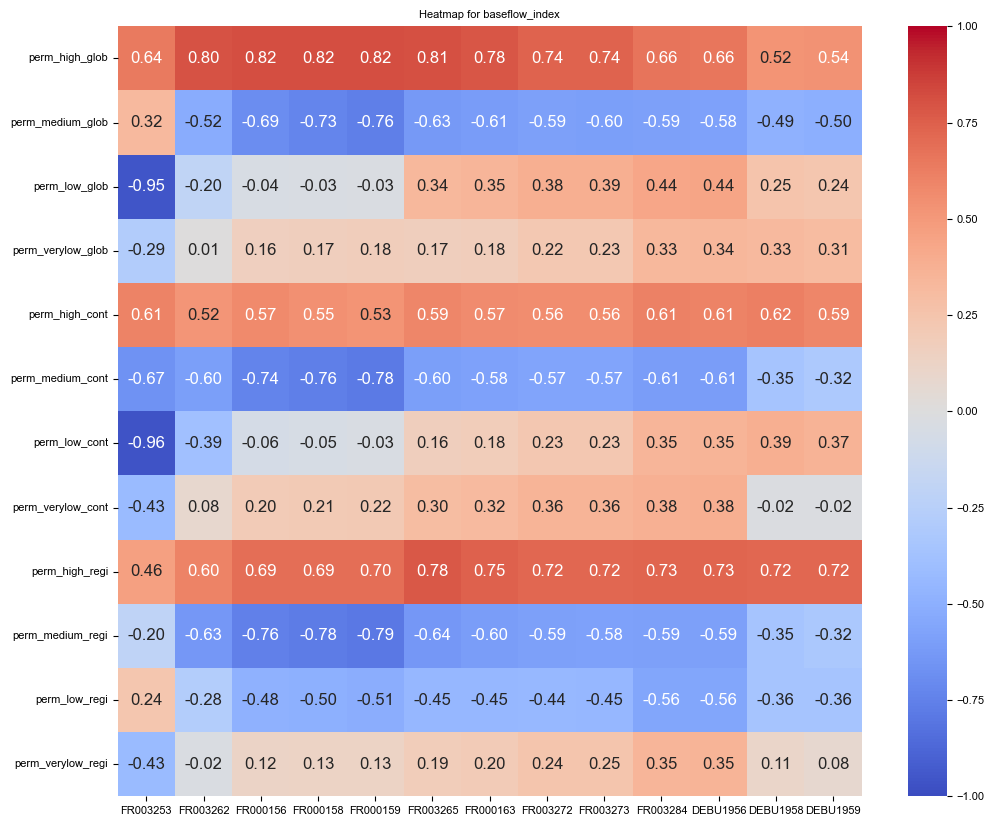

In [162]:
# Filter the catchments in Moselle
catchment = "DEBU1959"
cats_moselle = estreams_attributes_dfs[catchment].index.tolist()

# Filter the attributes for Moselle
estreams_attributes_moselle = estreams_attributes.loc[cats_moselle, :]

# Here we filter again for only the catchments with above a certain number of gauges
list_cats = estreams_attributes_moselle[estreams_attributes_moselle.gauges_upstream >= 5].sort_values(by='gauges_upstream', ascending=True)["gauges_upstream"].index.tolist()

# Create the final potential list of nested
nested_cats_df = nested_catchments.loc[list_cats, :]

 # Find the catchemnts using the headwater (visually selected)
moselle_main = find_directly_connected_catchments(nested_cats_df, "FR003253") #FR000128
print(moselle_main)

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_moselle_dfs = {}

for catchment in tqdm.tqdm(moselle_main):
    
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_moselle_dfs[catchment] = cat_clip


# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict_moselle = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in moselle_main:

        estreams_attributes_dfs_cat = estreams_attributes_moselle_dfs[catchment]

        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 
       'perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont',
       'perm_high_regi',
       'perm_medium_regi', 'perm_low_regi', 'perm_verylow_regi',
       ]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict_moselle[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict_moselle.keys())

 # q_mean corrrelations:
signature = "baseflow_index"
correlation_df = correlation_dict_moselle[signature]

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt=".2f", vmin = -1, vmax = 1)

plt.title(f'Heatmap for {signature}')

plt.show()

In [163]:
data_for_plot_drops_rs_bfi = correlation_dict_moselle["baseflow_index"].T[["perm_high_glob"]]
data_for_plot_drops_rs_bfi = data_for_plot_drops_rs_bfi.loc[["FR000159", "FR003265", "FR003273", "FR003284",  "DEBU1959"],:]
data_for_plot_drops_rs_bfi


,perm_high_glob
FR000159,0.816316
FR003265,0.808817
FR003273,0.738577
FR003284,0.664588
DEBU1959,0.537650


<Axes: >

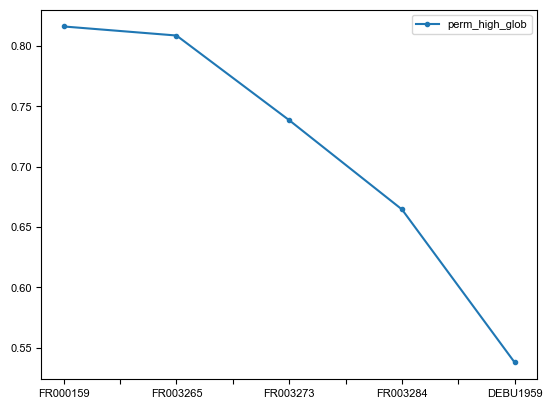

In [164]:
data_for_plot_drops_rs_bfi.plot(marker='o', markersize=3)  # Add marker and size

In [165]:
data_for_plot_drops_rs_qmean = correlation_dict_moselle["slope_sawicz"].T[["perm_high_glob"]]
data_for_plot_drops_rs_qmean = data_for_plot_drops_rs_qmean.loc[["FR000159", "FR003265", "FR003273", "FR003284",  "DEBU1959"],:]
data_for_plot_drops_rs_qmean

,perm_high_glob
FR000159,-0.492216
FR003265,-0.597509
FR003273,-0.547176
FR003284,-0.542512
DEBU1959,-0.217995


In [166]:
# Initialize an empty dictionary to store the highest correlation coefficients
max_correlation_dict_moselle = {}

# Iterate over each variable in the correlation_dict
for variable, df in correlation_dict_moselle.items():
    # Get the maximum correlation coefficient for each group
    max_correlation = df.abs().max(axis=0)
    # Store the maximum correlation coefficients in the dictionary
    max_correlation_dict_moselle[variable] = max_correlation

# Create a DataFrame from the dictionary
max_correlation_moselle_df_FR003298 = pd.DataFrame(max_correlation_dict_moselle)

# Print the DataFrame
max_correlation_moselle_df_FR003298

,q_mean,q_runoff_ratio,q_elas_Sankarasubramanian,slope_sawicz,baseflow_index,hfd_mean,hfd_std,q_5,q_95,hq_freq,hq_dur,lq_freq,lq_dur,zero_q_freq
FR003253,0.785714,0.704187,0.750000,0.926562,0.964286,0.678571,0.678571,0.607143,0.964286,0.852437,0.714286,0.821429,0.642857,NaN
FR003262,0.859908,0.789665,0.607892,0.568627,0.799174,0.835810,0.338034,0.806654,0.908625,0.840129,0.190918,0.791538,0.599587,NaN
FR000156,0.833296,0.762776,0.571990,0.618401,0.819363,0.864826,0.413081,0.846795,0.843371,0.882372,0.302597,0.813251,0.557973,NaN
FR000158,0.823823,0.751677,0.553230,0.658957,0.819441,0.792208,0.433284,0.856817,0.848488,0.875085,0.305477,0.809941,0.559164,NaN
FR000159,0.817357,0.744312,0.508669,0.647976,0.816316,0.755929,0.457801,0.843874,0.850414,0.846838,0.286138,0.810971,0.552014,NaN
FR003265,0.890240,0.814816,0.571593,0.597509,0.808817,0.697254,0.308477,0.864203,0.853170,0.767152,0.420100,0.767889,0.575664,0.248383
FR000163,0.882858,0.819435,0.588666,0.633177,0.781857,0.638517,0.332189,0.880062,0.841910,0.792960,0.496068,0.780580,0.607808,0.231198
FR003272,0.875256,0.822338,0.649249,0.570593,0.736369,0.609177,0.317269,0.893630,0.840567,0.798389,0.554614,0.723356,0.610406,0.219019
FR003273,0.870296,0.824867,0.648825,0.566697,0.738577,0.608443,0.318665,0.894363,0.829693,0.795285,0.558951,0.722179,0.604447,0.217193
FR003284,0.845971,0.800021,0.627609,0.682414,0.733233,0.601218,0.229176,0.872365,0.794936,0.769539,0.607426,0.779724,0.671672,0.265538


## Drop in correlation: FR003986

In [167]:
# First we define the outlet of the Moselle to be used
outlets = ["FR003986"]
nested_cats_df = nested_catchments.loc[outlets, :]
nested_cats_df

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

estreams_attributes_dfs["FR003986"]

# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in estreams_attributes_dfs.keys():

        estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
        #estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date > "2009"]
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       "perm_verylow_regi", "perm_low_regi", "perm_medium_regi", "perm_high_regi",
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict.keys())
correlation_dict["baseflow_index"]

100%|██████████| 14/14 [00:00<00:00, 30.91it/s]

dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


,FR003986
p_mean,0.391240
pet_mean,-0.314021
aridity,-0.369438
p_seasonality,-0.372360
frac_snow,0.218701
hp_freq,-0.184990
hp_dur,0.371544
hp_time,0.271653
lp_freq,-0.368499
lp_dur,-0.224677


['FR001191', 'FR003940', 'FR001196', 'FR001199', 'FR001200', 'FR003943', 'FR001203', 'FR001205', 'FR003945', 'FR003953', 'FR003954', 'FR003984', 'FR003986']


  0%|          | 0/13 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 18.71it/s]


dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


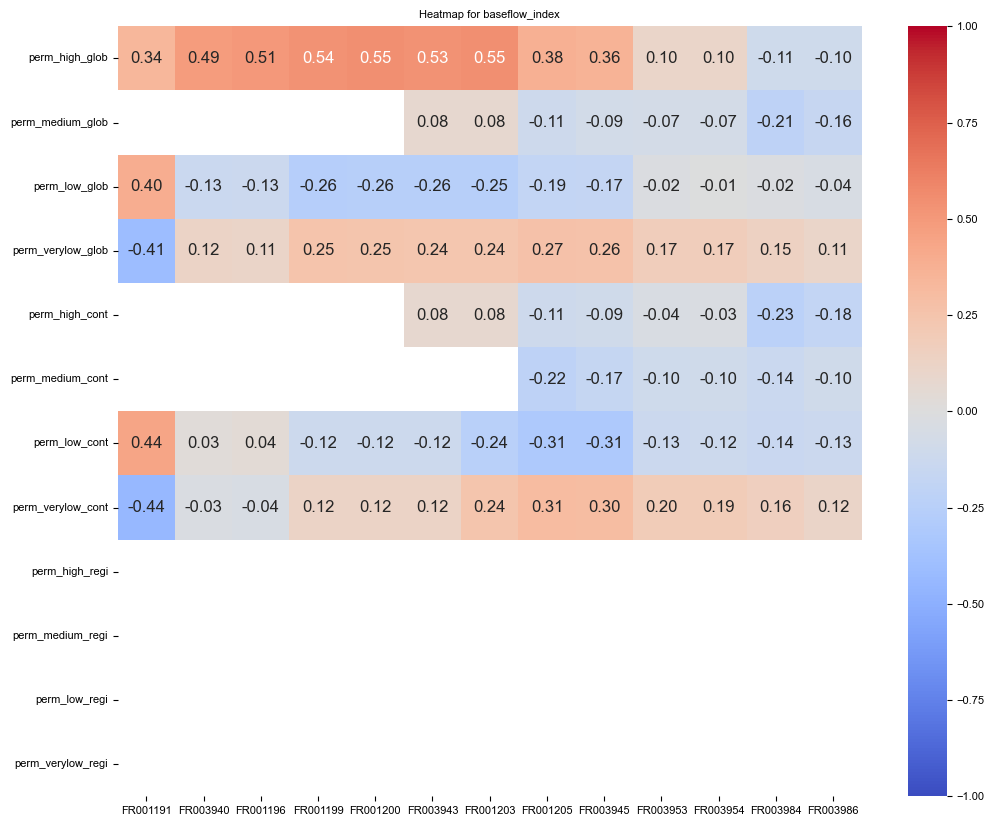

In [168]:
# Filter the catchments in Moselle
catchment = "FR003986"
cats_moselle = estreams_attributes_dfs[catchment].index.tolist()

# Filter the attributes for Moselle
estreams_attributes_moselle = estreams_attributes.loc[cats_moselle, :]

# Here we filter again for only the catchments with above a certain number of gauges
list_cats = estreams_attributes_moselle[estreams_attributes_moselle.gauges_upstream >= 5].sort_values(by='gauges_upstream', ascending=True)["gauges_upstream"].index.tolist()

# Create the final potential list of nested
nested_cats_df = nested_catchments.loc[list_cats, :]

 # Find the catchemnts using the headwater (visually selected)
moselle_main = find_directly_connected_catchments(nested_cats_df, "FR001191") #FR000128
print(moselle_main)

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_moselle_dfs = {}

for catchment in tqdm.tqdm(moselle_main):
    
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_moselle_dfs[catchment] = cat_clip


# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict_moselle = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in moselle_main:

        estreams_attributes_dfs_cat = estreams_attributes_moselle_dfs[catchment]

        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 
       'perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont',
       'perm_high_regi',
       'perm_medium_regi', 'perm_low_regi', 'perm_verylow_regi',
       ]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict_moselle[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict_moselle.keys())

 # q_mean corrrelations:
signature = "baseflow_index"
correlation_df = correlation_dict_moselle[signature]

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt=".2f", vmin = -1, vmax = 1)

plt.title(f'Heatmap for {signature}')

plt.show()

## Drop in correlation: PL000936

100%|██████████| 14/14 [00:00<00:00, 55.31it/s]


dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])
['PL000927', 'PL000928', 'PL000929', 'PL000930', 'PL000931', 'PL000932', 'PL000933', 'PL000934', 'PL000935', 'PL000936']


100%|██████████| 14/14 [00:00<00:00, 22.70it/s]


dict_keys(['q_mean', 'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq'])


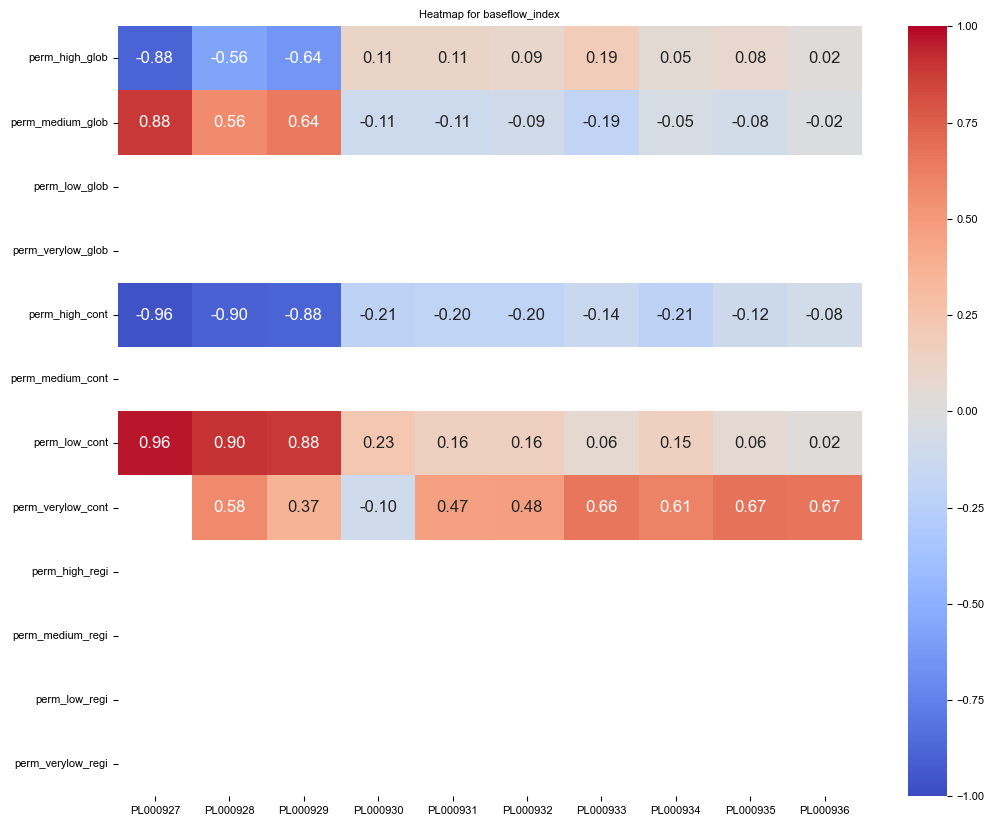

In [169]:
# First we define the outlet of the Moselle to be used
outlets = ["PL000936"]
nested_cats_df = nested_catchments.loc[outlets, :]
nested_cats_df

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

estreams_attributes_dfs["PL000936"]

# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in estreams_attributes_dfs.keys():

        estreams_attributes_dfs_cat = estreams_attributes_dfs[catchment]
        #estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[estreams_attributes_dfs_cat.end_date > "2009"]
        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',

       'perm_verylow_glob','perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 
       'perm_verylow_cont', 'perm_low_cont', 'perm_medium_cont', 'perm_high_cont',
       "perm_verylow_regi", "perm_low_regi", "perm_medium_regi", "perm_high_regi",
       
       'root_dep_mean', 'root_dep_max', 'root_dep_min', 'soil_tawc_mean',
       'soil_fra_sand_mean', 'soil_fra_silt_mean', 'soil_fra_clay_mean',
       'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'sno_cov_mean', 'irri_1990', 'irri_2005', 'stations_num_p_mean', "area_estreams"]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict.keys())
correlation_dict["baseflow_index"]



# Filter the catchments in Moselle
catchment = "PL000936"
cats_moselle = estreams_attributes_dfs[catchment].index.tolist()

# Filter the attributes for Moselle
estreams_attributes_moselle = estreams_attributes.loc[cats_moselle, :]

# Here we filter again for only the catchments with above a certain number of gauges
list_cats = estreams_attributes_moselle[estreams_attributes_moselle.gauges_upstream >= 5].sort_values(by='gauges_upstream', ascending=True)["gauges_upstream"].index.tolist()

# Create the final potential list of nested
nested_cats_df = nested_catchments.loc[list_cats, :]

 # Find the catchemnts using the headwater (visually selected)
moselle_main = find_directly_connected_catchments(nested_cats_df, "PL000927") #FR000128
print(moselle_main)

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_moselle_dfs = {}

for catchment in tqdm.tqdm(moselle_main):
    
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_catchments.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_moselle_dfs[catchment] = cat_clip


# Store the correlation matrices for selected catchments in a dictionary:
# Initialize an empty dictionary to store correlation DataFrames for the selected variables
correlation_dict_moselle = {}

# Iterate over each variable in the first 14 columns of your data
for variable in tqdm.tqdm(estreams_attributes.columns[29:43]):
    # Initialize an empty DataFrame to store correlations
    correlation_df = pd.DataFrame()

    # Iterate over each watershed group
    for catchment in moselle_main:

        estreams_attributes_dfs_cat = estreams_attributes_moselle_dfs[catchment]

        estreams_attributes_dfs_cat = estreams_attributes_dfs_cat[['q_mean',
       'q_runoff_ratio', 'q_elas_Sankarasubramanian', 'slope_sawicz',
       'baseflow_index', 'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq',
       'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 
       'perm_high_glob',
       'perm_medium_glob', 'perm_low_glob', 'perm_verylow_glob',
       'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont',
       'perm_high_regi',
       'perm_medium_regi', 'perm_low_regi', 'perm_verylow_regi',
       ]]
        
        # Calculate correlations between the current variable and other variables
        correlations = estreams_attributes_dfs_cat.corr(method="spearman")[variable].iloc[14:] # We should check carefully
        
        # Add the correlations to the DataFrame
        correlation_df[catchment] = correlations

    # Add the correlation DataFrame to the dictionary
    correlation_dict_moselle[variable] = correlation_df

# Print the keys of the correlation dictionary
print(correlation_dict_moselle.keys())

 # q_mean corrrelations:
signature = "baseflow_index"
correlation_df = correlation_dict_moselle[signature]

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt=".2f", vmin = -1, vmax = 1)

plt.title(f'Heatmap for {signature}')

plt.show()

# End